In [6]:
import numpy as np
import scipy.sparse as sp
import scipy.sparse.linalg as spla
import matplotlib.pyplot as plt 
import scienceplots
plt.style.use(['science', 'no-latex', 'notebook'])

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

mpl.rcParams.update({
    'font.family':       'serif',
    'font.serif':        ['Computer Modern Roman'],
    'text.usetex':       True,
    'font.size':         9,
    'axes.labelsize':    9,
    'legend.fontsize':   8,
    'xtick.labelsize':   8,
    'ytick.labelsize':   8,
    'axes.linewidth':    0.5,
    'xtick.major.width': 0.5,
    'ytick.major.width': 0.5,
    'xtick.minor.width': 0.5,
    'ytick.minor.width': 0.5,
    'xtick.major.size':  3,
    'ytick.major.size':  3,
    'xtick.minor.size':  1.5,
    'ytick.minor.size':  1.5,
    'xtick.direction':   'in',
    'ytick.direction':   'in',
    'xtick.top':         True,
    'ytick.right':       True,
    'figure.dpi':        300,
})

colors  = ['#03AED2', '#D12052', '#F8DE22', '#F45B26']

In [3]:
def ssh_energies(band, omega_q, gc1, gc2, k):
    delta = np.sqrt(gc1**2 + gc2**2 + 2 * gc1 * gc2 * np.cos(k))
    if band == 0:
        return omega_q * np.sqrt(1 + 2 * delta / omega_q)
    else:
        return omega_q * np.sqrt(1 - 2 * delta / omega_q)

class PBCSSHChain:
    def __init__(self, N, omega_c, chi_c):
        self.N       = N
        self.omega_c = omega_c
        self.chi_c   = chi_c
        self.g1 = g1 = 0.25 * omega_c * (1 + chi_c)
        self.g2 = g2 = 0.25 * omega_c * (1 - chi_c)

        n = 2 * N
        T = np.zeros((n, n))
        for j in range(n - 1):
            val = g1 if j % 2 == 0 else g2
            T[j, j+1] = T[j+1, j] = val
        if N != 1:
            T[0, n-1] = T[n-1, 0] = g2

        A =  0.5 * (np.eye(n) + T)
        B = -0.5 * T
        self.H = np.block([[ A,  B],
                           [-B, -A]])

    def eigs(self):
        eigenvals, eigenvecs = np.linalg.eig(self.H)
        eigenvals = np.real(eigenvals)
        idx = np.argsort(eigenvals)
        eigenvals = eigenvals[idx]
        eigenvecs = eigenvecs[:, idx]
        return 2 * eigenvals[2*self.N:], eigenvecs[:, 2*self.N:]

    def analytical_energies(self):
        k_values = np.fft.fftshift(np.fft.fftfreq(self.N, d=1.0/(2*np.pi)))
        if self.N == 1:
            alpha = ssh_energies(0, 1.0, self.g1, 0.0, k_values)
            beta  = ssh_energies(1, 1.0, self.g1, 0.0, k_values)
        else:
            alpha = ssh_energies(0, 1.0, self.g1, self.g2, k_values)
            beta  = ssh_energies(1, 1.0, self.g1, self.g2, k_values)
        return np.atleast_1d(alpha), np.atleast_1d(beta)

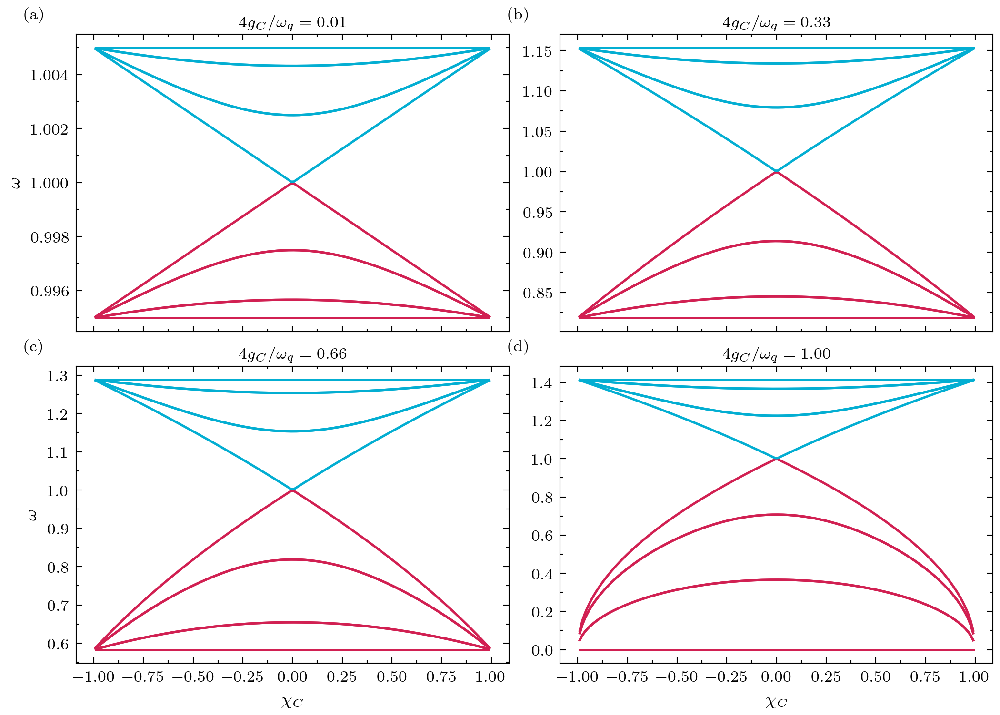

In [95]:
N             = 6
Omega_C_values = [0.01, 0.33, 0.66, 1.0]   # four panels
Chi_C_values  = np.linspace(-0.99, 0.99, 150)

nrows, ncols  = 2, 2
fig_width     = 7.0
fig_height    = 5.0
panel_fontsize = 8

# ------------------------------------------------------------------ #
# Compute spectra
# ------------------------------------------------------------------ #
all_energies = []
for Omega_C in Omega_C_values:
    energies = []
    for Chi_C in Chi_C_values:
        chain = PBCSSHChain(N=N, omega_c=Omega_C, chi_c=Chi_C)
        vals, _ = chain.eigs()
        energies.append(vals)
    all_energies.append(np.array(energies))

# ------------------------------------------------------------------ #
# Figure
# ------------------------------------------------------------------ #
fig, axes = plt.subplots(nrows=nrows, ncols=ncols,
                         figsize=(fig_width, fig_height))

for idx, (Omega_C, energies) in enumerate(zip(Omega_C_values, all_energies)):
    ax  = axes.flatten()[idx]
    row = idx // ncols
    col = idx  % ncols

    scaled = energies
    edge_thresh = 0.1

    for band in scaled.T:
        mean_val = np.mean(band)
        edge_val = np.mean(np.abs([band[0], band[-1]]))

        if idx == len(Omega_C_values) - 1 and edge_val < edge_thresh:
            color = colors[1]
        elif mean_val < 1:
            color = colors[1]
        else:
            color = colors[0]

        ax.plot(Chi_C_values, band, color=color, lw=1.2)  # ← this was missing

    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator(2))

    ax.text(-0.12, 1.04, f'({chr(97 + idx)})',
            transform=ax.transAxes,
            fontsize=panel_fontsize, fontweight='bold',
            va='bottom', ha='left')

    ax.set_title(rf'$4g_C / \omega_q = {Omega_C:.2f}$', fontsize=8, pad=4)

    if row == nrows - 1:
        ax.set_xlabel(r'$\chi_C$')
    else:
        ax.tick_params(labelbottom=False)

    if col == 0:
        ax.set_ylabel(r'$\omega$')
    # else:
    #     ax.tick_params(labelleft=False)

fig.tight_layout(pad=0.4, h_pad=0.5, w_pad=0.5)
# plt.savefig('../../../figures/export/pbc_bands.png', dpi = 600)
plt.show()

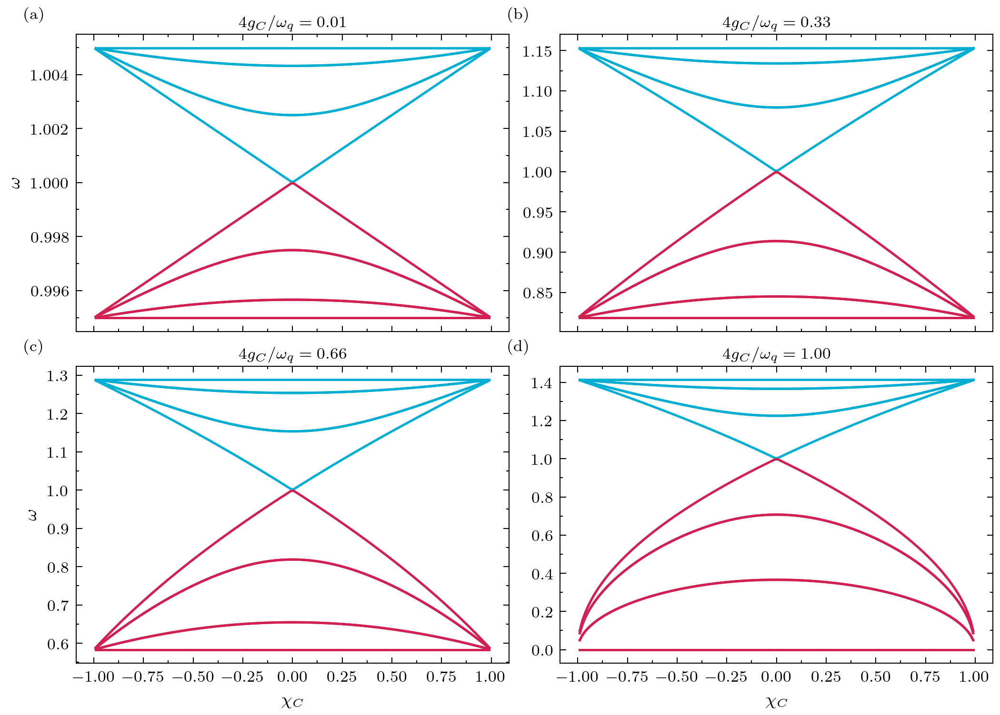

In [96]:
N             = 6
Omega_C_values = [0.01, 0.33, 0.66, 1.0]   # four panels
Chi_C_values  = np.linspace(-0.99, 0.99, 150)

nrows, ncols  = 2, 2
fig_width     = 7.0
fig_height    = 5.0
panel_fontsize = 8

# ------------------------------------------------------------------ #
# Compute spectra
# ------------------------------------------------------------------ #
all_energies = []
for Omega_C in Omega_C_values:
    energies = []
    for Chi_C in Chi_C_values:
        chain = PBCSSHChain(N=N, omega_c=Omega_C, chi_c=Chi_C)
        alpha_energies, beta_energies = chain.analytical_energies()
        energies.append(np.concatenate((alpha_energies, beta_energies)))
    all_energies.append(np.array(energies))

# ------------------------------------------------------------------ #
# Figure
# ------------------------------------------------------------------ #
fig, axes = plt.subplots(nrows=nrows, ncols=ncols,
                         figsize=(fig_width, fig_height))

for idx, (Omega_C, energies) in enumerate(zip(Omega_C_values, all_energies)):
    ax  = axes.flatten()[idx]
    row = idx // ncols
    col = idx  % ncols

    scaled = energies
    edge_thresh = 0.0

    for band in scaled.T:
        mean_val = np.mean(band)
        edge_val = np.mean(np.abs([band[0], band[-1]]))

        if idx == len(Omega_C_values) - 1 and edge_val < edge_thresh:
            color = colors[1]
        elif mean_val < 1:
            color = colors[1]
        else:
            color = colors[0]

        ax.plot(Chi_C_values, band, color=color, lw=1.2)  # ← this was missing

    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator(2))

    ax.text(-0.12, 1.04, f'({chr(97 + idx)})',
            transform=ax.transAxes,
            fontsize=panel_fontsize, fontweight='bold',
            va='bottom', ha='left')

    ax.set_title(rf'$4g_C / \omega_q = {Omega_C:.2f}$', fontsize=8, pad=4)

    if row == nrows - 1:
        ax.set_xlabel(r'$\chi_C$')
    else:
        ax.tick_params(labelbottom=False)

    if col == 0:
        ax.set_ylabel(r'$\omega$')
    # else:
    #     ax.tick_params(labelleft=False)

fig.tight_layout(pad=0.4, h_pad=0.5, w_pad=0.5)
# plt.savefig('../../../figures/export/obc_bands.pdf', dpi = 600)
plt.show()

In [97]:
class OBCSSHChain:
    def __init__(self, N, omega_c, chi_c):
        self.N       = N
        self.omega_c = omega_c
        self.chi_c   = chi_c
        self.g1 = g1 = 0.25 * omega_c * (1 + chi_c)
        self.g2 = g2 = 0.25 * omega_c * (1 - chi_c)

        n = 2 * N
        T = np.zeros((n, n))
        for j in range(n - 1):
            val = g1 if j % 2 == 0 else g2
            T[j, j+1] = T[j+1, j] = val
        # no PBC corner term for OBC

        A =  0.5 * (np.eye(n) + T)
        B = -0.5 * T
        self.H = np.block([[ A,  B],
                           [-B, -A]])

    def eigs(self):
        eigenvals, eigenvecs = np.linalg.eig(self.H)
        eigenvals = np.real(eigenvals)
        idx = np.argsort(eigenvals)
        eigenvals = eigenvals[idx]
        eigenvecs = eigenvecs[:, idx]
        return 2 * eigenvals[2*self.N:], eigenvecs[:, 2*self.N:]

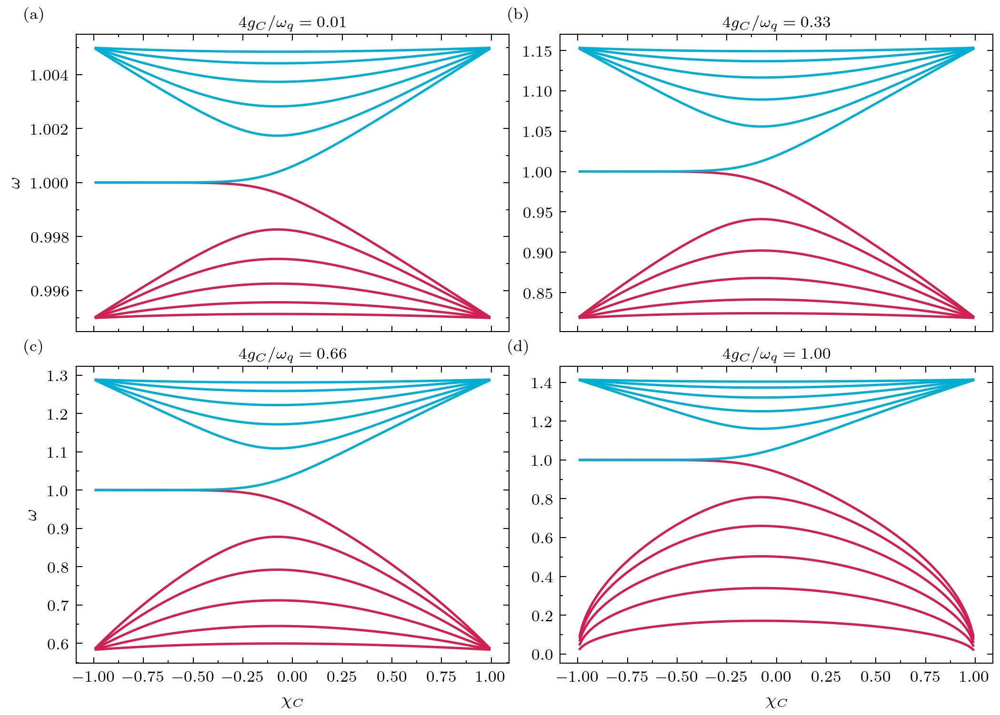

In [98]:
N             = 6
Omega_C_values = [0.01, 0.33, 0.66, 1.0]   # four panels
Chi_C_values  = np.linspace(-0.99, 0.99, 150)

nrows, ncols  = 2, 2
fig_width     = 7.0
fig_height    = 5.0
panel_fontsize = 8

# ------------------------------------------------------------------ #
# Compute spectra
# ------------------------------------------------------------------ #
all_energies = []
for Omega_C in Omega_C_values:
    energies = []
    for Chi_C in Chi_C_values:
        chain = OBCSSHChain(N=N, omega_c=Omega_C, chi_c=Chi_C)
        vals, _ = chain.eigs()
        energies.append(vals)
    all_energies.append(np.array(energies))

# ------------------------------------------------------------------ #
# Figure
# ------------------------------------------------------------------ #
fig, axes = plt.subplots(nrows=nrows, ncols=ncols,
                         figsize=(fig_width, fig_height))

for idx, (Omega_C, energies) in enumerate(zip(Omega_C_values, all_energies)):
    ax  = axes.flatten()[idx]
    row = idx // ncols
    col = idx  % ncols

    scaled = energies
    edge_thresh = 0.1

    for band in scaled.T:
        mean_val = np.mean(band)
        edge_val = np.mean(np.abs([band[0], band[-1]]))

        if idx == len(Omega_C_values) - 1 and edge_val < edge_thresh:
            color = colors[1]
        elif mean_val < 1.0:
            color = colors[1]
        else:
            color = colors[0]

        ax.plot(Chi_C_values, band, color=color, lw=1.2)  # ← this was missing

    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator(2))

    ax.text(-0.12, 1.04, f'({chr(97 + idx)})',
            transform=ax.transAxes,
            fontsize=panel_fontsize, fontweight='bold',
            va='bottom', ha='left')

    ax.set_title(rf'$4g_C / \omega_q = {Omega_C:.2f}$', fontsize=8, pad=4)

    if row == nrows - 1:
        ax.set_xlabel(r'$\chi_C$')
    else:
        ax.tick_params(labelbottom=False)

    if col == 0:
        ax.set_ylabel(r'$\omega$')
    # else:
    #     ax.tick_params(labelleft=False)

fig.tight_layout(pad=0.4, h_pad=0.5, w_pad=0.5)
# plt.savefig('../../../figures/export/obc_bands.png', dpi = 600)
plt.show()

# Obtención del hamiltoniano con acoplamiento al fotón
Implementamos una solución numérica que consiste en diagonalizar el sistema original para obtener las expresiones de los operadores de creación y destrucción nuevos en términos de los anteriores:
$$
\tilde \eta_i = T_{ij} b_j + S_{ij} b_j^\dag
$$
transformación la cual escribiremos como
$$
\mathbf b = \mathcal T \mathbf \eta
$$
con 
$$
\mathbf b = \begin{pmatrix}
b_1\\ \vdots \\ b_N \\ b_1^\dag \\ \vdots \\ b_N^\dag
\end{pmatrix}\quad \mathbf \eta = \begin{pmatrix}
\eta_1 \\ \vdots \\ \eta_N \\ \eta_1^\dag \\ \vdots \\ \eta_N^\dag
\end{pmatrix}
$$
dado que el hamiltoniano de acoplamiento al fotón es cuadrático, podemos escribir
$$
\hat H = \hbar \omega_c \hat a^\dag \hat a + \mathbf b^\dag \mathbb H_C \mathbf b - \sin(\gamma (\hat a^\dag + \hat a)) \sum{\mathbf b^\dag \mathbb H_J \mathbb b}
$$
$$
\hat H = \hbar \omega_c \hat a^\dag \hat a + \mathbf \eta^\dag \mathcal T^\dag \mathbb H_C \mathcal T \mathbf \eta - \sin(\gamma (\hat a^\dag + \hat a)) \sum{\mathbf \eta^\dag\mathcal T^\dag \mathbb H_J \mathcal T \mathbb \eta}
$$
en particular nos interesa que $\mathcal T$ sea la transformación que diagonaliza el hamiltoniano capacitivo. Esta se puede construir diagonalizando la matriz dinámica asociada:
$$
(\mathbb I_N \otimes \sigma_z)\mathbb D \mathbf x_i = \omega_i \mathbf x_i
$$
dichos autovalores vienen de a pares positivo y negativo, el ordenamiento de la base tiene que ser tal que los autovectores de autovalor positivo queden primero y se conserve el orden relativo entre estos y sus contrapartes de autovalor negativo.

Finalmente, para diagonalizar el hamiltoniano resultante, hacemos una diagonalización en bloques que conservan el número de partículas. En particular, los términos que terminan resultando del hamiltoniano $\mathbb H_J$ transformado son solo términos que conservan el número de partículas o bien cambian este número en dos. Por tanto, solo es necesario ir aumentando la dimensión del espacio de Hilbert en bloques que cambian en dos el número de excitaciones total del sistema para encontrar convergencia.

In [1]:
import numpy as np
from scipy.special import genlaguerre, gammaln
from itertools import product
import scipy.sparse as sp
import scipy.sparse.linalg as sla
import scipy.linalg as la
def ssh_energies(band, omega_q, gc1, gc2, k):
    delta = np.sqrt(gc1**2 + gc2**2 + 2 * gc1 * gc2 * np.cos(k))
    if band == 0:
        return omega_q * np.sqrt(1 + 2 * delta / omega_q)
    else:
        return omega_q * np.sqrt(1 - 2 * delta / omega_q)
    
    
def _eye(d):
    return sp.eye(d, format='csr')

def _destroy(d):
    data = np.sqrt(np.arange(1, d, dtype=float))
    return sp.diags(data, 1, shape=(d, d), format='csr')

def _num(d):
    return sp.diags(np.arange(d, dtype=float), 0, format='csr')

def compositions(n, total):
    if n == 1:
        yield [total]
        return
    for first in range(total + 1):
        for rest in compositions(n - 1, total - first):
            yield [first] + rest

def compute_position_exponential_sparse(N, u):
    matrix = np.zeros((N, N), dtype=complex)
    for m in range(N):
        for n in range(N):
            if m >= n:
                matrix[m, n] = (
                    np.exp(-u**2 / 2)
                    * np.exp(0.5 * (gammaln(n + 1) - gammaln(m + 1)))
                    * (1.0j * u) ** (m - n)
                    * genlaguerre(n, m - n)(u**2)
                )
            else:
                matrix[m, n] = (
                    np.exp(-u**2 / 2)
                    * np.exp(0.5 * (gammaln(m + 1) - gammaln(n + 1)))
                    * (1.0j * u) ** (n - m)
                    * genlaguerre(m, n - m)(u**2)
                )
    return sp.csr_matrix(matrix)
    
class PHOTONICChain:
    """Clase general para la cadena de transmons acoplada al resonador
    Se trabaja en la representación adimensionalizada y se puede elegir si se trabaja con OBC o PBC
    
    La idea es diagonalizar la matriz dinámica asociada a la parte capacitiva del hamiltoniano y encontrar la base que lo diagonaliza.
    
    """
    def __init__(self, N, Omega_C, Chi_C, omega_r, gamma, fock_photon, Omega_J, Chi_J, PBC = False):
        self.N       = N
        self.Omega_C = Omega_C
        self.Chi_C   = Chi_C
        self.gc1 = gc1 = 0.25 * Omega_C * (1 + Chi_C)
        self.gc2 = gc2 = 0.25 * Omega_C * (1 - Chi_C)
        self.Omega_J = Omega_J
        self.Chi_J   = Chi_J
        self.gj1 = gj1 =  Omega_J * (1 + Chi_J) # omega_J no tiene un factor 4 como lo tiene Omega_c
        self.gj2 = gj2 = -Omega_J * (1 - Chi_J)
        self.omega_r = omega_r
        self.gamma = gamma
        self.fock_photon = fock_photon

        n = 2 * N
        T = np.zeros((n, n))
        for j in range(n - 1):
            val = gc1 if j % 2 == 0 else gc2
            T[j, j+1] = T[j+1, j] = val
        if PBC and N != 1:
            T[0, n-1] = T[n-1, 0] = gc2

        A =  0.5 * (np.eye(n) + T)
        B = -0.5 * T

        tau_z = np.block([
            [ np.eye(n),         np.zeros((n, n))],
            [ np.zeros((n, n)), -np.eye(n)       ]
        ])

        # Van Hemmen: diagonalize the dynamical matrix I_hat @ D = tau_z @ D_herm
        D_herm = np.block([[A, B],
                   [B, A]])  # real symmetric, keep it real

        L = np.linalg.cholesky(D_herm)          # D_herm = L @ L.T
        M_sym = L.T @ tau_z @ L                 # real symmetric

        evals_sym, evecs_sym = la.eigh(M_sym)   # real evals and evecs, sorted

        evecs_real = la.solve_triangular(L.T, evecs_sym)  # back to x = (L.T)^{-1} y

        eigenvals = evals_sym  # already real

        # Keep positive branch
        pos_idx   = eigenvals > 1e-15
        pos_evals = eigenvals[pos_idx]
        pos_evecs = evecs_real[:, pos_idx]

        sort_idx  = np.argsort(pos_evals)
        pos_evals = pos_evals[sort_idx]
        pos_evecs = pos_evecs[:, sort_idx]

        # Symplectic Gram-Schmidt — stays real since inputs are real
        def symplectic_gram_schmidt(vecs, tau_z):
            n_cols = vecs.shape[1]
            result = np.zeros_like(vecs, dtype=float)   # <-- float, not complex
            for i in range(n_cols):
                v = vecs[:, i].copy()
                for j in range(i):
                    e_j = result[:, j]
                    proj = e_j @ tau_z @ v              # no .conj() needed
                    v    = v - proj * e_j
                norm = v @ tau_z @ v                    # should be positive
                result[:, i] = v / np.sqrt(norm)
            return result

        U_V   = symplectic_gram_schmidt(pos_evecs, tau_z)

        u_part = U_V[:n, :]
        v_part = U_V[n:, :]
        J_U_V  = np.vstack([v_part, u_part])           # J acts as swap on real vecs

        self.P = np.hstack([U_V, J_U_V])               # real pseudo-unitary matrix
        self.inverse_P = np.linalg.inv(self.P)
        # Transform both Hermitian Hamiltonians into the Bogoliubov basis
        # H_C should come out diagonal; H_J generally will not
        self.H_C = self.P.T.conj() @ D_herm       @ self.P

        TJ = np.zeros((n, n))
        for j in range(n - 1):
            val = gj1 if j % 2 == 0 else gj2
            TJ[j, j+1] = TJ[j+1, j] = val
        if PBC and N != 1:
            TJ[0, n-1] = TJ[n-1, 0] = gj2

        AJ =  0.5 * ((gj1 + gj2) * np.eye(n) - TJ)
        BJ = -0.5 * TJ - 0.5 * (gj1 + gj2) * np.eye(n)

        H_J_herm  = np.block([[AJ, BJ],
                            [BJ, AJ]])
        self.H_J  = self.P.T.conj() @ H_J_herm @ self.P
    
    def build_HC_fock(self, states, state_index, layer_offsets, n_total):
        n = 2 * self.N
        energies = np.diag(self.H_C)[:n]  # <--- Slice the first 'n' physical energies
        rows, cols, data = [], [], []

        def add(row, col, val):
            if abs(val) > 1e-15:
                rows.append(row)
                cols.append(col)
                data.append(val)

        for exc, arr in states.items():
            offset = layer_offsets[exc]
            for s_idx, state in enumerate(arr):
                global_col = offset + s_idx          # ket = col
                diag_val = np.dot(energies, state)   # <--- Now 6 matches 6
                add(global_col, global_col, diag_val) # diagonal: row == col

        return 2.0 * sp.csr_matrix((data, (rows, cols)), shape=(n_total, n_total)) # no toma en cuenta el doble conteo
    
    def build_HJ_fock(self, states, state_index, layer_offsets, n_total, verbose = False):
        n = 2 * self.N
        A_J = self.H_J[:n, :n]   # b†_i b_j
        B_J = self.H_J[:n, n:]   # b†_i b†_j
        C_J = self.H_J[n:, :n]   # b_i b_j
        D_J = self.H_J[n:, n:]   # b_i b†_j -> treated same as A, no commutation residue

        # CHANGED: dict instead of three lists
        data_dict = {}

        def add(row, col, val):
            if abs(val) > 1e-9:
                if (row, col) in data_dict:
                    data_dict[(row, col)] += val   # accumulate
                else:
                    data_dict[(row, col)]  = val   # first time
        if verbose:
            # ------------------------------------------------------------------ #
            # Fock basis order sanity check
            # ------------------------------------------------------------------ #
            # 1. Round-trip: global_idx -> (exc, s_idx) -> state -> global_idx
            for exc, arr in sorted(states.items()):
                offset = layer_offsets[exc]
                for s_idx, state in enumerate(arr):
                    global_idx = offset + s_idx
                    # recover exc from global_idx
                    recovered_exc  = None
                    recovered_sidx = None
                    for e, a in states.items():
                        o = layer_offsets[e]
                        if o <= global_idx < o + len(a):
                            recovered_exc  = e
                            recovered_sidx = global_idx - o
                            break
                    assert recovered_exc  == exc,   \
                        f"Round-trip failed: exc {exc} -> global {global_idx} -> exc {recovered_exc}"
                    assert recovered_sidx == s_idx, \
                        f"Round-trip failed: s_idx {s_idx} -> global {global_idx} -> s_idx {recovered_sidx}"
                    recovered_state = states[recovered_exc][recovered_sidx]
                    assert np.array_equal(recovered_state, state), \
                        f"Round-trip state mismatch at exc={exc}, s_idx={s_idx}: "\
                        f"original {state}, recovered {recovered_state}"

            # 2. Cross-check state_index lookup against the array ordering
            for exc, arr in sorted(states.items()):
                idx_map = state_index[exc]
                for s_idx, state in enumerate(arr):
                    key = tuple(state)
                    assert key in idx_map, \
                        f"state_index missing key {key} in exc={exc} layer"
                    assert idx_map[key] == s_idx, \
                        f"state_index[{exc}][{key}] = {idx_map[key]}, expected {s_idx}"

            # 3. Print the basis layout (first few states per layer)
            print("=== Fock basis layout (build_HJ_fock) ===")
            for exc in sorted(states.keys()):
                arr    = states[exc]
                offset = layer_offsets[exc]
                print(f"  exc={exc:2d}  offset={offset:4d}  n_states={len(arr):4d}  "
                    f"first state: {arr[0].tolist()}  "
                    f"last  state: {arr[-1].tolist()}")
            print(f"  Total fock_dim = {sum(len(a) for a in states.values())}")
            print("==========================================")
        # --- Number conserving: A (b†_i b_j) and D (b_i b†_j, no delta) ---
        # --- Number conserving: A (b†_i b_j) and D (b_i b†_j, no delta) ---
        # --- Number conserving: A_J (b†_i b_j) and D_J (b_i b†_j, no delta) ---
        for exc, arr in states.items():
            offset  = layer_offsets[exc]
            idx_map = state_index[exc]
            for s_idx, state in enumerate(arr):
                global_col = offset + s_idx

                # A_J[i,j]: apply b_j first, then b†_i
                for j in range(n):
                    if state[j] == 0:
                        continue
                    factor_j = np.sqrt(state[j])
                    for i in range(n):
                        val = A_J[i, j]
                        if abs(val) < 1e-9:
                            continue
                        new_state = state.copy()
                        new_state[j] -= 1
                        factor_i = np.sqrt(new_state[i] + 1)
                        new_state[i] += 1
                        key = tuple(new_state)
                        if key in idx_map:
                            global_row = offset + idx_map[key]
                            add(global_row, global_col, val * factor_j * factor_i)

                    # D_J[i,j] treated as b†_j b_i (normal ordered, delta dropped)
                for i in range(n):
                    if state[i] == 0:
                        continue
                    factor_i = np.sqrt(state[i])
                    for j in range(n):
                        val = D_J[i, j]
                        if abs(val) < 1e-9:
                            continue
                        new_state = state.copy()
                        new_state[i] -= 1
                        factor_j = np.sqrt(new_state[j] + 1)
                        new_state[j] += 1
                        key = tuple(new_state)
                        if key in idx_map:
                            global_row = offset + idx_map[key]
                            add(global_row, global_col, val * factor_i * factor_j)

        # --- Pairing: B (b†_i b†_j, +2 excitations) ---
        for exc, arr in states.items():
            exc_plus2 = exc + 2
            if exc_plus2 not in states:
                continue
            offset_col = layer_offsets[exc]           # ket lives in exc layer
            offset_row = layer_offsets[exc_plus2]     # bra lives in exc+2 layer
            idx_map_plus = state_index[exc_plus2]
            for s_idx, state in enumerate(arr):
                global_col = offset_col + s_idx
                for j in range(n):
                    for i in range(n):
                        val = B_J[i, j]
                        if abs(val) < 1e-9:
                            continue
                        # b†_i b†_j |state>: first b†_j, then b†_i
                        new_state = state.copy()
                        new_state[j] += 1
                        factor_j = np.sqrt(new_state[j])
                        new_state[i] += 1
                        factor_i = np.sqrt(new_state[i])
                        key = tuple(new_state)
                        if key in idx_map_plus:
                            global_row = offset_row + idx_map_plus[key]
                            add(global_row, global_col, val * factor_j * factor_i)

        # --- Pairing: C (b_i b_j, -2 excitations) ---
        for exc, arr in states.items():
            exc_minus2 = exc - 2


            if exc_minus2 not in states:
                continue
            offset_col = layer_offsets[exc]           # ket lives in exc layer
            offset_row = layer_offsets[exc_minus2]    # bra lives in exc-2 layer
            idx_map_minus = state_index[exc_minus2]
            for s_idx, state in enumerate(arr):
                global_col = offset_col + s_idx
                for j in range(n):
                    for i in range(n):
                        val = C_J[i, j]
                        if abs(val) < 1e-9:
                            continue
                        # b_i b_j |state>: first b_j, then b_i
                        if state[j] == 0:
                            continue
                        new_state = state.copy()
                        new_state[j] -= 1
                        factor_j = np.sqrt(state[j])
                        # now apply b_i to new_state
                        if new_state[i] == 0:
                            continue
                        factor_i = np.sqrt(new_state[i])
                        new_state[i] -= 1
                        key = tuple(new_state)
                        if key in idx_map_minus:
                            global_row = offset_row + idx_map_minus[key]
                            add(global_row, global_col, val * factor_j * factor_i)
                            
        rows = [k[0] for k in data_dict]
        cols = [k[1] for k in data_dict]
        data = list(data_dict.values())
        
        return sp.csr_matrix((data, (rows, cols)), shape=(n_total, n_total)) # por como esta implementado, no toma en cuenta el doble conteo


    def matter_hamiltonians(self, n_excitations, layers):
        n = 2 * self.N
        states        = {}
        state_index   = {}
        layer_offsets = {}
        global_offset = 0

        for layer_index in range(-layers, layers + 1):
            excitations = n_excitations + 2 * layer_index
            if excitations < 0:
                continue
            arr = np.array([np.array(combo) for combo in compositions(n, excitations)])
            states[excitations]        = arr
            state_index[excitations]   = {tuple(s): i for i, s in enumerate(arr)}
            layer_offsets[excitations] = global_offset
            global_offset += len(arr)

        n_total = global_offset

        self.fock_states      = states
        self.fock_state_index = state_index
        self.fock_offsets     = layer_offsets
        self.fock_dim         = n_total

        self.H_C_fock = self.build_HC_fock(states, state_index, layer_offsets, n_total)
        self.H_J_fock = self.build_HJ_fock(states, state_index, layer_offsets, n_total)

    def build_full_hamiltonian(self, linear_coupling=True):
        # --- photon sector ---
        H_ph = self.omega_r * _num(self.fock_photon)  # ω_r a†a

        # --- Interaction operator ---
        if linear_coupling:
            # Linearized coupling: γ(a + a†)
            sin_op = self.gamma * (_destroy(self.fock_photon) + _destroy(self.fock_photon).conj().T)
        else:
            # Exact non-linear coupling: sin(γ(a + a†))
            sin_op = -0.5j * (
                compute_position_exponential_sparse(self.fock_photon,  self.gamma)
                - compute_position_exponential_sparse(self.fock_photon, -self.gamma)
            )

        eye_ph = _eye(self.fock_photon)
        eye_tr = sp.eye(self.fock_dim, format='csr')

        # --- chain sectors ---
        H0 = self.H_C_fock
        H1 = self.H_J_fock

        # --- combine with kron (photon is the leftmost/slowest index) ---
        self.H = (
            sp.kron(H_ph,   eye_tr,  format='csr')   # H_ph  ⊗ I_chain
            + sp.kron(eye_ph, H0,    format='csr')   # I_ph  ⊗ H_C
            - sp.kron(sin_op, H1,    format='csr')   # sin   ⊗ H_J
        )
        
    def get_low_lying_spectrum(self, k=5):
        """
        Computes the lowest 'k' eigenvalues and eigenvectors of the full Hamiltonian.
        
        Parameters:
        k (int): Number of low-lying states to compute (ground state + k-1 excited states).
        linear_coupling (bool): Whether to use the linearized cavity coupling.
        
        Returns:
        evals (ndarray): The 'k' lowest eigenvalues.
        evecs (ndarray): The corresponding 'k' eigenvectors (as columns).
        """

        H = 0.5 * (self.H + self.H.conj().T)
        
        # 3. Solve for the lowest eigenvalues using the Lanczos method
        # which='SA' means "Smallest Algebraic" (the most negative/lowest energies)
        try:
            evals, evecs = sla.eigsh(H, k=k, which='SA')
        except sla.ArpackNoConvergence as e:
            print(f"Warning: ARPACK did not converge. Returning the {len(e.eigenvalues)} found values.")
            evals, evecs = e.eigenvalues, e.eigenvectors
            
        # ARPACK doesn't always guarantee perfectly sorted output, so we sort them here
        idx = np.argsort(evals)
        return evals[idx], evecs[:, idx]
    # def apply_quadratic_hamiltonian(self, H_bdg, fock_state, states, state_index, layer_offsets):
    #     """
    #     Applies a general quadratic BdG Hamiltonian to a single Fock state.
        
    #     Parameters
    #     ----------
    #     H_bdg       : (2n x 2n) BdG matrix in the normal mode basis
    #     fock_state  : 1D array of length n, occupation numbers of the input state
    #     states      : dict {excitations -> array of Fock states}
    #     state_index : dict {excitations -> dict{tuple(state) -> index}}
    #     layer_offsets: dict {excitations -> global offset}
        
    #     Returns
    #     -------
    #     result : dict {tuple(new_state) -> coefficient}
    #             The action of H on |fock_state>, expressed as a sum of Fock states
    #     """
    #     n         = 2 * self.N
    #     A_J       = H_bdg[:n, :n]   # b†_i b_j
    #     B_J       = H_bdg[:n, n:]   # b†_i b†_j
    #     C_J       = H_bdg[n:, :n]   # b_i  b_j
    #     exc       = int(np.sum(fock_state))
    #     result    = {}   # tuple(state) -> coefficient

    #     def add_to_result(state, coeff):
    #         key = tuple(state)
    #         if key in result:
    #             result[key] += coeff
    #         else:
    #             result[key]  = coeff

    #     # --- A block: b†_i b_j ---
    #     for j in range(n):
    #         if fock_state[j] == 0:
    #             continue
    #         factor_j = np.sqrt(fock_state[j])
    #         for i in range(n):
    #             val = A_J[i, j]
    #             if abs(val) < 1e-9:
    #                 continue
    #             new_state = fock_state.copy()
    #             new_state[j] -= 1
    #             factor_i = np.sqrt(new_state[i] + 1)
    #             new_state[i] += 1
    #             add_to_result(new_state, val * factor_j * factor_i)

    #     # --- B block: b†_i b†_j  (exc -> exc+2) ---
    #     for j in range(n):
    #         for i in range(n):
    #             val = B_J[i, j]
    #             if abs(val) < 1e-9:
    #                 continue
    #             new_state = fock_state.copy()
    #             new_state[j] += 1
    #             factor_j = np.sqrt(new_state[j])
    #             new_state[i] += 1
    #             factor_i = np.sqrt(new_state[i])
    #             add_to_result(new_state, val * factor_j * factor_i)

    #     # --- C block: b_i b_j  (exc -> exc-2) ---
    #     for j in range(n):
    #         if fock_state[j] == 0:
    #             continue
    #         for i in range(n):
    #             val = C_J[i, j]
    #             if abs(val) < 1e-9:
    #                 continue
    #             if fock_state[j] == 0:
    #                 continue
    #             new_state = fock_state.copy()
    #             new_state[j] -= 1
    #             factor_j = np.sqrt(fock_state[j])
    #             if i == j and new_state[i] == 0:
    #                 continue
    #             if new_state[i] == 0 and i != j:
    #                 continue
    #             factor_i = np.sqrt(new_state[i] if i != j else fock_state[i] - 1)
    #             new_state[i] -= 1
    #             if new_state[i] < 0:
    #                 continue
    #             add_to_result(new_state, val * factor_j * factor_i)

    #     # --- filter near-zero coefficients ---
    #     result = {k: v for k, v in result.items() if abs(v) > 1e-9}

    #     return result

    def build_squeezed_vacuum(self, truncation):
        """
        Constructs the Bogoliubov vacuum in the old Fock basis via the expansion:
        
        |0>_new = N * exp(-0.5 * b†_i M_ij b†_j) |0>_old
        
        where M = U_tilde^{-1} V_tilde (Blaizot convention)
        
        Parameters
        ----------
        truncation : int
            Number of pair-creation terms to include beyond the vacuum.
            truncation=0 -> only |0>
            truncation=1 -> |0> + two-particle terms
            truncation=k -> up to 2k-particle terms
        
        Returns
        -------
        state_coeff_dict : dict {tuple(fock_state) -> coefficient}
        """
        n       = 2 * self.N
        U_tilde = self.inverse_P[:n, :n]
        V_tilde = self.inverse_P[:n, n:]
        M       = np.linalg.solve(U_tilde, V_tilde)  # U_tilde^{-1} V_tilde, more stable than inv()

        vacuum                   = tuple(np.zeros(n, dtype=int))
        state_coeff_dict         = {}
        state_coeff_dict[vacuum] = 1.0

        # Each term in the Taylor expansion of exp(-0.5 * b†_i M_ij b†_j) is:
        # (1/k!) * (-0.5)^k * (b†_i M_ij b†_j)^k |0>
        # We build this iteratively: at each order k we act (b†_i M_ij b†_j) on all
        # states from order k-1 and accumulate with the prefactor 1/k * (-0.5)

        current_terms = {vacuum: 1.0}   # states generated at the previous order

        for k in range(1, truncation + 1):
            next_terms = {}

            def add(d, key, val):
                if key in d:
                    d[key] += val
                else:
                    d[key]  = val

            # act (-0.5 * b†_i M_ij b†_j) on each state in current_terms
            # prefactor for this order: 1/k from the Taylor series (the (-0.5) is in M application)
            for state_tuple, coeff in current_terms.items():
                state = np.array(state_tuple, dtype=int)
                for j in range(n):
                    for i in range(n):
                        val = M[i, j]
                        if abs(val) < 1e-9:
                            continue
                        new_state    = state.copy()
                        new_state[j] += 1
                        factor_j     = np.sqrt(new_state[j])
                        new_state[i] += 1
                        factor_i     = np.sqrt(new_state[i])
                        new_key      = tuple(new_state)
                        # prefactor: (-0.5) from the exponent, 1/k from Taylor expansion
                        add(next_terms, new_key, coeff * (-0.5) * val * factor_j * factor_i / k)

            # accumulate into full dict
            for key, val in next_terms.items():
                if abs(val) > 1e-9:
                    if key in state_coeff_dict:
                        state_coeff_dict[key] += val
                    else:
                        state_coeff_dict[key]  = val

            current_terms = next_terms

        # --- normalize ---
        norm = np.sqrt(sum(abs(v)**2 for v in state_coeff_dict.values()))
        state_coeff_dict = {k: v / norm for k, v in state_coeff_dict.items()}

        self.vacuum = state_coeff_dict
        
    def apply_eta_dag(self, i, state_coeff_dict):
        """
        Applies eta†_i = U_ij b†_j + V_ij b_j to all states in state_coeff_dict.
        
        Parameters
        ----------
        i                : mode index for eta†_i
        state_coeff_dict : dict {tuple(fock_state) -> coefficient}
        
        Returns
        -------
        result : dict {tuple(fock_state) -> coefficient}
        """
        n     = 2 * self.N
        U     = self.P[:n, :n]   # particle block
        V     = self.P[:n, n:]   # hole block

        result = {}

        def add(d, key, val):
            if abs(val) < 1e-14:
                return
            if key in d:
                d[key] += val
            else:
                d[key]  = val

        for state_tuple, coeff in state_coeff_dict.items():
            state = np.array(state_tuple, dtype=int)

            # U_ij b†_j part: creates one excitation in mode j
            for j in range(n):
                val = U[i, j]
                if abs(val) < 1e-14:
                    continue
                new_state    = state.copy()
                new_state[j] += 1
                factor       = np.sqrt(new_state[j])
                add(result, tuple(new_state), coeff * val * factor)

            # V_ij b_j part: destroys one excitation in mode j
            for j in range(n):
                val = V[i, j]
                if abs(val) < 1e-14:
                    continue
                if state[j] == 0:
                    continue
                new_state    = state.copy()
                factor       = np.sqrt(state[j])
                new_state[j] -= 1
                add(result, tuple(new_state), coeff * val * factor)

        return result


    def new_to_old_fock(self, new_fock_state):
        """
        Translates a Fock state in the new (Bogoliubov) basis to the old basis.
        
        |n>_new = prod_i [ (eta†_i)^{r_i} / r_i! ] |0>_new
        
        Parameters
        ----------
        new_fock_state : array-like of length n, occupation numbers in the new basis
        
        Returns
        -------
        state_coeff_dict : dict {tuple(fock_state) -> coefficient}
                        normalized superposition in the old basis
        """
        n              = 2 * self.N
        occupations    = np.array(new_fock_state, dtype=int)

        # start from the squeezed vacuum expressed in the old basis
        state_coeff_dict = dict(self.vacuum)  # copy so we don't mutate

        # apply eta†_i r_i times for each mode i, dividing by r_i! cumulatively
        for i in range(n):
            r_i = occupations[i]
            if r_i == 0:
                continue
            for k in range(1, r_i + 1):
                state_coeff_dict = self.apply_eta_dag(i, state_coeff_dict)
                # divide by k at each step -> total factor 1/r_i! after r_i steps
                state_coeff_dict = {s: v / k for s, v in state_coeff_dict.items()}

        # normalize
        norm = np.sqrt(sum(abs(v)**2 for v in state_coeff_dict.values()))
        if norm > 1e-14:
            state_coeff_dict = {k: v / norm for k, v in state_coeff_dict.items()}

        return state_coeff_dict
    
    def quanta_distribution(self, fock_vector, state_coeff_dict=None):
        """
        Computes the quanta probability distribution over old bosonic modes.
        
        Given a state |Ψ> = Σ_s c_s |s>, computes:
            n_i = Σ_s |c_s|² * s_i   (expected occupation per mode)
        then normalizes so that Σ_i n_i = 1.
        
        Parameters
        ----------
        fock_vector      : dict {tuple(fock_state) -> coefficient}
                        OR 1D array in the global Fock basis ordering
        
        Returns
        -------
        distribution : 1D array of length n, normalized quanta distribution
        """
        n = 2 * self.N

        if isinstance(fock_vector, dict):
            state_coeff_dict = fock_vector
        else:
            # convert global vector to dict using stored basis
            state_coeff_dict = {}
            for exc, arr in self.fock_states.items():
                offset = self.fock_offsets[exc]
                for s_idx, state in enumerate(arr):
                    coeff = fock_vector[offset + s_idx]
                    if abs(coeff) > 1e-15:
                        state_coeff_dict[tuple(state)] = state_coeff_dict.get(tuple(state), 0.0) + coeff

        distribution = np.zeros(n)
        for state_tuple, coeff in state_coeff_dict.items():
            distribution += (np.abs(coeff)**2) * np.array(state_tuple)

        total = distribution.sum()
        if total > 1e-15:
            distribution /= total

        return distribution


    def quanta_distribution_subspace(self, fock_vector, n_excitations, cumulative=False):
        """
        Computes the quanta probability distribution restricted to a given
        excitation subspace (or cumulatively up to that subspace).
        
        Parameters
        ----------
        fock_vector    : 1D array in the global Fock basis ordering
        n_excitations  : int, target excitation number
        cumulative     : bool, if True include all subspaces up to n_excitations
        
        Returns
        -------
        distribution : 1D array of length n, normalized quanta distribution
        """
        n = 2 * self.N
        distribution = np.zeros(n)

        # determine which excitation layers to include
        if cumulative:
            target_layers = [exc for exc in self.fock_states if exc <= n_excitations]
        else:
            target_layers = [n_excitations] if n_excitations in self.fock_states else []

        for exc in target_layers:
            arr    = self.fock_states[exc]
            offset = self.fock_offsets[exc]
            for s_idx, state in enumerate(arr):
                coeff = fock_vector[offset + s_idx]
                distribution += (np.abs(coeff)**2) * np.array(state, dtype=float)

        total = distribution.sum()
        if total > 1e-15:
            distribution /= total

        return distribution


    def quanta_ipr(self, fock_vector):
        """
        Computes the quanta-weighted Inverse Participation Ratio (IPR):
        
            IPR = Σ_i <n_i>² / (Σ_i <n_i>)²
        
        where <n_i> = Σ_s |c_s|² * s_i is the expected occupation of mode i.
        
        IPR -> 1/n_modes : fully delocalized
        IPR -> 1         : fully localized on one mode
        
        Parameters
        ----------
        fock_vector : 1D array in the global Fock basis ordering
        
        Returns
        -------
        ipr          : float, the IPR value
        xi           : float, effective localization length (= 1/IPR in units of modes)
        distribution : 1D array, the unnormalized <n_i> used for the IPR
        """
        n = 2 * self.N
        distribution = np.zeros(n)

        for exc, arr in self.fock_states.items():
            offset = self.fock_offsets[exc]
            for s_idx, state in enumerate(arr):
                coeff = fock_vector[offset + s_idx]
                distribution += (np.abs(coeff)**2) * np.array(state, dtype=float)

        total = distribution.sum()
        if total < 1e-15:
            return 0.0, np.inf, distribution

        ipr = np.sum(distribution**2) / (total**2)
        xi  = 1.0 / ipr   # effective number of modes occupied

        return ipr, xi, distribution
    
    def decompose_tensor_state(self, full_vector):
        """
        Decomposes a state vector living in H_photon ⊗ H_matter into a
        dictionary keyed by photon Fock index, where each value is itself
        a dict {tuple(bogoliubov_fock_state) -> complex coefficient}.

        The global index ordering from build_full_hamiltonian is:
            idx = alpha * fock_dim + m
        (photon is the slow/left index in sp.kron).

        Parameters
        ----------
        full_vector : 1D array of length fock_photon * fock_dim

        Returns
        -------
        decomposition : dict { alpha (int) -> dict { tuple(matter_state) -> complex } }
            For each photon Fock number alpha, the corresponding slice of the
            wavefunction expressed in the Bogoliubov matter Fock basis.
        """
        d_ph  = self.fock_photon
        d_mat = self.fock_dim

        assert len(full_vector) == d_ph * d_mat, (
            f"Vector length {len(full_vector)} != fock_photon*fock_dim = {d_ph*d_mat}"
        )

        # Reshape: rows = photon index alpha, cols = matter index m
        psi = full_vector.reshape(d_ph, d_mat)

        decomposition = {}
        for alpha in range(d_ph):
            matter_slice = psi[alpha, :]   # length fock_dim
            matter_dict  = {}
            for exc, arr in self.fock_states.items():
                offset = self.fock_offsets[exc]
                for s_idx, state in enumerate(arr):
                    coeff = matter_slice[offset + s_idx]
                    if abs(coeff) > 1e-15:
                        matter_dict[tuple(state)] = matter_dict.get(tuple(state), 0.0) + coeff
            if matter_dict:
                decomposition[alpha] = matter_dict

        return decomposition


    def decompose_to_old_fock(self, full_vector):
        """
        Takes a state in H_photon ⊗ H_matter (Bogoliubov basis for matter)
        and expresses it in H_photon ⊗ H_matter (old bosonic basis),
        by applying new_to_old_fock to each photon sector independently.

        Requires self.vacuum to be set (call build_squeezed_vacuum first).

        Parameters
        ----------
        full_vector : 1D array of length fock_photon * fock_dim

        Returns
        -------
        old_decomposition : dict { alpha (int) -> dict { tuple(old_fock_state) -> complex } }
            For each photon Fock number alpha, the matter part expressed in
            the old (pre-Bogoliubov) bosonic Fock basis, as returned by
            new_to_old_fock. Coefficients are NOT renormalized across alpha
            sectors so that the global norm is preserved.
        """
        bogoliubov_decomp = self.decompose_tensor_state(full_vector)

        old_decomposition = {}
        for alpha, matter_dict in bogoliubov_decomp.items():
            # matter_dict is a superposition in the Bogoliubov basis:
            # |matter> = Σ_s c_s |s>_new
            # new_to_old_fock handles single Fock states, so we must
            # superpose their images weighted by the coefficients.
            old_matter = {}
            for new_state_tuple, coeff in matter_dict.items():
                # new_to_old_fock expects a Fock occupation array in the new basis
                old_part = self.new_to_old_fock(np.array(new_state_tuple, dtype=int))
                # old_part is internally normalized — we must weight by coeff
                # and accumulate into old_matter
                norm_old = np.sqrt(sum(abs(v)**2 for v in old_part.values()))
                for old_state, old_coeff in old_part.items():
                    weighted = coeff * old_coeff / (norm_old if norm_old > 1e-15 else 1.0)
                    old_matter[old_state] = old_matter.get(old_state, 0.0) + weighted

            old_decomposition[alpha] = old_matter

        return old_decomposition


    def partial_trace(self, full_vector, which_to_keep='matter'):
        """
        Computes the reduced density matrix by tracing out one subsystem.

        The full Hilbert space is H_photon ⊗ H_matter, with global index
            idx = alpha * fock_dim + m
        (photon is the slow/left index from sp.kron).

        Parameters
        ----------
        full_vector   : 1D array of length fock_photon * fock_dim
        which_to_keep : 'matter' or 'photon'

        Returns
        -------
        rho : 2D dense array of shape (fock_dim, fock_dim)   if which_to_keep == 'matter'
                                    (fock_photon, fock_photon) if which_to_keep == 'photon'
        """
        d_ph  = self.fock_photon
        d_mat = self.fock_dim

        psi = full_vector.reshape(d_ph, d_mat)   # (alpha, m)

        if which_to_keep == 'matter':
            # rho_matter_{m,m'} = Σ_alpha psi[alpha,m]* psi[alpha,m'].conj()
            return psi.conj().T @ psi            # (fock_dim, fock_dim)
        elif which_to_keep == 'photon':
            # rho_photon_{alpha,alpha'} = Σ_m psi[alpha,m] * psi[alpha',m].conj()
            return psi @ psi.conj().T            # (fock_photon, fock_photon)
        else:
            raise ValueError(f"which_to_keep must be 'matter' or 'photon', got '{which_to_keep}'")

In [7]:
N = 4
Omega_C = 0.8 
Chi_C = 0.1
omega_r = 4
gamma = 0.01
fock_photon = 5
Omega_J = 1.0
Chi_J = 0.0

photonic_chain = PHOTONICChain(N, Omega_C, Chi_C, omega_r, gamma, fock_photon, Omega_J, Chi_J, PBC = True)
photonic_chain.matter_hamiltonians(n_excitations= 1, layers= 1)

In [8]:
np.isreal(photonic_chain.P).all()

np.True_

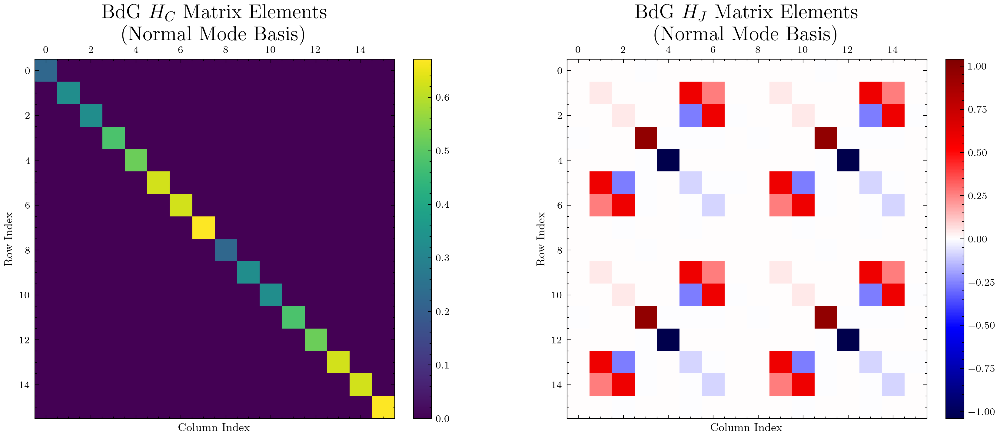

In [9]:
# ------------------------------------------------------------------ #
# 1. Instantiate the photonic_chain with some test parameters
# ------------------------------------------------------------------ #


# ------------------------------------------------------------------ #
# 2. Extract the single-particle BdG matrices from the instance
# ------------------------------------------------------------------ #
# These are the 4N x 4N matrices transformed into the normal mode basis
hc_bdg = np.real(photonic_chain.H_C)
hj_bdg = np.real(photonic_chain.H_J)

# ------------------------------------------------------------------ #
# 3. Plotting the matrix elements side-by-side
# ------------------------------------------------------------------ #
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# --- Plot H_C BdG Matrix ---
# Because Van Hemmen's transformation P perfectly diagonalizes H_C_hermitian, 
# this plot will show a flawless, bright diagonal line.
abs_max_c = np.max(np.abs(hc_bdg))
im1 = ax1.matshow(hc_bdg, cmap='viridis', vmin=0, vmax=abs_max_c)
ax1.set_title("BdG $H_C$ Matrix Elements\n(Normal Mode Basis)", pad=15)
fig.colorbar(im1, ax=ax1, fraction=0.046, pad=0.04)

# --- Plot H_J BdG Matrix ---
# For H_J, we use a 'seismic' colormap centered at 0 to clearly view the 
# positive and negative scattering/pairing elements generated by the change of basis.
abs_max_j = np.max(np.abs(hj_bdg))
if abs_max_j == 0: abs_max_j = 1e-15  # Prevent division by zero if empty

im2 = ax2.matshow(hj_bdg, cmap='seismic', vmin=-abs_max_j, vmax=abs_max_j)
ax2.set_title("BdG $H_J$ Matrix Elements\n(Normal Mode Basis)", pad=15)
fig.colorbar(im2, ax=ax2, fraction=0.046, pad=0.04)

# Style grid labels to show matrix indices
for ax in [ax1, ax2]:
    ax.set_xlabel("Column Index")
    ax.set_ylabel("Row Index")
    ax.xaxis.set_major_locator(plt.MaxNLocator(integer=True))
    ax.yaxis.set_major_locator(plt.MaxNLocator(integer=True))

plt.tight_layout()
plt.show()

In [6]:
arr = photonic_chain.H_J
arr[np.isclose(arr, 0, atol=1e-10)] = 0.0

print(arr)
# Output: array([1., 0., 0., 5., 0.])

[[ 0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.9591663   0.          0.          0.          0.9591663
   0.          0.        ]
 [ 0.          0.         -1.03923048  0.          0.          0.
  -1.03923048  0.        ]
 [ 0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.9591663   0.          0.          0.          0.9591663
   0.          0.        ]
 [ 0.          0.         -1.03923048  0.          0.          0.
  -1.03923048  0.        ]
 [ 0.          0.          0.          0.          0.          0.
   0.          0.        ]]


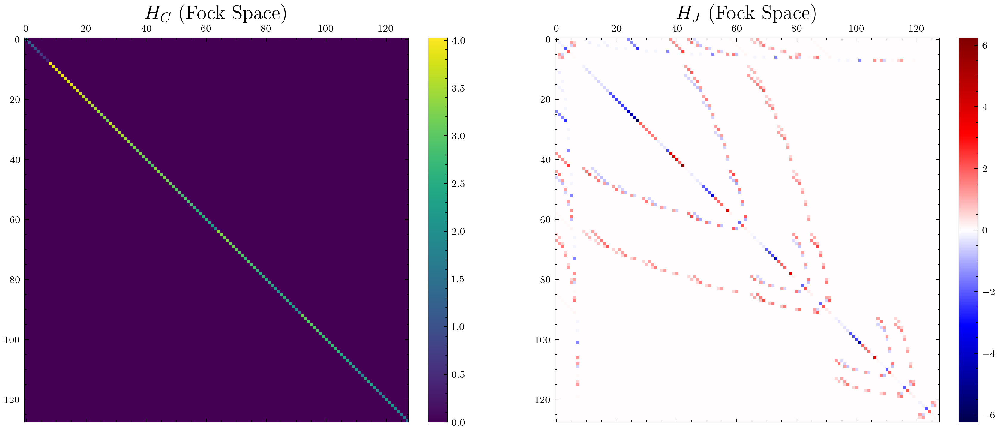

In [10]:

# 1. Convert sparse matrices to dense arrays
hc_dense = np.real(photonic_chain.H_C_fock.toarray())
hj_dense = np.real(photonic_chain.H_J_fock.toarray())

# 2. Setup the figure with two subplots side-by-side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# --- Plot H_C_fock ---
# Since it's diagonal, we can use a standard sequential map like 'viridis'
im1 = ax1.matshow(hc_dense, cmap='viridis')
ax1.set_title("$H_C$ (Fock Space)", pad=15)
fig.colorbar(im1, ax=ax1, fraction=0.046, pad=0.04)

# --- Plot H_J_fock ---
# For H_J, it's best to use 'seismic' centered at 0 to see positive/negative off-diagonals
abs_max_j = np.max(np.abs(hj_dense))
# Prevent division by zero if H_J happens to be completely empty/zero
if abs_max_j == 0: abs_max_j = 1e-15 

im2 = ax2.matshow(hj_dense, cmap='seismic', vmin=-abs_max_j, vmax=abs_max_j)
ax2.set_title("$H_J$ (Fock Space)", pad=15)
fig.colorbar(im2, ax=ax2, fraction=0.046, pad=0.04)

# 3. Clean up layout and render
plt.tight_layout()
# plt.savefig('../../../figures/export/test_matrix.png', dpi = 600)
plt.show()

In [182]:
arr = photonic_chain.H_J_fock.toarray()
arr[np.isclose(arr, 0, atol=1e-10)] = 0.0

print(arr[1])

[ 0.         -0.35050035  0.         -1.63150961  0.          0.
  0.          0.          0.         -0.42927351  0.          0.
  0.          0.         -0.24784117  0.          0.          0.
 -2.30730302  0.          0.          0.          0.          0.16110057
  0.          0.          0.          0.          0.          0.
  1.63150961  0.          0.          0.          0.          0.
  0.          0.16110057  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.        ]


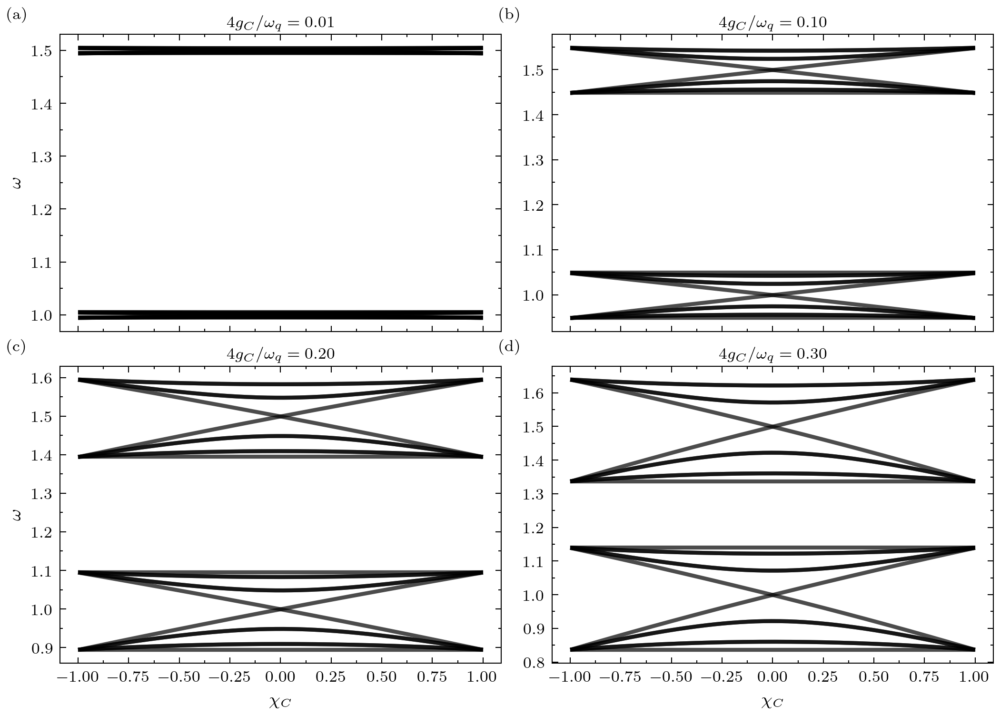

In [123]:
import matplotlib.ticker as ticker

# ------------------------------------------------------------------ #
# Parámetros del sistema
# ------------------------------------------------------------------ #
N = 6  

gamma = 0.01
fock_photon = 3
Omega_J = 1.0
Chi_J = 0.0

# Truncation parameters for the chain's Fock space
base_excitations = 1
fock_layers = 0
k_states = (4 * N  - 1)   # Number of low-lying states to compute and plot

Omega_C_values = [0.01, 0.1, 0.2, 0.3]   # four panels
Chi_C_values  = np.linspace(-0.99, 0.99, 200) # Reduced to 50 for faster initial testing

nrows, ncols  = 2, 2
fig_width     = 7.0
fig_height    = 5.0
panel_fontsize = 8

# ------------------------------------------------------------------ #
# Compute spectra
# ------------------------------------------------------------------ #
all_energies = []
for Omega_C in Omega_C_values:
    energies = []
    for Chi_C in Chi_C_values:
        # 1. Initialize the system
        aux = 0.5 * Omega_C * np.sqrt(1+3*Chi_C**2)*0
        omega_r = 1.5 * np.sqrt(1+aux) - np.sqrt(1-aux)
        chain = PHOTONICChain(N, Omega_C, Chi_C, omega_r, gamma, fock_photon, Omega_J, Chi_J, True)
        
        chain.matter_hamiltonians(n_excitations=base_excitations, layers=fock_layers)
        chain.build_full_hamiltonian()
        # 3. Compute the lowest 'k' eigenvalues
        vals, _ = chain.get_low_lying_spectrum(k=k_states)
        energies.append(np.sort(vals))
        
    all_energies.append(np.array(energies))

# ------------------------------------------------------------------ #
# Figure
# ------------------------------------------------------------------ #
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(fig_width, fig_height))

for idx, (Omega_C, energies) in enumerate(zip(Omega_C_values, all_energies)):
    ax  = axes.flatten()[idx]
    row = idx // ncols
    col = idx  % ncols

    # energies shape is (len(Chi_C_values), k_states)
    # Transposing allows us to iterate through the 'k' bands
    for band in energies.T:
        ax.plot(Chi_C_values, band, color='black', alpha=0.7)

    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator(2))

    ax.text(-0.12, 1.04, f'({chr(97 + idx)})',
            transform=ax.transAxes,
            fontsize=panel_fontsize, fontweight='bold',
            va='bottom', ha='left')

    ax.set_title(rf'$4g_C / \omega_q = {Omega_C:.2f}$', fontsize=8, pad=4)

    if row == nrows - 1:
        ax.set_xlabel(r'$\chi_C$')
    else:
        ax.tick_params(labelbottom=False)

    if col == 0:
        ax.set_ylabel(r'$\omega$')

fig.tight_layout(pad=0.4, h_pad=0.5, w_pad=0.5)
plt.show()

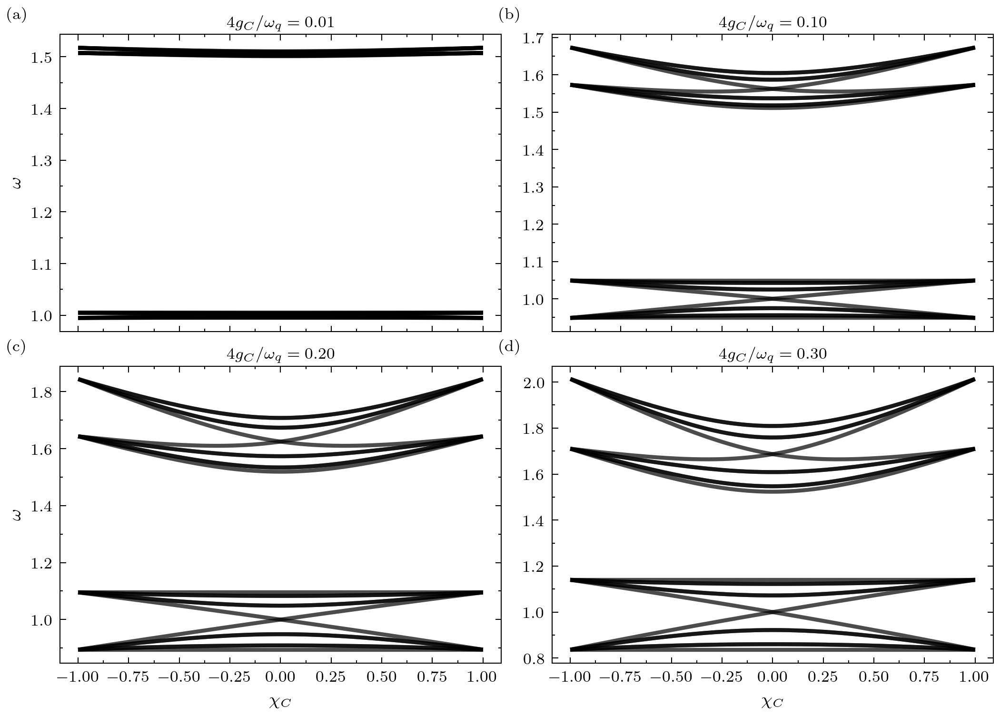

In [110]:
import matplotlib.ticker as ticker

# ------------------------------------------------------------------ #
# Parámetros del sistema
# ------------------------------------------------------------------ #
N = 6  

gamma = np.sqrt(0.000)
fock_photon = 3
Omega_J = 1.0
Chi_J = 0.0

# Truncation parameters for the chain's Fock space
base_excitations = 1
fock_layers = 0
k_states = (4 * N  - 1)   # Number of low-lying states to compute and plot

Omega_C_values = [0.01, 0.1, 0.2, 0.3]   # four panels
Chi_C_values  = np.linspace(-0.99, 0.99, 200) # Reduced to 50 for faster initial testing

nrows, ncols  = 2, 2
fig_width     = 7.0
fig_height    = 5.0
panel_fontsize = 8

# ------------------------------------------------------------------ #
# Compute spectra
# ------------------------------------------------------------------ #
all_energies = []
for Omega_C in Omega_C_values:
    energies = []
    for Chi_C in Chi_C_values:
        # 1. Initialize the system
        aux = 0.5 * Omega_C * np.sqrt(1+3*Chi_C**2)
        omega_r = 1.5 * np.sqrt(1+aux) - np.sqrt(1-aux)
        chain = PHOTONICChain(N, Omega_C, Chi_C, omega_r, gamma, fock_photon, Omega_J, Chi_J, True)
        
        chain.matter_hamiltonians(n_excitations=base_excitations, layers=fock_layers)
        chain.build_full_hamiltonian()
        # 3. Compute the lowest 'k' eigenvalues
        vals, _ = chain.get_low_lying_spectrum(k=k_states)
        energies.append(np.sort(vals))
        
    all_energies.append(np.array(energies))

# ------------------------------------------------------------------ #
# Figure
# ------------------------------------------------------------------ #
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(fig_width, fig_height))

for idx, (Omega_C, energies) in enumerate(zip(Omega_C_values, all_energies)):
    ax  = axes.flatten()[idx]
    row = idx // ncols
    col = idx  % ncols

    # energies shape is (len(Chi_C_values), k_states)
    # Transposing allows us to iterate through the 'k' bands
    for band in energies.T:
        ax.plot(Chi_C_values, band, color='black', alpha=0.7)

    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator(2))

    ax.text(-0.12, 1.04, f'({chr(97 + idx)})',
            transform=ax.transAxes,
            fontsize=panel_fontsize, fontweight='bold',
            va='bottom', ha='left')

    ax.set_title(rf'$4g_C / \omega_q = {Omega_C:.2f}$', fontsize=8, pad=4)

    if row == nrows - 1:
        ax.set_xlabel(r'$\chi_C$')
    else:
        ax.tick_params(labelbottom=False)

    if col == 0:
        ax.set_ylabel(r'$\omega$')

fig.tight_layout(pad=0.4, h_pad=0.5, w_pad=0.5)
plt.show()

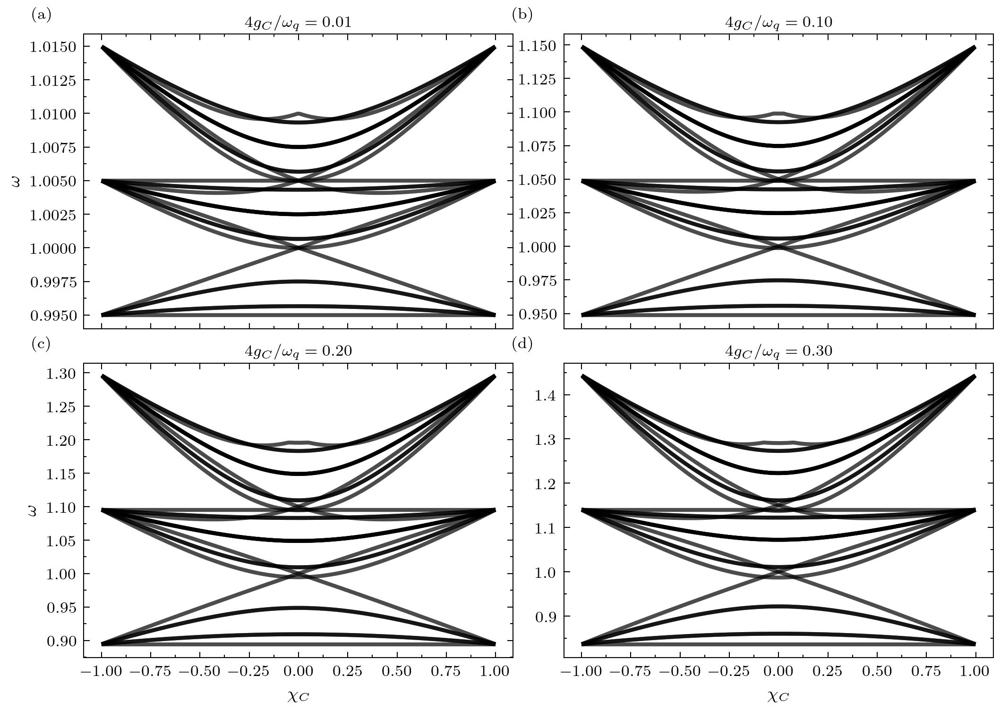

In [111]:
import matplotlib.ticker as ticker

# ------------------------------------------------------------------ #
# Parámetros del sistema
# ------------------------------------------------------------------ #
N = 6  

gamma = np.sqrt(0.000)
fock_photon = 3
Omega_J = 1.0
Chi_J = 0.0

# Truncation parameters for the chain's Fock space
base_excitations = 1
fock_layers = 0
k_states = (5 * N  - 1)   # Number of low-lying states to compute and plot

Omega_C_values = [0.01, 0.1, 0.2, 0.3]   # four panels
Chi_C_values  = np.linspace(-0.99, 0.99, 200) # Reduced to 50 for faster initial testing

nrows, ncols  = 2, 2
fig_width     = 7.0
fig_height    = 5.0
panel_fontsize = 8

# ------------------------------------------------------------------ #
# Compute spectra
# ------------------------------------------------------------------ #
all_energies = []
for Omega_C in Omega_C_values:
    energies = []
    for Chi_C in Chi_C_values:
        # 1. Initialize the system
        aux = 0.5 * Omega_C * np.sqrt(1+3*Chi_C**2)
        omega_r = 1.0 * np.sqrt(1+aux) - np.sqrt(1-aux)
        chain = PHOTONICChain(N, Omega_C, Chi_C, omega_r, gamma, fock_photon, Omega_J, Chi_J, True)
        
        chain.matter_hamiltonians(n_excitations=base_excitations, layers=fock_layers)
        chain.build_full_hamiltonian()
        # 3. Compute the lowest 'k' eigenvalues
        vals, _ = chain.get_low_lying_spectrum(k=k_states)
        energies.append(np.sort(vals))
        
    all_energies.append(np.array(energies))

# ------------------------------------------------------------------ #
# Figure
# ------------------------------------------------------------------ #
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(fig_width, fig_height))

for idx, (Omega_C, energies) in enumerate(zip(Omega_C_values, all_energies)):
    ax  = axes.flatten()[idx]
    row = idx // ncols
    col = idx  % ncols

    # energies shape is (len(Chi_C_values), k_states)
    # Transposing allows us to iterate through the 'k' bands
    for band in energies.T:
        ax.plot(Chi_C_values, band, color='black', alpha=0.7)

    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator(2))

    ax.text(-0.12, 1.04, f'({chr(97 + idx)})',
            transform=ax.transAxes,
            fontsize=panel_fontsize, fontweight='bold',
            va='bottom', ha='left')

    ax.set_title(rf'$4g_C / \omega_q = {Omega_C:.2f}$', fontsize=8, pad=4)

    if row == nrows - 1:
        ax.set_xlabel(r'$\chi_C$')
    else:
        ax.tick_params(labelbottom=False)

    if col == 0:
        ax.set_ylabel(r'$\omega$')

fig.tight_layout(pad=0.4, h_pad=0.5, w_pad=0.5)
plt.show()

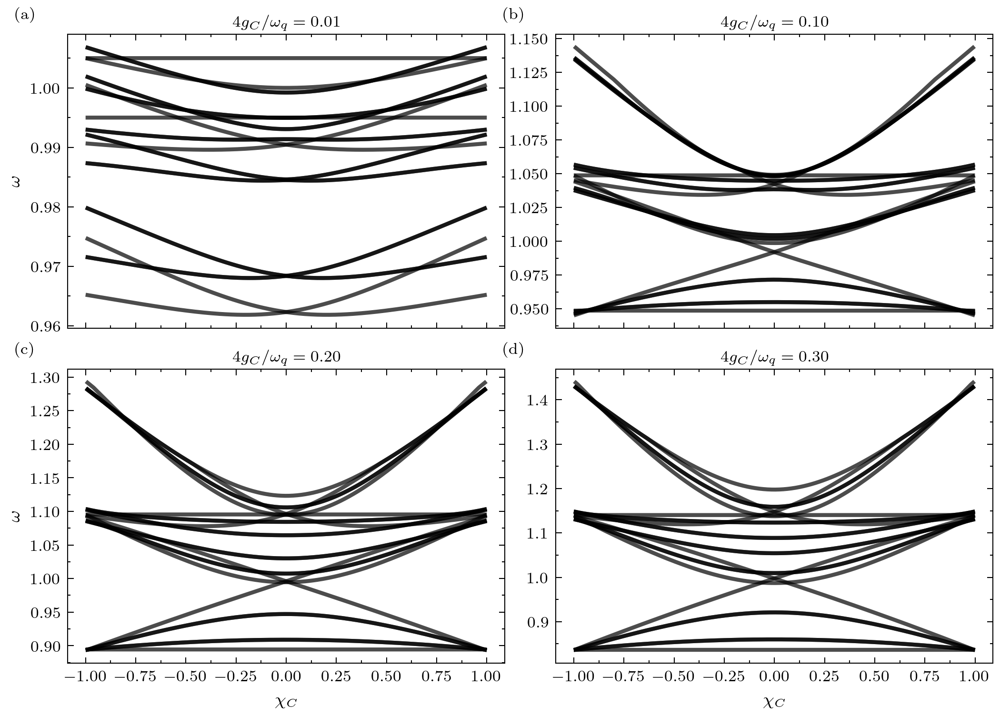

In [124]:
import matplotlib.ticker as ticker

# ------------------------------------------------------------------ #
# Parámetros del sistema
# ------------------------------------------------------------------ #
N = 6  

gamma = 0.01
fock_photon = 4
Omega_J = 1.0
Chi_J = 0.0

# Truncation parameters for the chain's Fock space
base_excitations = 1
fock_layers = 0
k_states = (4 * N  - 1)   # Number of low-lying states to compute and plot

Omega_C_values = [0.01, 0.1, 0.2, 0.3]   # four panels
Chi_C_values  = np.linspace(-0.99, 0.99, 200) # Reduced to 50 for faster initial testing

nrows, ncols  = 2, 2
fig_width     = 7.0
fig_height    = 5.0
panel_fontsize = 8

# ------------------------------------------------------------------ #
# Compute spectra
# ------------------------------------------------------------------ #
all_energies = []
for Omega_C in Omega_C_values:
    energies = []
    for Chi_C in Chi_C_values:
        # 1. Initialize the system
        aux = 0.5 * Omega_C * np.sqrt(1+3*Chi_C**2)
        omega_r = 1.0 * np.sqrt(1+aux) - np.sqrt(1-aux)
        chain = PHOTONICChain(N, Omega_C, Chi_C, omega_r, gamma, fock_photon, Omega_J, Chi_J, True)
        
        chain.matter_hamiltonians(n_excitations=base_excitations, layers=fock_layers)
        chain.build_full_hamiltonian()
        # 3. Compute the lowest 'k' eigenvalues
        vals, _ = chain.get_low_lying_spectrum(k=k_states)
        energies.append(np.sort(vals))
        
    all_energies.append(np.array(energies))

# ------------------------------------------------------------------ #
# Figure
# ------------------------------------------------------------------ #
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(fig_width, fig_height))

for idx, (Omega_C, energies) in enumerate(zip(Omega_C_values, all_energies)):
    ax  = axes.flatten()[idx]
    row = idx // ncols
    col = idx  % ncols

    # energies shape is (len(Chi_C_values), k_states)
    # Transposing allows us to iterate through the 'k' bands
    for band in energies.T:
        ax.plot(Chi_C_values, band, color='black', alpha=0.7)

    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator(2))

    ax.text(-0.12, 1.04, f'({chr(97 + idx)})',
            transform=ax.transAxes,
            fontsize=panel_fontsize, fontweight='bold',
            va='bottom', ha='left')

    ax.set_title(rf'$4g_C / \omega_q = {Omega_C:.2f}$', fontsize=8, pad=4)

    if row == nrows - 1:
        ax.set_xlabel(r'$\chi_C$')
    else:
        ax.tick_params(labelbottom=False)

    if col == 0:
        ax.set_ylabel(r'$\omega$')

fig.tight_layout(pad=0.4, h_pad=0.5, w_pad=0.5)
plt.show()

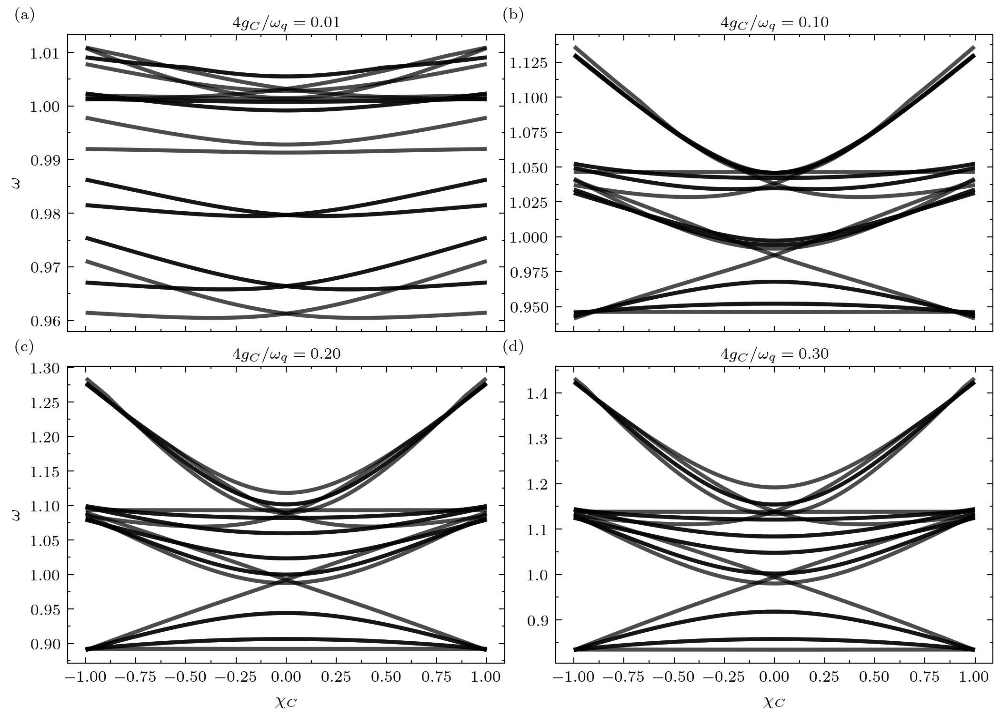

In [125]:
import matplotlib.ticker as ticker

# ------------------------------------------------------------------ #
# Parámetros del sistema
# ------------------------------------------------------------------ #
N = 6  

gamma = 0.01
fock_photon = 3
Omega_J = 1.0
Chi_J = 0.0

# Truncation parameters for the chain's Fock space
base_excitations = 1
fock_layers = 1
k_states = (4 * N  - 1)   # Number of low-lying states to compute and plot

Omega_C_values = [0.01, 0.1, 0.2, 0.3]   # four panels
Chi_C_values  = np.linspace(-0.99, 0.99, 200) # Reduced to 50 for faster initial testing

nrows, ncols  = 2, 2
fig_width     = 7.0
fig_height    = 5.0
panel_fontsize = 8

# ------------------------------------------------------------------ #
# Compute spectra
# ------------------------------------------------------------------ #
all_energies = []
for Omega_C in Omega_C_values:
    energies = []
    for Chi_C in Chi_C_values:
        # 1. Initialize the system
        aux = 0.5 * Omega_C * np.sqrt(1+3*Chi_C**2)
        omega_r = 1.0 * np.sqrt(1+aux) - np.sqrt(1-aux)
        chain = PHOTONICChain(N, Omega_C, Chi_C, omega_r, gamma, fock_photon, Omega_J, Chi_J, True)
        
        chain.matter_hamiltonians(n_excitations=base_excitations, layers=fock_layers)
        chain.build_full_hamiltonian()
        # 3. Compute the lowest 'k' eigenvalues
        vals, _ = chain.get_low_lying_spectrum(k=k_states)
        energies.append(np.sort(vals))
        
    all_energies.append(np.array(energies))

# ------------------------------------------------------------------ #
# Figure
# ------------------------------------------------------------------ #
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(fig_width, fig_height))

for idx, (Omega_C, energies) in enumerate(zip(Omega_C_values, all_energies)):
    ax  = axes.flatten()[idx]
    row = idx // ncols
    col = idx  % ncols

    # energies shape is (len(Chi_C_values), k_states)
    # Transposing allows us to iterate through the 'k' bands
    for band in energies.T:
        ax.plot(Chi_C_values, band, color='black', alpha=0.7)

    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator(2))

    ax.text(-0.12, 1.04, f'({chr(97 + idx)})',
            transform=ax.transAxes,
            fontsize=panel_fontsize, fontweight='bold',
            va='bottom', ha='left')

    ax.set_title(rf'$4g_C / \omega_q = {Omega_C:.2f}$', fontsize=8, pad=4)

    if row == nrows - 1:
        ax.set_xlabel(r'$\chi_C$')
    else:
        ax.tick_params(labelbottom=False)

    if col == 0:
        ax.set_ylabel(r'$\omega$')

fig.tight_layout(pad=0.4, h_pad=0.5, w_pad=0.5)
plt.show()

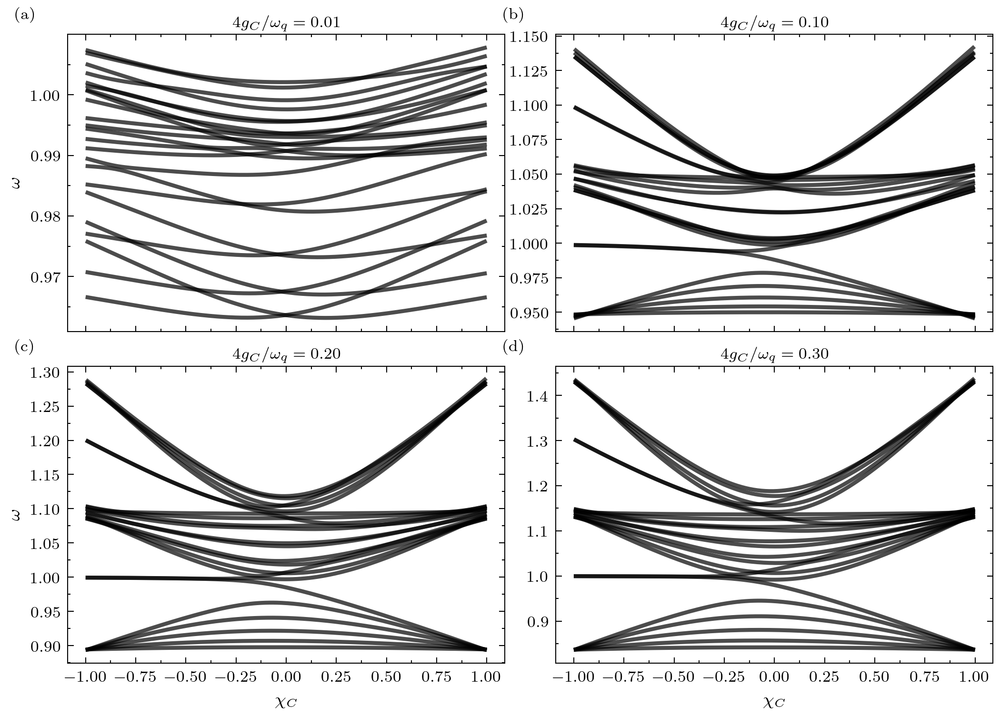

In [126]:
import matplotlib.ticker as ticker

# ------------------------------------------------------------------ #
# Parámetros del sistema
# ------------------------------------------------------------------ #
N = 6  

gamma = 0.01
fock_photon = 4
Omega_J = 1.0
Chi_J = 0.0

# Truncation parameters for the chain's Fock space
base_excitations = 1
fock_layers = 0
k_states = (4 * N  - 1)   # Number of low-lying states to compute and plot

Omega_C_values = [0.01, 0.1, 0.2, 0.3]   # four panels
Chi_C_values  = np.linspace(-0.99, 0.99, 200) # Reduced to 50 for faster initial testing

nrows, ncols  = 2, 2
fig_width     = 7.0
fig_height    = 5.0
panel_fontsize = 8

# ------------------------------------------------------------------ #
# Compute spectra
# ------------------------------------------------------------------ #
all_energies = []
for Omega_C in Omega_C_values:
    energies = []
    for Chi_C in Chi_C_values:
        # 1. Initialize the system
        aux = 0.5 * Omega_C * np.sqrt(1+3*Chi_C**2)
        omega_r = 1.0 * np.sqrt(1+aux) - np.sqrt(1-aux)
        chain = PHOTONICChain(N, Omega_C, Chi_C, omega_r, gamma, fock_photon, Omega_J, Chi_J, False)
        
        chain.matter_hamiltonians(n_excitations=base_excitations, layers=fock_layers)
        chain.build_full_hamiltonian()
        # 3. Compute the lowest 'k' eigenvalues
        vals, _ = chain.get_low_lying_spectrum(k=k_states)
        energies.append(np.sort(vals))
        
    all_energies.append(np.array(energies))

# ------------------------------------------------------------------ #
# Figure
# ------------------------------------------------------------------ #
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(fig_width, fig_height))

for idx, (Omega_C, energies) in enumerate(zip(Omega_C_values, all_energies)):
    ax  = axes.flatten()[idx]
    row = idx // ncols
    col = idx  % ncols

    # energies shape is (len(Chi_C_values), k_states)
    # Transposing allows us to iterate through the 'k' bands
    for band in energies.T:
        ax.plot(Chi_C_values, band, color='black', alpha=0.7)

    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator(2))

    ax.text(-0.12, 1.04, f'({chr(97 + idx)})',
            transform=ax.transAxes,
            fontsize=panel_fontsize, fontweight='bold',
            va='bottom', ha='left')

    ax.set_title(rf'$4g_C / \omega_q = {Omega_C:.2f}$', fontsize=8, pad=4)

    if row == nrows - 1:
        ax.set_xlabel(r'$\chi_C$')
    else:
        ax.tick_params(labelbottom=False)

    if col == 0:
        ax.set_ylabel(r'$\omega$')

fig.tight_layout(pad=0.4, h_pad=0.5, w_pad=0.5)
plt.show()

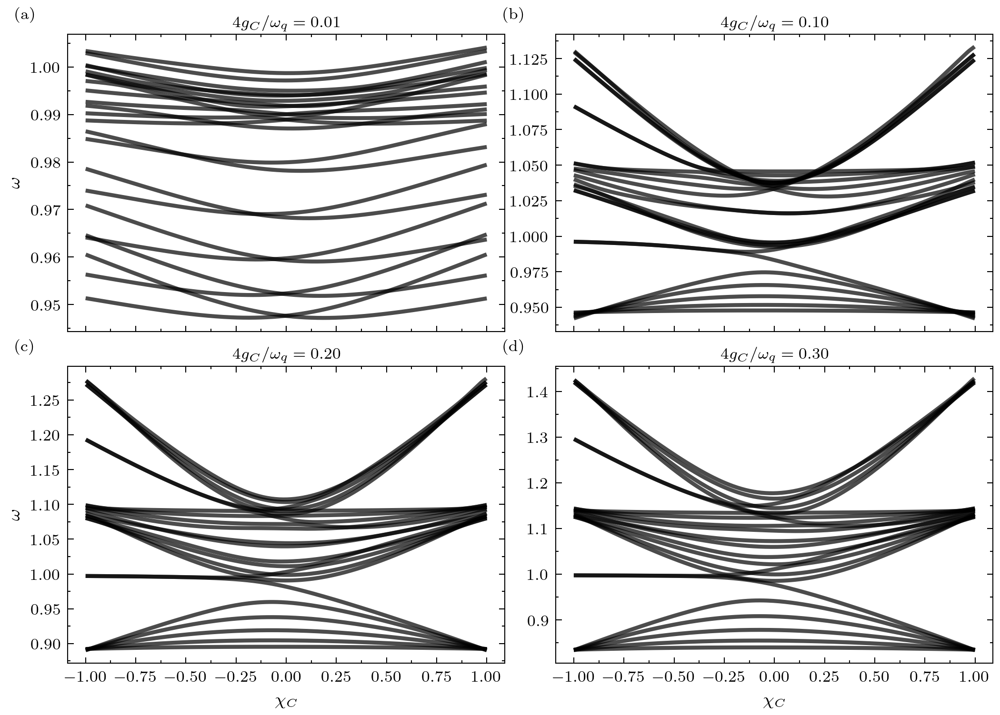

In [127]:
import matplotlib.ticker as ticker

# ------------------------------------------------------------------ #
# Parámetros del sistema
# ------------------------------------------------------------------ #
N = 6  

gamma = 0.01
fock_photon = 4
Omega_J = 1.0
Chi_J = 0.0

# Truncation parameters for the chain's Fock space
base_excitations = 1
fock_layers = 1
k_states = (4 * N  - 1)   # Number of low-lying states to compute and plot

Omega_C_values = [0.01, 0.1, 0.2, 0.3]   # four panels
Chi_C_values  = np.linspace(-0.99, 0.99, 200) # Reduced to 50 for faster initial testing

nrows, ncols  = 2, 2
fig_width     = 7.0
fig_height    = 5.0
panel_fontsize = 8

# ------------------------------------------------------------------ #
# Compute spectra
# ------------------------------------------------------------------ #
all_energies = []
for Omega_C in Omega_C_values:
    energies = []
    for Chi_C in Chi_C_values:
        # 1. Initialize the system
        aux = 0.5 * Omega_C * np.sqrt(1+3*Chi_C**2)
        omega_r = 1.0 * np.sqrt(1+aux) - np.sqrt(1-aux)
        chain = PHOTONICChain(N, Omega_C, Chi_C, omega_r, gamma, fock_photon, Omega_J, Chi_J, False)
        
        chain.matter_hamiltonians(n_excitations=base_excitations, layers=fock_layers)
        chain.build_full_hamiltonian()
        # 3. Compute the lowest 'k' eigenvalues
        vals, _ = chain.get_low_lying_spectrum(k=k_states)
        energies.append(np.sort(vals))
        
    all_energies.append(np.array(energies))

# ------------------------------------------------------------------ #
# Figure
# ------------------------------------------------------------------ #
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(fig_width, fig_height))

for idx, (Omega_C, energies) in enumerate(zip(Omega_C_values, all_energies)):
    ax  = axes.flatten()[idx]
    row = idx // ncols
    col = idx  % ncols

    # energies shape is (len(Chi_C_values), k_states)
    # Transposing allows us to iterate through the 'k' bands
    for band in energies.T:
        ax.plot(Chi_C_values, band, color='black', alpha=0.7)

    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator(2))

    ax.text(-0.12, 1.04, f'({chr(97 + idx)})',
            transform=ax.transAxes,
            fontsize=panel_fontsize, fontweight='bold',
            va='bottom', ha='left')

    ax.set_title(rf'$4g_C / \omega_q = {Omega_C:.2f}$', fontsize=8, pad=4)

    if row == nrows - 1:
        ax.set_xlabel(r'$\chi_C$')
    else:
        ax.tick_params(labelbottom=False)

    if col == 0:
        ax.set_ylabel(r'$\omega$')

fig.tight_layout(pad=0.4, h_pad=0.5, w_pad=0.5)
plt.show()

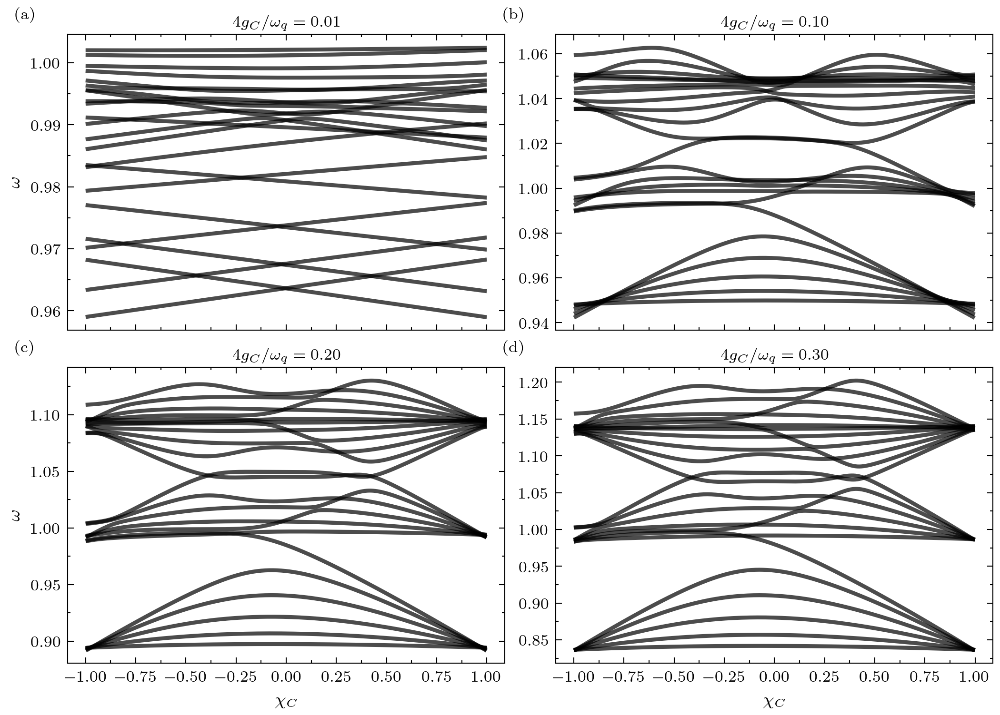

In [128]:
import matplotlib.ticker as ticker

# ------------------------------------------------------------------ #
# Parámetros del sistema
# ------------------------------------------------------------------ #
N = 6  

gamma = 0.01
fock_photon = 4
Omega_J = 1.0
Chi_J = 0.0

# Truncation parameters for the chain's Fock space
base_excitations = 1
fock_layers = 0
k_states = (4 * N  - 1)   # Number of low-lying states to compute and plot

Omega_C_values = [0.01, 0.1, 0.2, 0.3]   # four panels
Chi_C_values  = np.linspace(-0.99, 0.99, 200) # Reduced to 50 for faster initial testing

nrows, ncols  = 2, 2
fig_width     = 7.0
fig_height    = 5.0
panel_fontsize = 8

# ------------------------------------------------------------------ #
# Compute spectra
# ------------------------------------------------------------------ #
all_energies = []
for Omega_C in Omega_C_values:
    energies = []
    for Chi_C in Chi_C_values:
        # 1. Initialize the system
        aux = 0.5 * Omega_C
        omega_r = 1.0 * np.sqrt(1+aux) - np.sqrt(1-aux)
        chain = PHOTONICChain(N, Omega_C, Chi_C, omega_r, gamma, fock_photon, Omega_J, Chi_J, False)
        
        chain.matter_hamiltonians(n_excitations=base_excitations, layers=fock_layers)
        chain.build_full_hamiltonian()
        # 3. Compute the lowest 'k' eigenvalues
        vals, _ = chain.get_low_lying_spectrum(k=k_states)
        energies.append(np.sort(vals))
        
    all_energies.append(np.array(energies))

# ------------------------------------------------------------------ #
# Figure
# ------------------------------------------------------------------ #
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(fig_width, fig_height))

for idx, (Omega_C, energies) in enumerate(zip(Omega_C_values, all_energies)):
    ax  = axes.flatten()[idx]
    row = idx // ncols
    col = idx  % ncols

    # energies shape is (len(Chi_C_values), k_states)
    # Transposing allows us to iterate through the 'k' bands
    for band in energies.T:
        ax.plot(Chi_C_values, band, color='black', alpha=0.7)

    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator(2))

    ax.text(-0.12, 1.04, f'({chr(97 + idx)})',
            transform=ax.transAxes,
            fontsize=panel_fontsize, fontweight='bold',
            va='bottom', ha='left')

    ax.set_title(rf'$4g_C / \omega_q = {Omega_C:.2f}$', fontsize=8, pad=4)

    if row == nrows - 1:
        ax.set_xlabel(r'$\chi_C$')
    else:
        ax.tick_params(labelbottom=False)

    if col == 0:
        ax.set_ylabel(r'$\omega$')

fig.tight_layout(pad=0.4, h_pad=0.5, w_pad=0.5)
plt.show()

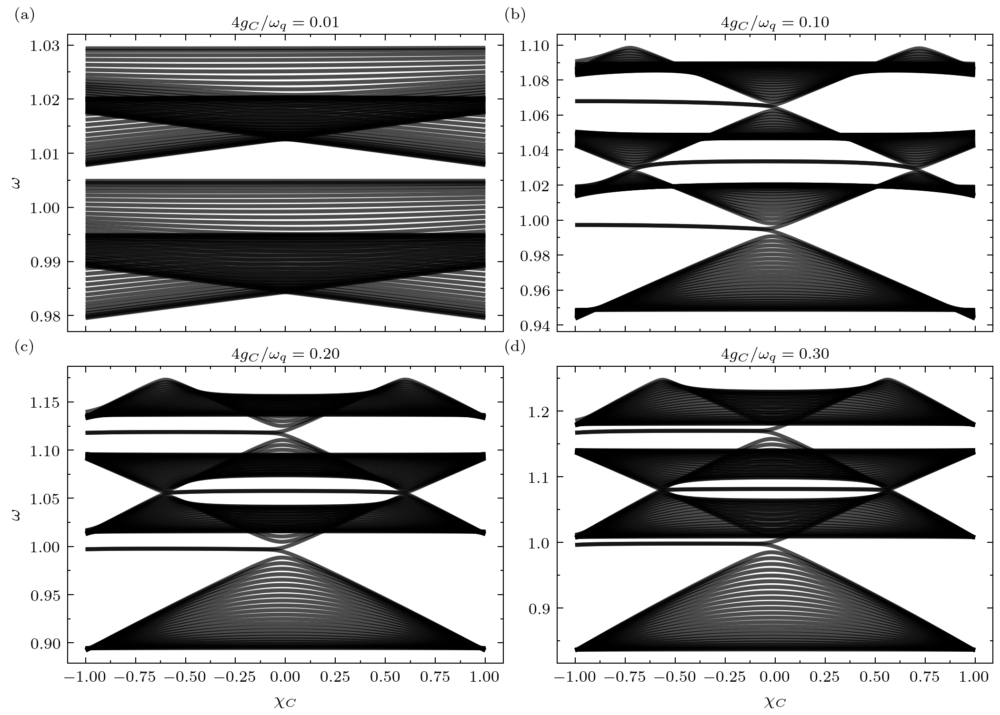

In [131]:
import matplotlib.ticker as ticker

# ------------------------------------------------------------------ #
# Parámetros del sistema
# ------------------------------------------------------------------ #
N = 26  

gamma = 0.01
fock_photon = 4
Omega_J = 1.0
Chi_J = 0.0

# Truncation parameters for the chain's Fock space
base_excitations = 1
fock_layers = 0
k_states = (4 * N  - 1)   # Number of low-lying states to compute and plot

Omega_C_values = [0.01, 0.1, 0.2, 0.3]   # four panels
Chi_C_values  = np.linspace(-0.99, 0.99, 200) # Reduced to 50 for faster initial testing

nrows, ncols  = 2, 2
fig_width     = 7.0
fig_height    = 5.0
panel_fontsize = 8

# ------------------------------------------------------------------ #
# Compute spectra
# ------------------------------------------------------------------ #
all_energies = []
for Omega_C in Omega_C_values:
    energies = []
    for Chi_C in Chi_C_values:
        # 1. Initialize the system
        aux = 0.5 * Omega_C
        omega_r = 1.02 * np.sqrt(1+aux) - np.sqrt(1-aux)
        chain = PHOTONICChain(N, Omega_C, Chi_C, omega_r, gamma, fock_photon, Omega_J, Chi_J, False)
        
        chain.matter_hamiltonians(n_excitations=base_excitations, layers=fock_layers)
        chain.build_full_hamiltonian()
        # 3. Compute the lowest 'k' eigenvalues
        vals, _ = chain.get_low_lying_spectrum(k=k_states)
        energies.append(np.sort(vals))
        
    all_energies.append(np.array(energies))

# ------------------------------------------------------------------ #
# Figure
# ------------------------------------------------------------------ #
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(fig_width, fig_height))

for idx, (Omega_C, energies) in enumerate(zip(Omega_C_values, all_energies)):
    ax  = axes.flatten()[idx]
    row = idx // ncols
    col = idx  % ncols

    # energies shape is (len(Chi_C_values), k_states)
    # Transposing allows us to iterate through the 'k' bands
    for band in energies.T:
        ax.plot(Chi_C_values, band, color='black', alpha=0.7)

    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator(2))

    ax.text(-0.12, 1.04, f'({chr(97 + idx)})',
            transform=ax.transAxes,
            fontsize=panel_fontsize, fontweight='bold',
            va='bottom', ha='left')

    ax.set_title(rf'$4g_C / \omega_q = {Omega_C:.2f}$', fontsize=8, pad=4)

    if row == nrows - 1:
        ax.set_xlabel(r'$\chi_C$')
    else:
        ax.tick_params(labelbottom=False)

    if col == 0:
        ax.set_ylabel(r'$\omega$')

fig.tight_layout(pad=0.4, h_pad=0.5, w_pad=0.5)
plt.show()

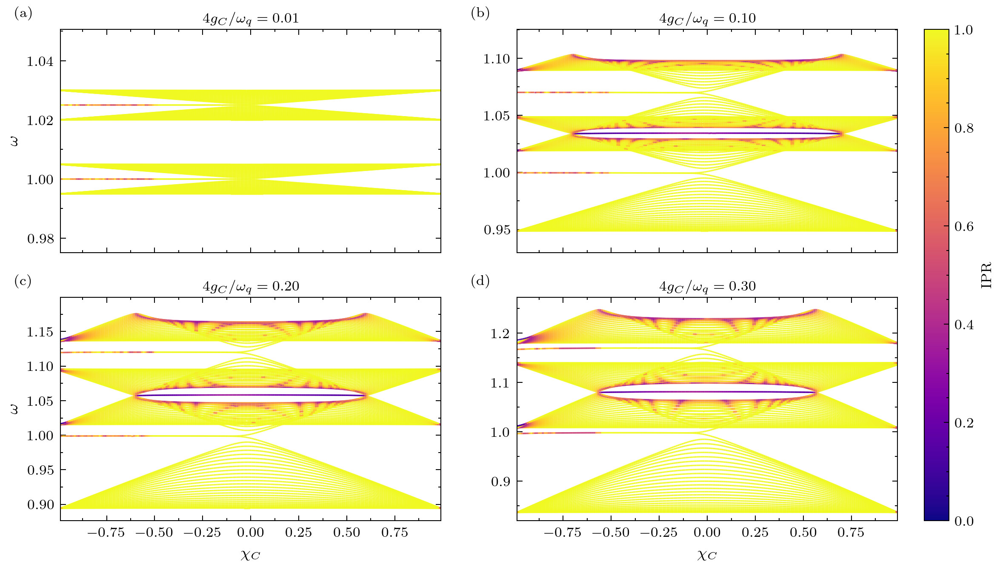

In [197]:
import matplotlib.ticker as ticker
import matplotlib.colors as mcolors

# ------------------------------------------------------------------ #
# Parámetros del sistema
# ------------------------------------------------------------------ #
N = 26
gamma_zero = 0.01
fock_photon = 4
Omega_J = 1.0
Chi_J = 0.0
base_excitations = 1
fock_layers = 0
k_states = (4 * N - 1)
Omega_C_values = [0.01, 0.1, 0.2, 0.3]
Chi_C_values   = np.linspace(-0.99, 0.99, 200)
nrows, ncols   = 2, 2
fig_width      = 9.0
fig_height     = 5.0
panel_fontsize = 8

# ------------------------------------------------------------------ #
# Compute spectra + IPR
# ------------------------------------------------------------------ #
all_energies = []
all_iprs     = []

for Omega_C in Omega_C_values:
    energies_list = []
    iprs_list     = []

    for Chi_C in Chi_C_values:
        aux     = 0.5 * Omega_C
        gamma = gamma_zero * Omega_C / np.max(Omega_C_values)
        omega_r = 1.02 * np.sqrt(1 + aux) - np.sqrt(1 - aux)

        chain = PHOTONICChain(N, Omega_C, Chi_C, omega_r, gamma, fock_photon,
                              Omega_J, Chi_J, False)
        chain.matter_hamiltonians(n_excitations=base_excitations, layers=fock_layers)
        chain.build_full_hamiltonian()

        vals, vecs = chain.get_low_lying_spectrum(k=k_states)
        idx_sort   = np.argsort(vals)
        vals       = vals[idx_sort]
        vecs       = vecs[:, idx_sort]   # columns are eigenvectors

        iprs_this = []
        for col in range(vecs.shape[1]):
            evec = vecs[:, col]

            # --- reduced density matrix of the matter sector ---
            rho_matter = chain.partial_trace(evec, which_to_keep='matter')
            # shape: (fock_dim, fock_dim)

            # --- leading eigenvector of rho_matter as a matter Fock vector ---
            # This is the "most probable" matter state, independent of photon dressing
            evals_rho, evecs_rho = np.linalg.eigh(rho_matter)
            matter_vec = evecs_rho[:, -1]   # eigenvector with largest eigenvalue

            # --- IPR on that matter vector ---
            ipr, xi, _ = chain.quanta_ipr(matter_vec)
            iprs_this.append(ipr)

        energies_list.append(vals)
        iprs_list.append(np.array(iprs_this))

    all_energies.append(np.array(energies_list))   # (n_Chi, k_states)
    all_iprs.append(np.array(iprs_list))            # (n_Chi, k_states)

# ------------------------------------------------------------------ #
# Figure
# ------------------------------------------------------------------ #
cmap     = plt.cm.plasma
ipr_min  = 0.0
ipr_max  = 1.0
norm_ipr = mcolors.Normalize(vmin=ipr_min, vmax=ipr_max)

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(fig_width, fig_height))

for idx, (Omega_C, energies, iprs) in enumerate(zip(Omega_C_values, all_energies, all_iprs)):
    ax  = axes.flatten()[idx]
    row = idx // ncols
    col = idx  % ncols

    # energies and iprs: shape (n_Chi, k_states)
    # iterate over bands (transpose -> shape (k_states, n_Chi))
    for band_e, band_ipr in zip(energies.T, iprs.T):
        points  = np.array([Chi_C_values, band_e]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)

        from matplotlib.collections import LineCollection
        lc = LineCollection(segments, cmap=cmap, norm=norm_ipr,
                            linewidth=0.8, alpha=0.9)
        lc.set_array(0.5 * (band_ipr[:-1] + band_ipr[1:]))  # color at midpoint
        ax.add_collection(lc)

    ax.set_xlim(Chi_C_values[0], Chi_C_values[-1])
    e_all = energies.flatten()
    ax.set_ylim(e_all.min() - 0.02 * abs(e_all.min()),
                e_all.max() + 0.02 * abs(e_all.max()))

    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    ax.text(-0.12, 1.04, f'({chr(97 + idx)})',
            transform=ax.transAxes,
            fontsize=panel_fontsize, fontweight='bold',
            va='bottom', ha='left')
    ax.set_title(rf'$4g_C / \omega_q = {Omega_C:.2f}$', fontsize=8, pad=4)

    if row == nrows - 1:
        ax.set_xlabel(r'$\chi_C$')
    else:
        ax.tick_params(labelbottom=False)
    if col == 0:
        ax.set_ylabel(r'$\omega$')

# shared colorbar on the right
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm_ipr)
sm.set_array([])
cbar = fig.colorbar(sm, ax=axes, orientation='vertical',
                    fraction=0.03, pad=0.03)
cbar.set_label(r'IPR', fontsize=8)

# fig.tight_layout(pad=0.4, h_pad=0.5, w_pad=0.5)
plt.show()

In [ ]:
import matplotlib.ticker as ticker
import matplotlib.colors as mcolors
from matplotlib.collections import LineCollection
import scipy.sparse.linalg as sla

# ------------------------------------------------------------------ #
# Parameters
# ------------------------------------------------------------------ #
N = 26
gamma_zero = 0.01
fock_photon = 4
Omega_J = 1.0
Chi_J = 0.0
base_excitations = 1
fock_layers = 0
k_states = (4 * N - 1)import matplotlib.ticker as ticker
import matplotlib.colors as mcolors
from matplotlib.collections import LineCollection
import scipy.sparse.linalg as sla
from ssh_chain import PHOTONICChain
# ------------------------------------------------------------------ #
# Parameters
# ------------------------------------------------------------------ #
N = 6
gamma_zero = 0.01
fock_photon = 4
Omega_J = 1.0
Chi_J = 0.0
base_excitations = 1
fock_layers = 0
k_states = (4 * N - 1)
Omega_C_values = [0.2, 0.3]
Chi_C_values   = np.linspace(-0.6, 0.6, 30)   # <-- changed range
nrows, ncols   = 2, 2
fig_width      = 9.0
fig_height     = 5.0
panel_fontsize = 8

gap_threshold = 2e-3   # same as your diagnostic block

# ------------------------------------------------------------------ #
# Helper: resolve edge states via perturbation trick
# ------------------------------------------------------------------ #
def resolve_edge_states(chain, scale):
    """
    Returns (evec_left, evec_right) in the eigenbasis of chain.H,
    using the same scaled-perturbation strategy as in your diagnostic block.
    evec_left  -> index N-1  (left  edge, sorted by energy ascending)
    evec_right -> index N    (right edge)
    """
    H_pert = scale * (chain.H + make_edge_lifting_perturbation(chain, strength=1e-6))

    results = {}
    for sigma_try in [1.0 + 1e-4, 1.0 - 1e-4, 1.0 + 1e-3, 1.0 - 1e-3]:
        try:
            evals, evecs = sla.eigsh(H_pert, k=6, sigma=scale * sigma_try, which='LM')
            for i, e in enumerate(evals):
                if not any(abs(e - e2) < 1e-9 for e2 in results):
                    results[e] = evecs[:, i]
            if len(results) >= 4:
                break
        except RuntimeError:
            continue

    all_energies_scaled   = np.array(sorted(results.keys()))
    all_energies_physical = all_energies_scaled / scale
    all_states            = np.column_stack([results[e] for e in all_energies_scaled])

    # pick the two closest to 1.0 in physical units
    near_mask = np.abs(all_energies_physical - 1.0) < gap_threshold
    if near_mask.sum() < 2:
        near_mask = np.zeros(len(all_energies_physical), dtype=bool)
        near_mask[np.argsort(np.abs(all_energies_physical - 1.0))[:2]] = True

    V_near = all_states[:, near_mask]
    E_near = all_energies_physical[near_mask]

    if V_near.shape[1] > 2:
        best2  = np.argsort(np.abs(E_near - 1.0))[:2]
        V_near = V_near[:, best2]
        E_near = E_near[best2]

    e_order  = np.argsort(E_near)
    V_sorted = V_near[:, e_order]

    return V_sorted[:, 0], V_sorted[:, 1]   # (left_edge, right_edge)

def old_basis_matter_vec(evec, chain):
    d_ph  = chain.fock_photon
    d_mat = chain.fock_dim

    # 1. partial trace -> leading matter eigenvector (Bogoliubov basis)
    rho_matter     = chain.partial_trace(evec, which_to_keep='matter')
    _, evecs_rho   = np.linalg.eigh(rho_matter)
    matter_vec_new = evecs_rho[:, -1]

    # 2. embed as a photon-0 state in the full tensor-product space
    synth_vec         = np.zeros(d_ph * d_mat, dtype=complex)
    synth_vec[:d_mat] = matter_vec_new

    # 3. call the class method directly
    old_decomp = chain.decompose_to_old_fock(synth_vec)
    old_sector = old_decomp.get(0, {})

    # 4. reconstruct old-basis vector
    old_vec = np.zeros(d_mat, dtype=complex)
    for state_tuple, coeff in old_sector.items():
        exc = sum(state_tuple)
        if (exc in chain.fock_state_index
                and state_tuple in chain.fock_state_index[exc]):
            s_idx = chain.fock_state_index[exc][state_tuple]
            old_vec[chain.fock_offsets[exc] + s_idx] += coeff

    return old_vec

# ------------------------------------------------------------------ #
# Helper: IPR from a full eigenvector
# ------------------------------------------------------------------ #
# def ipr_from_evec(evec, chain):
#     old_vec    = old_basis_matter_vec(evec, chain)
#     ipr, xi, _ = chain.quanta_ipr(old_vec)
#     return ipr
def ipr_from_evec(evec, chain):
    decomp_vec = chain.decompose_to_old_fock(evec)
    comp_vec, sorted_states, _ = chain.compose_tensor_state(decomp_vec)
    
    d_ph       = chain.fock_photon
    d_mat      = len(sorted_states)          # inferred old-basis dimension
    psi        = comp_vec.reshape(d_ph, d_mat)
    matter_dm  = psi.conj().T @ psi         # (d_mat, d_mat), same formula as partial_trace
    
    ipr, xi, _ = chain.quanta_ipr_mixed(matter_dm)
    return ipr

# ------------------------------------------------------------------ #
# Compute spectra + IPR
# ------------------------------------------------------------------ #
all_energies = []
all_iprs     = []

for Omega_C in Omega_C_values:
    energies_list = []
    iprs_list     = []

    for Chi_C in Chi_C_values:
        print(Chi_C)
        aux     = 0.5 * Omega_C
        gamma   = gamma_zero * Omega_C / np.max(Omega_C_values)
        omega_r = 1.02 * np.sqrt(1 + aux) - np.sqrt(1 - aux)
        scale   = np.exp(10 * np.abs(Chi_C))

        chain = PHOTONICChain(N, Omega_C, Chi_C, omega_r, gamma, fock_photon,
                              Omega_J, Chi_J, False)
        chain.matter_hamiltonians(n_excitations=base_excitations, layers=fock_layers)
        chain.build_full_hamiltonian()

        # ── bulk states: standard eigsh ──────────────────────────────
        vals, vecs = chain.get_low_lying_spectrum(k=k_states)
        idx_sort   = np.argsort(vals)
        vals       = vals[idx_sort]
        vecs       = vecs[:, idx_sort]

        # ── edge states: perturbation trick at indices N-1 and N ─────
        try:
            evec_left, evec_right = resolve_edge_states(chain, scale)
            vecs[:, N - 1] = evec_left
            vecs[:, N]     = evec_right
        except Exception:
            pass   # fall back to whatever eigsh gave us
        
        chain.build_squeezed_vacuum(truncation = 1)
        # ── IPR for every state ──────────────────────────────────────
        iprs_this = [ipr_from_evec(vecs[:, col], chain)
                     for col in range(vecs.shape[1])]

        energies_list.append(vals)
        iprs_list.append(np.array(iprs_this))

    all_energies.append(np.array(energies_list))   # (n_Chi, k_states)
    all_iprs.append(np.array(iprs_list))            # (n_Chi, k_states)


# ------------------------------------------------------------------ #
# Figure
# ------------------------------------------------------------------ #
cmap = plt.cm.seismic
ipr_min  = 1e-3   # avoid log(0)
ipr_max  = 1.0
norm_ipr = mcolors.PowerNorm(gamma=0.3, vmin=ipr_min, vmax=ipr_max)   # <-- LogNorm

fig, axes = plt.subplots(nrows=nrows, ncols=1, figsize=(fig_width, fig_height))

for idx, (Omega_C, energies, iprs) in enumerate(zip(Omega_C_values, all_energies, all_iprs)):
    ax  = axes.flatten()[idx]
    row = idx // ncols
    col = idx  % ncols

    for band_e, band_ipr in zip(energies.T, iprs.T):
        points   = np.array([Chi_C_values, band_e]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)

        lc = LineCollection(segments, cmap=cmap, norm=norm_ipr,
                            linewidth=0.8, alpha=0.9)
        log_ipr_mid = np.clip(0.5 * (band_ipr[:-1] + band_ipr[1:]), ipr_min, None)
        lc.set_array(log_ipr_mid)                                 # <-- clipped, LogNorm handles the log
        # lc.set_array(0.5 * (band_ipr[:-1] + band_ipr[1:]))
        ax.add_collection(lc)

    ax.set_xlim(Chi_C_values[0], Chi_C_values[-1])
    e_all = energies.flatten()
    ax.set_ylim(e_all.min() - 0.02 * abs(e_all.min()),
                e_all.max() + 0.02 * abs(e_all.max()))

    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    ax.text(-0.12, 1.04, f'({chr(97 + idx)})',
            transform=ax.transAxes,
            fontsize=panel_fontsize, fontweight='bold',
            va='bottom', ha='left')
    ax.set_title(rf'$4g_C / \omega_q = {Omega_C:.2f}$', fontsize=8, pad=4)

    if row == nrows - 1:
        ax.set_xlabel(r'$\chi_C$')
    else:
        ax.tick_params(labelbottom=False)
    if col == 0:
        ax.set_ylabel(r'$\omega$')

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm_ipr)
sm.set_array([])
cbar = fig.colorbar(sm, ax=axes, orientation='vertical',
                    fraction=0.03, pad=0.03)
cbar.set_label(r'IPR (log scale)', fontsize=8)

plt.show()
Omega_C_values = [0.01, 0.1, 0.2, 0.3]
Chi_C_values   = np.linspace(-0.6, 0.6, 200)   # <-- changed range
nrows, ncols   = 2, 2
fig_width      = 9.0
fig_height     = 5.0
panel_fontsize = 8

gap_threshold = 2e-3   # same as your diagnostic block

# ------------------------------------------------------------------ #
# Helper: resolve edge states via perturbation trick
# ------------------------------------------------------------------ #
def resolve_edge_states(chain, scale):
    """
    Returns (evec_left, evec_right) in the eigenbasis of chain.H,
    using the same scaled-perturbation strategy as in your diagnostic block.
    evec_left  -> index N-1  (left  edge, sorted by energy ascending)
    evec_right -> index N    (right edge)
    """
    H_pert = scale * (chain.H + make_edge_lifting_perturbation(chain, strength=1e-6))

    results = {}
    for sigma_try in [1.0 + 1e-4, 1.0 - 1e-4, 1.0 + 1e-3, 1.0 - 1e-3]:
        try:
            evals, evecs = sla.eigsh(H_pert, k=6, sigma=scale * sigma_try, which='LM')
            for i, e in enumerate(evals):
                if not any(abs(e - e2) < 1e-9 for e2 in results):
                    results[e] = evecs[:, i]
            if len(results) >= 4:
                break
        except RuntimeError:
            continue

    all_energies_scaled   = np.array(sorted(results.keys()))
    all_energies_physical = all_energies_scaled / scale
    all_states            = np.column_stack([results[e] for e in all_energies_scaled])

    # pick the two closest to 1.0 in physical units
    near_mask = np.abs(all_energies_physical - 1.0) < gap_threshold
    if near_mask.sum() < 2:
        near_mask = np.zeros(len(all_energies_physical), dtype=bool)
        near_mask[np.argsort(np.abs(all_energies_physical - 1.0))[:2]] = True

    V_near = all_states[:, near_mask]
    E_near = all_energies_physical[near_mask]

    if V_near.shape[1] > 2:
        best2  = np.argsort(np.abs(E_near - 1.0))[:2]
        V_near = V_near[:, best2]
        E_near = E_near[best2]

    e_order  = np.argsort(E_near)
    V_sorted = V_near[:, e_order]

    return V_sorted[:, 0], V_sorted[:, 1]   # (left_edge, right_edge)

def old_basis_matter_vec(evec, chain):
    d_ph  = chain.fock_photon
    d_mat = chain.fock_dim

    # 1. partial trace -> leading matter eigenvector (Bogoliubov basis)
    rho_matter     = chain.partial_trace(evec, which_to_keep='matter')
    _, evecs_rho   = np.linalg.eigh(rho_matter)
    matter_vec_new = evecs_rho[:, -1]

    # 2. embed as a photon-0 state in the full tensor-product space
    synth_vec         = np.zeros(d_ph * d_mat, dtype=complex)
    synth_vec[:d_mat] = matter_vec_new

    # 3. call the class method directly
    old_decomp = chain.decompose_to_old_fock(synth_vec)
    old_sector = old_decomp.get(0, {})

    # 4. reconstruct old-basis vector
    old_vec = np.zeros(d_mat, dtype=complex)
    for state_tuple, coeff in old_sector.items():
        exc = sum(state_tuple)
        if (exc in chain.fock_state_index
                and state_tuple in chain.fock_state_index[exc]):
            s_idx = chain.fock_state_index[exc][state_tuple]
            old_vec[chain.fock_offsets[exc] + s_idx] += coeff

    return old_vec

# ------------------------------------------------------------------ #
# Helper: IPR from a full eigenvector
# ------------------------------------------------------------------ #
def ipr_from_evec(evec, chain):
    old_vec    = old_basis_matter_vec(evec, chain)
    ipr, xi, _ = chain.quanta_ipr(old_vec)
    return ipr


# ------------------------------------------------------------------ #
# Compute spectra + IPR
# ------------------------------------------------------------------ #
all_energies = []
all_iprs     = []

for Omega_C in Omega_C_values:
    energies_list = []
    iprs_list     = []

    for Chi_C in Chi_C_values:
        print(Chi_C)
        aux     = 0.5 * Omega_C
        gamma   = gamma_zero * Omega_C / np.max(Omega_C_values)
        omega_r = 1.02 * np.sqrt(1 + aux) - np.sqrt(1 - aux)
        scale   = np.exp(10 * np.abs(Chi_C))

        chain = PHOTONICChain(N, Omega_C, Chi_C, omega_r, gamma, fock_photon,
                              Omega_J, Chi_J, False)
        chain.matter_hamiltonians(n_excitations=base_excitations, layers=fock_layers)
        chain.build_full_hamiltonian()

        # ── bulk states: standard eigsh ──────────────────────────────
        vals, vecs = chain.get_low_lying_spectrum(k=k_states)
        idx_sort   = np.argsort(vals)
        vals       = vals[idx_sort]
        vecs       = vecs[:, idx_sort]

        # ── edge states: perturbation trick at indices N-1 and N ─────
        try:
            evec_left, evec_right = resolve_edge_states(chain, scale)
            vecs[:, N - 1] = evec_left
            vecs[:, N]     = evec_right
        except Exception:
            pass   # fall back to whatever eigsh gave us
        
        chain.build_squeezed_vacuum(truncation = 1)
        # ── IPR for every state ──────────────────────────────────────
        iprs_this = [ipr_from_evec(vecs[:, col], chain)
                     for col in range(vecs.shape[1])]

        energies_list.append(vals)
        iprs_list.append(np.array(iprs_this))

    all_energies.append(np.array(energies_list))   # (n_Chi, k_states)
    all_iprs.append(np.array(iprs_list))            # (n_Chi, k_states)


# ------------------------------------------------------------------ #
# Figure
# ------------------------------------------------------------------ #
cmap = plt.cm.seismic
ipr_min  = 1e-3   # avoid log(0)
ipr_max  = 1.0
norm_ipr = mcolors.PowerNorm(gamma=0.3, vmin=ipr_min, vmax=ipr_max)   # <-- LogNorm

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(fig_width, fig_height))

for idx, (Omega_C, energies, iprs) in enumerate(zip(Omega_C_values, all_energies, all_iprs)):
    ax  = axes.flatten()[idx]
    row = idx // ncols
    col = idx  % ncols

    for band_e, band_ipr in zip(energies.T, iprs.T):
        points   = np.array([Chi_C_values, band_e]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)

        lc = LineCollection(segments, cmap=cmap, norm=norm_ipr,
                            linewidth=0.8, alpha=0.9)
        log_ipr_mid = np.clip(0.5 * (band_ipr[:-1] + band_ipr[1:]), ipr_min, None)
        lc.set_array(log_ipr_mid)                                 # <-- clipped, LogNorm handles the log
        # lc.set_array(0.5 * (band_ipr[:-1] + band_ipr[1:]))
        ax.add_collection(lc)

    ax.set_xlim(Chi_C_values[0], Chi_C_values[-1])
    e_all = energies.flatten()
    ax.set_ylim(e_all.min() - 0.02 * abs(e_all.min()),
                e_all.max() + 0.02 * abs(e_all.max()))

    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    ax.text(-0.12, 1.04, f'({chr(97 + idx)})',
            transform=ax.transAxes,
            fontsize=panel_fontsize, fontweight='bold',
            va='bottom', ha='left')
    ax.set_title(rf'$4g_C / \omega_q = {Omega_C:.2f}$', fontsize=8, pad=4)

    if row == nrows - 1:
        ax.set_xlabel(r'$\chi_C$')
    else:
        ax.tick_params(labelbottom=False)
    if col == 0:
        ax.set_ylabel(r'$\omega$')

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm_ipr)
sm.set_array([])
cbar = fig.colorbar(sm, ax=axes, orientation='vertical',
                    fraction=0.03, pad=0.03)
cbar.set_label(r'IPR (log scale)', fontsize=8)

plt.show()

-0.6
-0.5939698492462311
-0.5879396984924623
-0.5819095477386934
-0.5758793969849246
-0.5698492462311557
-0.563819095477387
-0.5577889447236181
-0.5517587939698492
-0.5457286432160804
-0.5396984924623115
-0.5336683417085427
-0.5276381909547738
-0.521608040201005
-0.5155778894472361
-0.5095477386934673
-0.5035175879396985
-0.49748743718592964
-0.4914572864321608
-0.4854271356783919
-0.4793969849246231
-0.47336683417085423
-0.4673366834170854
-0.46130653266331656
-0.4552763819095477
-0.4492462311557789
-0.44321608040201005
-0.4371859296482412
-0.4311557788944723
-0.42512562814070354
-0.41909547738693465
-0.4130653266331658
-0.40703517587939697
-0.40100502512562813
-0.3949748743718593
-0.3889447236180904
-0.3829145728643216
-0.37688442211055273
-0.3708542713567839
-0.36482412060301506
-0.3587939698492462
-0.3527638190954774
-0.34673366834170855
-0.3407035175879397
-0.3346733668341708
-0.328643216080402
-0.32261306532663314
-0.3165829145728643
-0.31055276381909547
-0.30452261306532663
-0.2

KeyboardInterrupt: 

-0.6
-0.5586206896551724
-0.5172413793103448
-0.4758620689655172
-0.43448275862068964
-0.3931034482758621
-0.35172413793103446
-0.31034482758620685
-0.2689655172413793
-0.22758620689655173
-0.18620689655172412
-0.1448275862068965
-0.10344827586206895
-0.06206896551724139
-0.020689655172413723
0.020689655172413834
0.06206896551724139
0.10344827586206895
0.1448275862068965
0.18620689655172418
0.22758620689655173
0.2689655172413793
0.31034482758620696
0.3517241379310345
0.3931034482758621
0.43448275862068975
0.4758620689655172
0.5172413793103449
0.5586206896551725
0.6
-0.6
-0.5586206896551724
-0.5172413793103448
-0.4758620689655172
-0.43448275862068964
-0.3931034482758621
-0.35172413793103446
-0.31034482758620685
-0.2689655172413793
-0.22758620689655173
-0.18620689655172412
-0.1448275862068965
-0.10344827586206895
-0.06206896551724139
-0.020689655172413723
0.020689655172413834
0.06206896551724139
0.10344827586206895
0.1448275862068965
0.18620689655172418
0.22758620689655173
0.268965517241

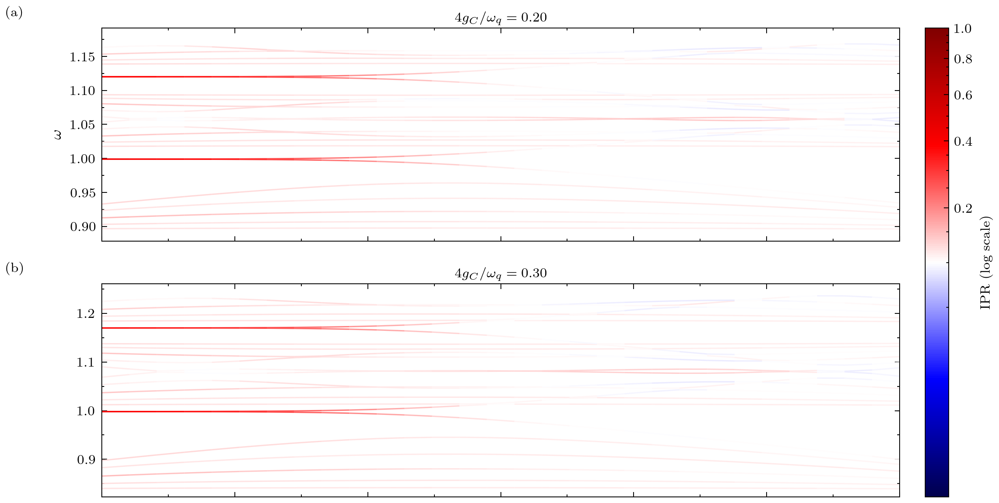

In [ ]:
import matplotlib.ticker as ticker
import matplotlib.colors as mcolors
from matplotlib.collections import LineCollection
import scipy.sparse.linalg as sla
from ssh_chain import PHOTONICChain
# ------------------------------------------------------------------ #
# Parameters
# ------------------------------------------------------------------ #
N = 6
gamma_zero = 0.01
fock_photon = 4
Omega_J = 1.0
Chi_J = 0.0
base_excitations = 1
fock_layers = 0
k_states = (4 * N - 1)
Omega_C_values = [0.2, 0.3]
Chi_C_values   = np.linspace(-0.6, 0.6, 30)   # <-- changed range
nrows, ncols   = 2, 2
fig_width      = 9.0
fig_height     = 5.0
panel_fontsize = 8

gap_threshold = 2e-3   # same as your diagnostic block

# ------------------------------------------------------------------ #
# Helper: resolve edge states via perturbation trick
# ------------------------------------------------------------------ #
def resolve_edge_states(chain, scale):
    """
    Returns (evec_left, evec_right) in the eigenbasis of chain.H,
    using the same scaled-perturbation strategy as in your diagnostic block.
    evec_left  -> index N-1  (left  edge, sorted by energy ascending)
    evec_right -> index N    (right edge)
    """
    H_pert = scale * (chain.H + make_edge_lifting_perturbation(chain, strength=1e-6))

    results = {}
    for sigma_try in [1.0 + 1e-4, 1.0 - 1e-4, 1.0 + 1e-3, 1.0 - 1e-3]:
        try:
            evals, evecs = sla.eigsh(H_pert, k=6, sigma=scale * sigma_try, which='LM')
            for i, e in enumerate(evals):
                if not any(abs(e - e2) < 1e-9 for e2 in results):
                    results[e] = evecs[:, i]
            if len(results) >= 4:
                break
        except RuntimeError:
            continue

    all_energies_scaled   = np.array(sorted(results.keys()))
    all_energies_physical = all_energies_scaled / scale
    all_states            = np.column_stack([results[e] for e in all_energies_scaled])

    # pick the two closest to 1.0 in physical units
    near_mask = np.abs(all_energies_physical - 1.0) < gap_threshold
    if near_mask.sum() < 2:
        near_mask = np.zeros(len(all_energies_physical), dtype=bool)
        near_mask[np.argsort(np.abs(all_energies_physical - 1.0))[:2]] = True

    V_near = all_states[:, near_mask]
    E_near = all_energies_physical[near_mask]

    if V_near.shape[1] > 2:
        best2  = np.argsort(np.abs(E_near - 1.0))[:2]
        V_near = V_near[:, best2]
        E_near = E_near[best2]

    e_order  = np.argsort(E_near)
    V_sorted = V_near[:, e_order]

    return V_sorted[:, 0], V_sorted[:, 1]   # (left_edge, right_edge)

def old_basis_matter_vec(evec, chain):
    d_ph  = chain.fock_photon
    d_mat = chain.fock_dim

    # 1. partial trace -> leading matter eigenvector (Bogoliubov basis)
    rho_matter     = chain.partial_trace(evec, which_to_keep='matter')
    _, evecs_rho   = np.linalg.eigh(rho_matter)
    matter_vec_new = evecs_rho[:, -1]

    # 2. embed as a photon-0 state in the full tensor-product space
    synth_vec         = np.zeros(d_ph * d_mat, dtype=complex)
    synth_vec[:d_mat] = matter_vec_new

    # 3. call the class method directly
    old_decomp = chain.decompose_to_old_fock(synth_vec)
    old_sector = old_decomp.get(0, {})

    # 4. reconstruct old-basis vector
    old_vec = np.zeros(d_mat, dtype=complex)
    for state_tuple, coeff in old_sector.items():
        exc = sum(state_tuple)
        if (exc in chain.fock_state_index
                and state_tuple in chain.fock_state_index[exc]):
            s_idx = chain.fock_state_index[exc][state_tuple]
            old_vec[chain.fock_offsets[exc] + s_idx] += coeff

    return old_vec

# ------------------------------------------------------------------ #
# Helper: IPR from a full eigenvector
# ------------------------------------------------------------------ #
# def ipr_from_evec(evec, chain):
#     old_vec    = old_basis_matter_vec(evec, chain)
#     ipr, xi, _ = chain.quanta_ipr(old_vec)
#     return ipr
def ipr_from_evec(evec, chain):
    decomp_vec = chain.decompose_to_old_fock(evec)
    comp_vec, sorted_states, _ = chain.compose_tensor_state(decomp_vec)
    
    d_ph       = chain.fock_photon
    d_mat      = len(sorted_states)          # inferred old-basis dimension
    psi        = comp_vec.reshape(d_ph, d_mat)
    matter_dm  = psi.conj().T @ psi         # (d_mat, d_mat), same formula as partial_trace
    
    ipr, xi, _ = chain.quanta_ipr_mixed(matter_dm)
    return ipr

# ------------------------------------------------------------------ #
# Compute spectra + IPR
# ------------------------------------------------------------------ #
all_energies = []
all_iprs     = []

for Omega_C in Omega_C_values:
    energies_list = []
    iprs_list     = []

    for Chi_C in Chi_C_values:
        print(Chi_C)
        aux     = 0.5 * Omega_C
        gamma   = gamma_zero * Omega_C / np.max(Omega_C_values)
        omega_r = 1.02 * np.sqrt(1 + aux) - np.sqrt(1 - aux)
        scale   = np.exp(10 * np.abs(Chi_C))

        chain = PHOTONICChain(N, Omega_C, Chi_C, omega_r, gamma, fock_photon,
                              Omega_J, Chi_J, False)
        chain.matter_hamiltonians(n_excitations=base_excitations, layers=fock_layers)
        chain.build_full_hamiltonian()

        # ── bulk states: standard eigsh ──────────────────────────────
        vals, vecs = chain.get_low_lying_spectrum(k=k_states)
        idx_sort   = np.argsort(vals)
        vals       = vals[idx_sort]
        vecs       = vecs[:, idx_sort]

        # ── edge states: perturbation trick at indices N-1 and N ─────
        try:
            evec_left, evec_right = resolve_edge_states(chain, scale)
            vecs[:, N - 1] = evec_left
            vecs[:, N]     = evec_right
        except Exception:
            pass   # fall back to whatever eigsh gave us
        
        chain.build_squeezed_vacuum(truncation = 1)
        # ── IPR for every state ──────────────────────────────────────
        iprs_this = [ipr_from_evec(vecs[:, col], chain)
                     for col in range(vecs.shape[1])]

        energies_list.append(vals)
        iprs_list.append(np.array(iprs_this))

    all_energies.append(np.array(energies_list))   # (n_Chi, k_states)
    all_iprs.append(np.array(iprs_list))            # (n_Chi, k_states)


# ------------------------------------------------------------------ #
# Figure
# ------------------------------------------------------------------ #
cmap = plt.cm.seismic
ipr_min  = 1e-3   # avoid log(0)
ipr_max  = 1.0
norm_ipr = mcolors.PowerNorm(gamma=0.3, vmin=ipr_min, vmax=ipr_max)   # <-- LogNorm

fig, axes = plt.subplots(nrows=nrows, ncols=1, figsize=(fig_width, fig_height))

for idx, (Omega_C, energies, iprs) in enumerate(zip(Omega_C_values, all_energies, all_iprs)):
    ax  = axes.flatten()[idx]
    row = idx // ncols
    col = idx  % ncols

    for band_e, band_ipr in zip(energies.T, iprs.T):
        points   = np.array([Chi_C_values, band_e]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)

        lc = LineCollection(segments, cmap=cmap, norm=norm_ipr,
                            linewidth=0.8, alpha=0.9)
        log_ipr_mid = np.clip(0.5 * (band_ipr[:-1] + band_ipr[1:]), ipr_min, None)
        lc.set_array(log_ipr_mid)                                 # <-- clipped, LogNorm handles the log
        # lc.set_array(0.5 * (band_ipr[:-1] + band_ipr[1:]))
        ax.add_collection(lc)

    ax.set_xlim(Chi_C_values[0], Chi_C_values[-1])
    e_all = energies.flatten()
    ax.set_ylim(e_all.min() - 0.02 * abs(e_all.min()),
                e_all.max() + 0.02 * abs(e_all.max()))

    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    ax.text(-0.12, 1.04, f'({chr(97 + idx)})',
            transform=ax.transAxes,
            fontsize=panel_fontsize, fontweight='bold',
            va='bottom', ha='left')
    ax.set_title(rf'$4g_C / \omega_q = {Omega_C:.2f}$', fontsize=8, pad=4)

    if row == nrows - 1:
        ax.set_xlabel(r'$\chi_C$')
    else:
        ax.tick_params(labelbottom=False)
    if col == 0:
        ax.set_ylabel(r'$\omega$')

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm_ipr)
sm.set_array([])
cbar = fig.colorbar(sm, ax=axes, orientation='vertical',
                    fraction=0.03, pad=0.03)
cbar.set_label(r'IPR (log scale)', fontsize=8)

plt.show()

-0.6
-0.5586206896551724
-0.5172413793103448
-0.4758620689655172
-0.43448275862068964
-0.3931034482758621
-0.35172413793103446
-0.31034482758620685
-0.2689655172413793
-0.22758620689655173
-0.18620689655172412
-0.1448275862068965
-0.10344827586206895
-0.06206896551724139
-0.020689655172413723
0.020689655172413834
0.06206896551724139
0.10344827586206895
0.1448275862068965
0.18620689655172418
0.22758620689655173
0.2689655172413793
0.31034482758620696
0.3517241379310345
0.3931034482758621
0.43448275862068975
0.4758620689655172
0.5172413793103449
0.5586206896551725
0.6
-0.6
-0.5586206896551724
-0.5172413793103448
-0.4758620689655172
-0.43448275862068964
-0.3931034482758621
-0.35172413793103446
-0.31034482758620685
-0.2689655172413793
-0.22758620689655173
-0.18620689655172412
-0.1448275862068965
-0.10344827586206895
-0.06206896551724139
-0.020689655172413723
0.020689655172413834
0.06206896551724139
0.10344827586206895
0.1448275862068965
0.18620689655172418
0.22758620689655173
0.268965517241

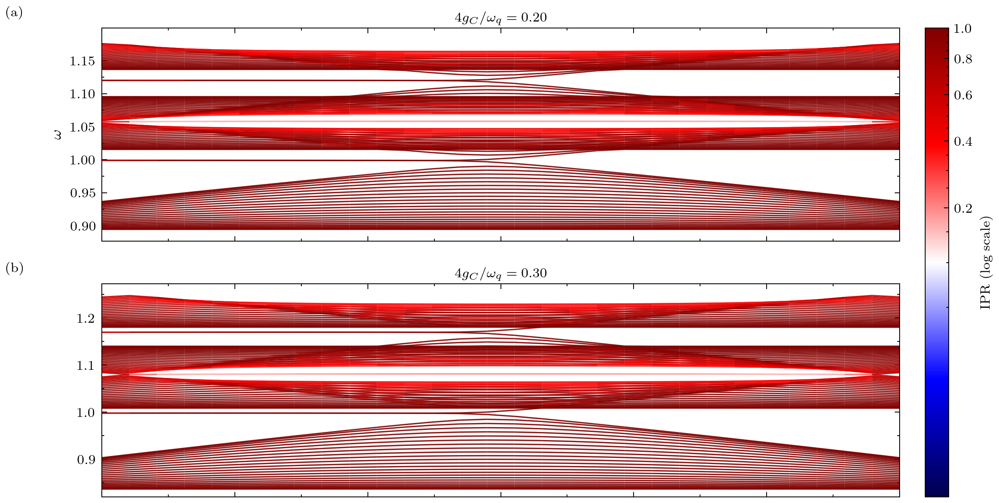

In [ ]:
import matplotlib.ticker as ticker
import matplotlib.colors as mcolors
from matplotlib.collections import LineCollection
import scipy.sparse.linalg as sla
from ssh_chain import PHOTONICChain as model
# ------------------------------------------------------------------ #
# Parameters
# ------------------------------------------------------------------ #
N = 26
gamma_zero = 0.01
fock_photon = 4
Omega_J = 1.0
Chi_J = 0.0
base_excitations = 1
fock_layers = 0
k_states = (4 * N - 1)
Omega_C_values = [0.2, 0.3]
Chi_C_values   = np.linspace(-0.6, 0.6, 30)
nrows, ncols   = 2, 2
fig_width      = 9.0
fig_height     = 5.0
panel_fontsize = 8

gap_threshold = 2e-3

# ------------------------------------------------------------------ #
# Helper: resolve edge states via perturbation trick
# ------------------------------------------------------------------ #
def resolve_edge_states(chain, scale):
    H_pert = scale * (chain.H + make_edge_lifting_perturbation(chain, strength=1e-6))

    results = {}
    for sigma_try in [1.0 + 1e-4, 1.0 - 1e-4, 1.0 + 1e-3, 1.0 - 1e-3]:
        try:
            evals, evecs = sla.eigsh(H_pert, k=6, sigma=scale * sigma_try, which='LM')
            for i, e in enumerate(evals):
                if not any(abs(e - e2) < 1e-9 for e2 in results):
                    results[e] = evecs[:, i]
            if len(results) >= 4:
                break
        except RuntimeError:
            continue

    all_energies_scaled   = np.array(sorted(results.keys()))
    all_energies_physical = all_energies_scaled / scale
    all_states            = np.column_stack([results[e] for e in all_energies_scaled])

    near_mask = np.abs(all_energies_physical - 1.0) < gap_threshold
    if near_mask.sum() < 2:
        near_mask = np.zeros(len(all_energies_physical), dtype=bool)
        near_mask[np.argsort(np.abs(all_energies_physical - 1.0))[:2]] = True

    V_near = all_states[:, near_mask]
    E_near = all_energies_physical[near_mask]

    if V_near.shape[1] > 2:
        best2  = np.argsort(np.abs(E_near - 1.0))[:2]
        V_near = V_near[:, best2]
        E_near = E_near[best2]

    e_order  = np.argsort(E_near)
    V_sorted = V_near[:, e_order]

    return V_sorted[:, 0], V_sorted[:, 1]


# ------------------------------------------------------------------ #
# Compute spectra + IPR
# ------------------------------------------------------------------ #
all_energies = []
all_iprs     = []

for Omega_C in Omega_C_values:
    energies_list = []
    iprs_list     = []

    for Chi_C in Chi_C_values:
        print(Chi_C)
        aux     = 0.5 * Omega_C
        gamma   = gamma_zero * Omega_C / np.max(Omega_C_values)
        omega_r = 1.02 * np.sqrt(1 + aux) - np.sqrt(1 - aux)
        scale   = np.exp(10 * np.abs(Chi_C))

        chain = model(N, Omega_C, Chi_C, omega_r, gamma, fock_photon,
                              Omega_J, Chi_J, False)
        chain.matter_hamiltonians(n_excitations=base_excitations, layers=fock_layers)
        chain.build_full_hamiltonian()

        # ── bulk states: standard eigsh ──────────────────────────────
        vals, vecs = chain.get_low_lying_spectrum(k=k_states)
        idx_sort   = np.argsort(vals)
        vals       = vals[idx_sort]
        vecs       = vecs[:, idx_sort]

        # ── edge states: perturbation trick at indices N-1 and N ─────
        try:
            evec_left, evec_right = resolve_edge_states(chain, scale)
            vecs[:, N - 1] = evec_left
            vecs[:, N]     = evec_right
        except Exception:
            pass

        # ── IPR for every state via mixed-state generalization ───────
        iprs_this = []
        for col in range(vecs.shape[1]):
            old_vecs = np.array()
            rho_matter = chain.partial_trace(vecs[:, col], which_to_keep='matter')
            ipr, xi, _ = chain.quanta_ipr_mixed(rho_matter)
            iprs_this.append(ipr)

        energies_list.append(vals)
        iprs_list.append(np.array(iprs_this))

    all_energies.append(np.array(energies_list))   # (n_Chi, k_states)
    all_iprs.append(np.array(iprs_list))            # (n_Chi, k_states)


# ------------------------------------------------------------------ #
# Figure
# ------------------------------------------------------------------ #
cmap     = plt.cm.seismic
ipr_min  = 1e-3
ipr_max  = 1.0
norm_ipr = mcolors.PowerNorm(gamma=0.3, vmin=ipr_min, vmax=ipr_max)

fig, axes = plt.subplots(nrows=nrows, ncols=1, figsize=(fig_width, fig_height))

for idx, (Omega_C, energies, iprs) in enumerate(zip(Omega_C_values[:len(all_energies)], all_energies, all_iprs)):
    ax  = axes.flatten()[idx]
    row = idx // ncols
    col = idx  % ncols

    for band_e, band_ipr in zip(energies.T, iprs.T):
        points   = np.array([Chi_C_values, band_e]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)

        lc = LineCollection(segments, cmap=cmap, norm=norm_ipr,
                            linewidth=0.8, alpha=0.9)
        log_ipr_mid = np.clip(0.5 * (band_ipr[:-1] + band_ipr[1:]), ipr_min, None)
        lc.set_array(log_ipr_mid)
        ax.add_collection(lc)

    ax.set_xlim(Chi_C_values[0], Chi_C_values[-1])
    e_all = energies.flatten()
    ax.set_ylim(e_all.min() - 0.02 * abs(e_all.min()),
                e_all.max() + 0.02 * abs(e_all.max()))

    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    ax.text(-0.12, 1.04, f'({chr(97 + idx)})',
            transform=ax.transAxes,
            fontsize=panel_fontsize, fontweight='bold',
            va='bottom', ha='left')
    ax.set_title(rf'$4g_C / \omega_q = {Omega_C:.2f}$', fontsize=8, pad=4)

    if row == nrows - 1:
        ax.set_xlabel(r'$\chi_C$')
    else:
        ax.tick_params(labelbottom=False)
    if col == 0:
        ax.set_ylabel(r'$\omega$')

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm_ipr)
sm.set_array([])
cbar = fig.colorbar(sm, ax=axes, orientation='vertical',
                    fraction=0.03, pad=0.03)
cbar.set_label(r'IPR (log scale)', fontsize=8)

plt.savefig('ipr_spectrum.pdf', bbox_inches='tight', dpi=150)
plt.show()

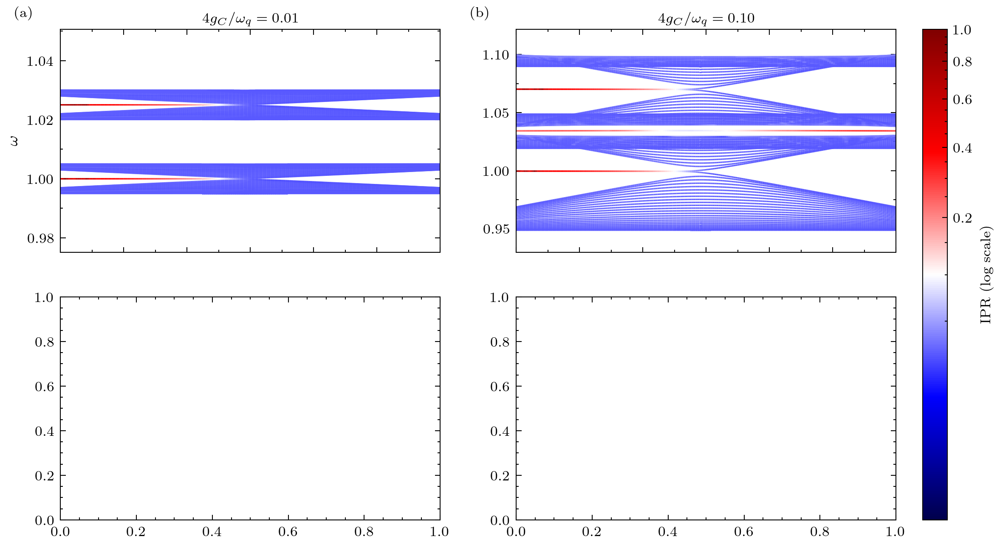

In [18]:
# ------------------------------------------------------------------ #
# Figure
# ------------------------------------------------------------------ #
cmap = plt.cm.seismic
ipr_min  = 1e-3   # avoid log(0)
ipr_max  = 1.0
norm_ipr = mcolors.PowerNorm(gamma=0.3, vmin=ipr_min, vmax=ipr_max)   # <-- LogNorm

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(fig_width, fig_height))

for idx, (Omega_C, energies, iprs) in enumerate(zip(Omega_C_values, all_energies, all_iprs)):
    ax  = axes.flatten()[idx]
    row = idx // ncols
    col = idx  % ncols

    for band_e, band_ipr in zip(energies.T, iprs.T):
        points   = np.array([Chi_C_values, band_e]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)

        lc = LineCollection(segments, cmap=cmap, norm=norm_ipr,
                            linewidth=0.8, alpha=0.9)
        log_ipr_mid = np.clip(0.5 * (band_ipr[:-1] + band_ipr[1:]), ipr_min, None)
        lc.set_array(log_ipr_mid)                                 # <-- clipped, LogNorm handles the log
        # lc.set_array(0.5 * (band_ipr[:-1] + band_ipr[1:]))
        ax.add_collection(lc)

    ax.set_xlim(Chi_C_values[0], Chi_C_values[-1])
    e_all = energies.flatten()
    ax.set_ylim(e_all.min() - 0.02 * abs(e_all.min()),
                e_all.max() + 0.02 * abs(e_all.max()))

    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    ax.text(-0.12, 1.04, f'({chr(97 + idx)})',
            transform=ax.transAxes,
            fontsize=panel_fontsize, fontweight='bold',
            va='bottom', ha='left')
    ax.set_title(rf'$4g_C / \omega_q = {Omega_C:.2f}$', fontsize=8, pad=4)

    if row == nrows - 1:
        ax.set_xlabel(r'$\chi_C$')
    else:
        ax.tick_params(labelbottom=False)
    if col == 0:
        ax.set_ylabel(r'$\omega$')

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm_ipr)
sm.set_array([])
cbar = fig.colorbar(sm, ax=axes, orientation='vertical',
                    fraction=0.03, pad=0.03)
cbar.set_label(r'IPR (log scale)', fontsize=8)

plt.show()

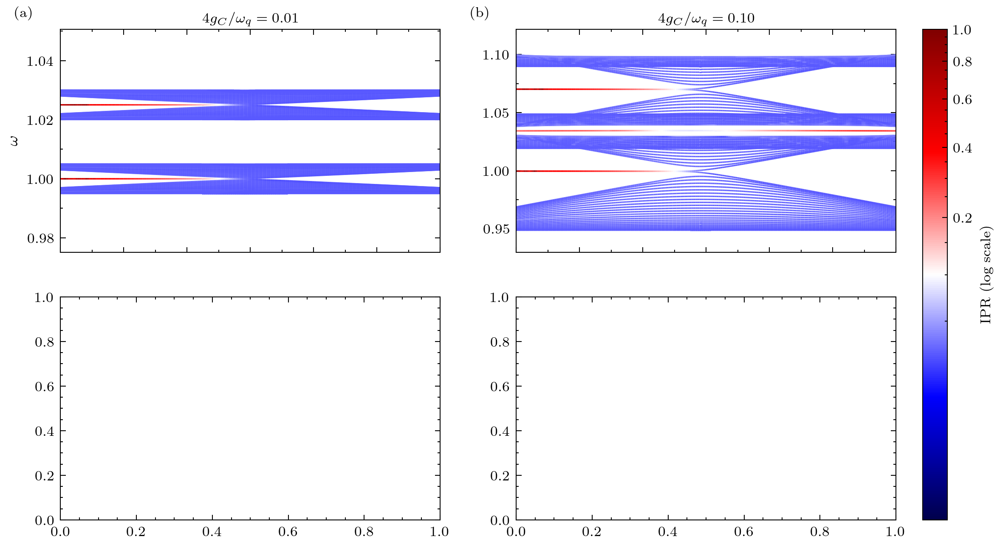

In [19]:
# ------------------------------------------------------------------ #
# Figure
# ------------------------------------------------------------------ #
cmap = plt.cm.seismic
ipr_min  = 1e-3
ipr_max  = 1.0
norm_ipr = mcolors.PowerNorm(gamma=0.3, vmin=ipr_min, vmax=ipr_max)

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(fig_width, fig_height))

for idx, (Omega_C, energies, iprs) in enumerate(zip(Omega_C_values[:len(all_energies)], all_energies, all_iprs)):
    ax  = axes.flatten()[idx]
    row = idx // ncols
    col = idx  % ncols

    for band_e, band_ipr in zip(energies.T, iprs.T):
        points   = np.array([Chi_C_values, band_e]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)

        lc = LineCollection(segments, cmap=cmap, norm=norm_ipr,
                            linewidth=0.8, alpha=0.9)
        log_ipr_mid = np.clip(0.5 * (band_ipr[:-1] + band_ipr[1:]), ipr_min, None)
        lc.set_array(log_ipr_mid)
        ax.add_collection(lc)

    ax.set_xlim(Chi_C_values[0], Chi_C_values[-1])
    e_all = energies.flatten()
    ax.set_ylim(e_all.min() - 0.02 * abs(e_all.min()),
                e_all.max() + 0.02 * abs(e_all.max()))

    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    ax.text(-0.12, 1.04, f'({chr(97 + idx)})',
            transform=ax.transAxes,
            fontsize=panel_fontsize, fontweight='bold',
            va='bottom', ha='left')
    ax.set_title(rf'$4g_C / \omega_q = {Omega_C:.2f}$', fontsize=8, pad=4)

    if row == nrows - 1:
        ax.set_xlabel(r'$\chi_C$')
    else:
        ax.tick_params(labelbottom=False)
    if col == 0:
        ax.set_ylabel(r'$\omega$')

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm_ipr)
sm.set_array([])
cbar = fig.colorbar(sm, ax=axes, orientation='vertical',
                    fraction=0.03, pad=0.03)
cbar.set_label(r'IPR (log scale)', fontsize=8)

plt.savefig('ipr_spectrum.pdf', bbox_inches='tight', dpi=150)
plt.show()

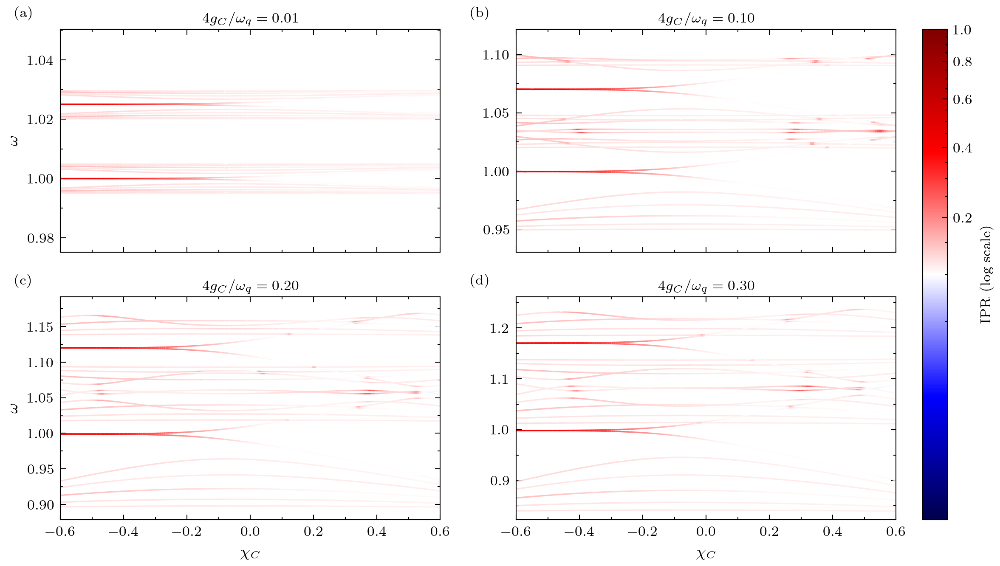

In [16]:
# ------------------------------------------------------------------ #
# Figure
# ------------------------------------------------------------------ #
cmap = plt.cm.seismic
ipr_min  = 1e-3   # avoid log(0)
ipr_max  = 1.0
norm_ipr = mcolors.PowerNorm(gamma=0.3, vmin=ipr_min, vmax=ipr_max)   # <-- LogNorm

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(fig_width, fig_height))

for idx, (Omega_C, energies, iprs) in enumerate(zip(Omega_C_values, all_energies, all_iprs)):
    ax  = axes.flatten()[idx]
    row = idx // ncols
    col = idx  % ncols

    for band_e, band_ipr in zip(energies.T, iprs.T):
        points   = np.array([Chi_C_values, band_e]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)

        lc = LineCollection(segments, cmap=cmap, norm=norm_ipr,
                            linewidth=0.8, alpha=0.9)
        log_ipr_mid = np.clip(0.5 * (band_ipr[:-1] + band_ipr[1:]), ipr_min, None)
        lc.set_array(log_ipr_mid)                                 # <-- clipped, LogNorm handles the log
        # lc.set_array(0.5 * (band_ipr[:-1] + band_ipr[1:]))
        ax.add_collection(lc)

    ax.set_xlim(Chi_C_values[0], Chi_C_values[-1])
    e_all = energies.flatten()
    ax.set_ylim(e_all.min() - 0.02 * abs(e_all.min()),
                e_all.max() + 0.02 * abs(e_all.max()))

    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    ax.text(-0.12, 1.04, f'({chr(97 + idx)})',
            transform=ax.transAxes,
            fontsize=panel_fontsize, fontweight='bold',
            va='bottom', ha='left')
    ax.set_title(rf'$4g_C / \omega_q = {Omega_C:.2f}$', fontsize=8, pad=4)

    if row == nrows - 1:
        ax.set_xlabel(r'$\chi_C$')
    else:
        ax.tick_params(labelbottom=False)
    if col == 0:
        ax.set_ylabel(r'$\omega$')

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm_ipr)
sm.set_array([])
cbar = fig.colorbar(sm, ax=axes, orientation='vertical',
                    fraction=0.03, pad=0.03)
cbar.set_label(r'IPR (log scale)', fontsize=8)

plt.show()

/tmp/ipykernel_5149/3901241651.py:123: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(pad=0.4, h_pad=0.5, w_pad=0.5)


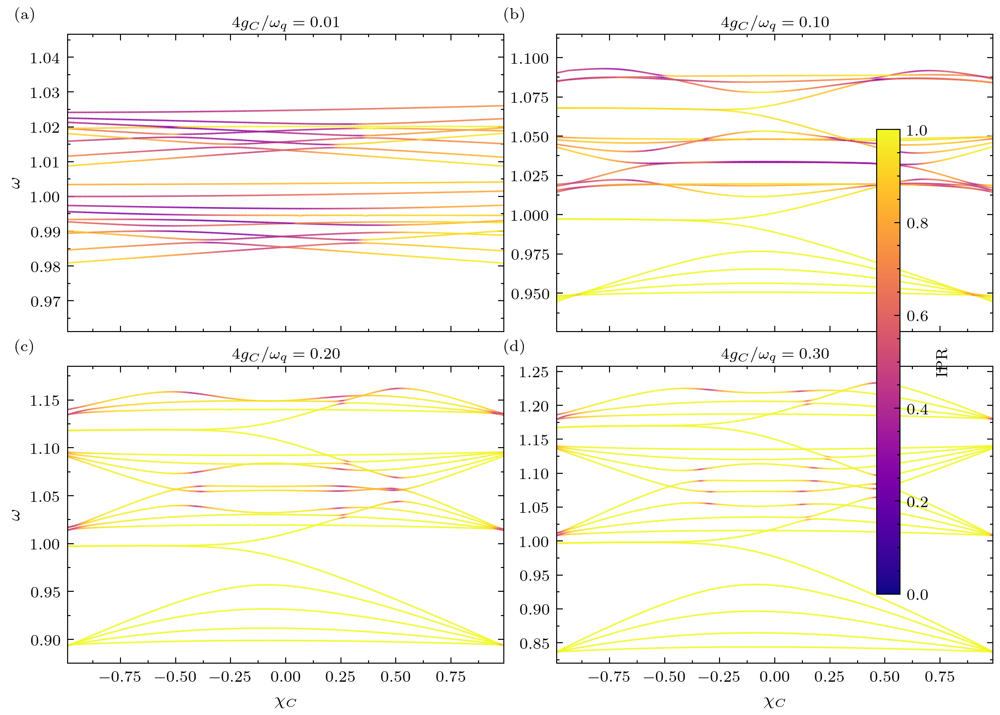

In [198]:
import matplotlib.ticker as ticker
import matplotlib.colors as mcolors

# ------------------------------------------------------------------ #
# Parámetros del sistema
# ------------------------------------------------------------------ #
N = 5
gamma = 0.01
fock_photon = 4
Omega_J = 1.0
Chi_J = 0.0
base_excitations = 1
fock_layers = 0
k_states = (4 * N - 1)
Omega_C_values = [0.01, 0.1, 0.2, 0.3]
Chi_C_values   = np.linspace(-0.99, 0.99, 200)
nrows, ncols   = 2, 2
fig_width      = 7.0
fig_height     = 5.0
panel_fontsize = 8

# ------------------------------------------------------------------ #
# Compute spectra + IPR
# ------------------------------------------------------------------ #
all_energies = []
all_iprs     = []

for Omega_C in Omega_C_values:
    energies_list = []
    iprs_list     = []

    for Chi_C in Chi_C_values:
        aux     = 0.5 * Omega_C
        omega_r = 1.02 * np.sqrt(1 + aux) - np.sqrt(1 - aux)

        chain = PHOTONICChain(N, Omega_C, Chi_C, omega_r, gamma, fock_photon,
                              Omega_J, Chi_J, False)
        chain.matter_hamiltonians(n_excitations=base_excitations, layers=fock_layers)
        chain.build_full_hamiltonian()

        vals, vecs = chain.get_low_lying_spectrum(k=k_states)
        idx_sort   = np.argsort(vals)
        vals       = vals[idx_sort]
        vecs       = vecs[:, idx_sort]   # columns are eigenvectors

        iprs_this = []
        for col in range(vecs.shape[1]):
            evec = vecs[:, col]

            # --- reduced density matrix of the matter sector ---
            rho_matter = chain.partial_trace(evec, which_to_keep='matter')
            # shape: (fock_dim, fock_dim)

            # --- leading eigenvector of rho_matter as a matter Fock vector ---
            # This is the "most probable" matter state, independent of photon dressing
            evals_rho, evecs_rho = np.linalg.eigh(rho_matter)
            matter_vec = evecs_rho[:, -1]   # eigenvector with largest eigenvalue

            # --- IPR on that matter vector ---
            ipr, xi, _ = chain.quanta_ipr(matter_vec)
            iprs_this.append(ipr)

        energies_list.append(vals)
        iprs_list.append(np.array(iprs_this))

    all_energies.append(np.array(energies_list))   # (n_Chi, k_states)
    all_iprs.append(np.array(iprs_list))            # (n_Chi, k_states)

# ------------------------------------------------------------------ #
# Figure
# ------------------------------------------------------------------ #
cmap     = plt.cm.plasma
ipr_min  = 0.0
ipr_max  = 1.0
norm_ipr = mcolors.Normalize(vmin=ipr_min, vmax=ipr_max)

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(fig_width, fig_height))

for idx, (Omega_C, energies, iprs) in enumerate(zip(Omega_C_values, all_energies, all_iprs)):
    ax  = axes.flatten()[idx]
    row = idx // ncols
    col = idx  % ncols

    # energies and iprs: shape (n_Chi, k_states)
    # iterate over bands (transpose -> shape (k_states, n_Chi))
    for band_e, band_ipr in zip(energies.T, iprs.T):
        points  = np.array([Chi_C_values, band_e]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)

        from matplotlib.collections import LineCollection
        lc = LineCollection(segments, cmap=cmap, norm=norm_ipr,
                            linewidth=0.8, alpha=0.9)
        lc.set_array(0.5 * (band_ipr[:-1] + band_ipr[1:]))  # color at midpoint
        ax.add_collection(lc)

    ax.set_xlim(Chi_C_values[0], Chi_C_values[-1])
    e_all = energies.flatten()
    ax.set_ylim(e_all.min() - 0.02 * abs(e_all.min()),
                e_all.max() + 0.02 * abs(e_all.max()))

    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    ax.text(-0.12, 1.04, f'({chr(97 + idx)})',
            transform=ax.transAxes,
            fontsize=panel_fontsize, fontweight='bold',
            va='bottom', ha='left')
    ax.set_title(rf'$4g_C / \omega_q = {Omega_C:.2f}$', fontsize=8, pad=4)

    if row == nrows - 1:
        ax.set_xlabel(r'$\chi_C$')
    else:
        ax.tick_params(labelbottom=False)
    if col == 0:
        ax.set_ylabel(r'$\omega$')

# shared colorbar on the right
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm_ipr)
sm.set_array([])
cbar = fig.colorbar(sm, ax=axes, orientation='vertical',
                    fraction=0.03, pad=0.03)
cbar.set_label(r'IPR', fontsize=8)

fig.tight_layout(pad=0.4, h_pad=0.5, w_pad=0.5)
plt.show()

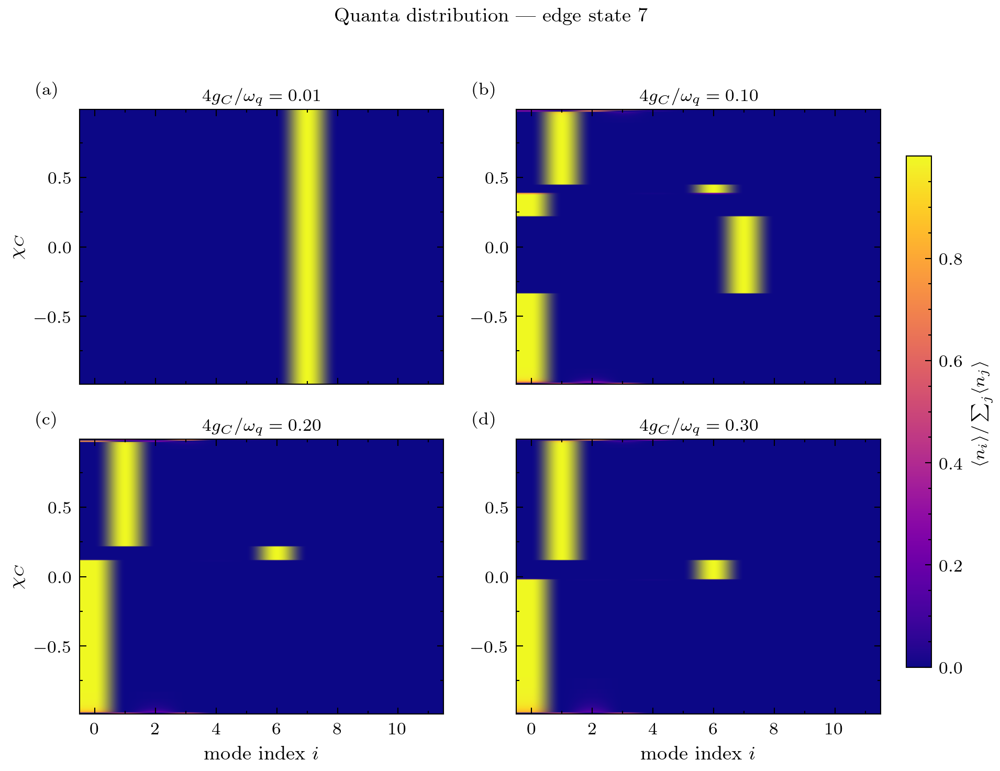

In [204]:
import matplotlib.ticker as ticker
import matplotlib.colors as mcolors

# ------------------------------------------------------------------ #
# Parámetros
# ------------------------------------------------------------------ #
N            = 6
gamma_zero        = 0.01
fock_photon  = 4
Omega_J      = 1.0
Chi_J        = 0.0
base_excitations = 1
fock_layers      = 0
k_states     = (4 * N - 1)

# index of the edge state within the sorted spectrum (0-based)
# for 1-excitation OBC SSH, the edge pair is at N-1 and N
edge_idx     = N+1   # change to N for the other one of the pair

Omega_C_values = [0.01, 0.1, 0.2, 0.3]
Chi_C_values   = np.linspace(-0.99, 0.99, 200)
nrows, ncols   = 2, 2
fig_width      = 7.0
fig_height     = 5.0
panel_fontsize = 8

n_modes = 2 * N   # length of the quanta distribution vector

# ------------------------------------------------------------------ #
# Compute quanta distributions of the edge state
# ------------------------------------------------------------------ #
# all_distributions[panel] has shape (n_Chi, n_modes)
all_distributions = []

for Omega_C in Omega_C_values:
    dist_list = []

    for Chi_C in Chi_C_values:
        aux     = 0.5 * Omega_C
        omega_r = 1.02 * np.sqrt(1 + aux) - np.sqrt(1 - aux)
        gamma = gamma_zero * Omega_C / np.max(Omega_C_values)
        chain = PHOTONICChain(N, Omega_C, Chi_C, omega_r, gamma, fock_photon,
                              Omega_J, Chi_J, False)
        chain.matter_hamiltonians(n_excitations=base_excitations, layers=fock_layers)
        chain.build_full_hamiltonian()

        vals, vecs = chain.get_low_lying_spectrum(k=k_states)
        idx_sort   = np.argsort(vals)
        vecs       = vecs[:, idx_sort]

        # extract the edge eigenvector
        evec = vecs[:, edge_idx]

        # partial trace over photon -> matter reduced density matrix
        rho_matter = chain.partial_trace(evec, which_to_keep='matter')

        # leading eigenvector of rho_matter
        evals_rho, evecs_rho = np.linalg.eigh(rho_matter)
        matter_vec = evecs_rho[:, -1]

        # quanta distribution over the 2N Bogoliubov modes
        dist = chain.quanta_distribution(matter_vec)   # length 2*N, normalized
        dist_list.append(dist)

    all_distributions.append(np.array(dist_list))   # (n_Chi, 2*N)

# ------------------------------------------------------------------ #
# Figure: heatmap of P(mode, chi_C) for each panel
# ------------------------------------------------------------------ #
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(fig_width, fig_height))

mode_indices = np.arange(n_modes)   # x-axis: mode index 0 .. 2N-1

for idx, (Omega_C, dists) in enumerate(zip(Omega_C_values, all_distributions)):
    ax  = axes.flatten()[idx]
    row = idx // ncols
    col = idx  % ncols

    # dists: (n_Chi, n_modes) — plot as heatmap with chi_C on y, mode on x
    im = ax.imshow(
        dists,
        origin='lower',
        aspect='auto',
        extent=[mode_indices[0] - 0.5, mode_indices[-1] + 0.5,
                Chi_C_values[0],        Chi_C_values[-1]],
        cmap='plasma',
        vmin=0.0,
        vmax=dists.max(),
    )

    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    ax.text(-0.12, 1.04, f'({chr(97 + idx)})',
            transform=ax.transAxes,
            fontsize=panel_fontsize, fontweight='bold',
            va='bottom', ha='left')
    ax.set_title(rf'$4g_C / \omega_q = {Omega_C:.2f}$', fontsize=8, pad=4)

    if row == nrows - 1:
        ax.set_xlabel(r'mode index $i$')
    else:
        ax.tick_params(labelbottom=False)
    if col == 0:
        ax.set_ylabel(r'$\chi_C$')

# shared colorbar
sm = plt.cm.ScalarMappable(cmap='plasma',
                            norm=mcolors.Normalize(vmin=0.0,
                                                   vmax=max(d.max() for d in all_distributions)))
sm.set_array([])
cbar = fig.colorbar(sm, ax=axes, orientation='vertical',
                    fraction=0.03, pad=0.03)
cbar.set_label(r'$\langle n_i \rangle / \sum_j \langle n_j \rangle$', fontsize=8)

fig.suptitle(rf'Quanta distribution — edge state {edge_idx}', fontsize=9, y=1.01)
# fig.tight_layout(pad=0.4, h_pad=0.5, w_pad=0.5)
plt.show()

In [ ]:
# ================================================================== #
# TEST 1 — Ground state quanta distribution vs Omega_C
# In the OLD (pre-Bogoliubov) Fock basis
# ================================================================== #
import matplotlib.ticker as ticker

N            = 26
gamma        = 0.01
fock_photon  = 4
Omega_J      = 1.0
Chi_J        = 0.0
base_excitations = 0
fock_layers      = 0
Chi_C        = 0.0   # no topology, just check squeezing
n_modes      = 2 * N

Omega_C_values_test = np.linspace(0.01, 0.8, 8)

fig, axes = plt.subplots(2, 4, figsize=(10, 4), sharey=True)

for idx, Omega_C in enumerate(Omega_C_values_test):
    ax = axes.flatten()[idx]

    aux     = 0.5 * Omega_C
    omega_r = 1.02 * np.sqrt(1 + aux) - np.sqrt(1 - aux)

    chain = PHOTONICChain(N, Omega_C, Chi_C, omega_r, gamma, fock_photon,
                          Omega_J, Chi_J, False)
    chain.matter_hamiltonians(n_excitations=base_excitations, layers=fock_layers)
    chain.build_full_hamiltonian()
    chain.build_squeezed_vacuum(truncation = 3)
    # ground state = lowest eigenvector of full H
    vals, vecs = chain.get_low_lying_spectrum(k=1)
    gs_vec = vecs[:, 0]

    # partial trace over photon
    rho_matter = chain.partial_trace(gs_vec, which_to_keep='matter')
    evals_rho, evecs_rho = np.linalg.eigh(rho_matter)
    matter_vec = evecs_rho[:, -1]   # dominant matter component

    # --- express in OLD Fock basis ---
    # matter_vec is a flat array in the Bogoliubov basis (length fock_dim)
    # build a synthetic full vector with only the matter part (photon = |0>)
    # by tensoring: |0>_ph ⊗ matter_vec
    d_ph  = chain.fock_photon
    d_mat = chain.fock_dim
    synth_vec = np.zeros(d_ph * d_mat, dtype=complex)
    synth_vec[:d_mat] = matter_vec   # alpha=0 block

    old_decomp = chain.decompose_to_old_fock(synth_vec)
    # old_decomp[0] is the alpha=0 sector: {old_fock_tuple -> coeff}
    old_sector = old_decomp.get(0, {})

    # build distribution: P(i) = sum over states with n_i>0 of |coeff|^2 * n_i
    dist = np.zeros(n_modes)
    norm = 0.0
    for state_tuple, coeff in old_sector.items():
        w = abs(coeff) ** 2
        for i, ni in enumerate(state_tuple):
            dist[i] += w * ni
        norm += w
    if norm > 1e-15:
        dist /= dist.sum()

    ax.bar(np.arange(n_modes), dist, width=0.8, color='#03AED2', alpha=0.85)
    ax.set_title(rf'$\Omega_C={Omega_C:.2f}$', fontsize=8, pad=3)
    ax.set_xlim(-0.5, n_modes - 0.5)
    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    if idx >= 4:
        ax.set_xlabel('mode $i$', fontsize=8)
    if idx % 4 == 0:
        ax.set_ylabel(r'$\langle n_i \rangle / \sum_j \langle n_j \rangle$', fontsize=7)

fig.suptitle(r'Ground state quanta distribution (old basis) vs $\Omega_C$, $\chi_C=0$',
             fontsize=9)
# fig.tight_layout(pad=0.4, h_pad=0.6, w_pad=0.4)
plt.show()

In [ ]:
# ================================================================== #
# TEST 2 — Edge state quanta distribution at chi_C ~ -1
# in the OLD Fock basis, for small Omega_C
# Should show exponentially decaying, alternating-site profile
# ================================================================== #

Chi_C_edge   = -0.95
Omega_C_test = 0.05   # small -> nearly unsqueezed, Bogoliubov ~ identity
edge_idx     = N - 1  # adjust if needed after checking IPR plot

aux     = 0.5 * Omega_C_test
omega_r = 1.02 * np.sqrt(1 + aux) - np.sqrt(1 - aux)

chain = PHOTONICChain(N, Omega_C_test, Chi_C_edge, omega_r, gamma, fock_photon,
                      Omega_J, Chi_J, False)
chain.matter_hamiltonians(n_excitations=base_excitations, layers=fock_layers)
chain.build_full_hamiltonian()
chain.build_squeezed_vacuum(truncation = 2)
vals, vecs = chain.get_low_lying_spectrum(k=k_states)
idx_sort   = np.argsort(vals)
vecs       = vecs[:, idx_sort]

evec = vecs[:, edge_idx]

# partial trace -> dominant matter component
rho_matter = chain.partial_trace(evec, which_to_keep='matter')
evals_rho, evecs_rho = np.linalg.eigh(rho_matter)
matter_vec = evecs_rho[:, -1]

# synthetic full vector: place matter_vec in photon sector alpha=0
d_ph  = chain.fock_photon
d_mat = chain.fock_dim
synth_vec = np.zeros(d_ph * d_mat, dtype=complex)
synth_vec[:d_mat] = matter_vec

old_decomp  = chain.decompose_to_old_fock(synth_vec)
old_sector  = old_decomp.get(0, {})

dist_old  = np.zeros(n_modes)
dist_new  = np.zeros(n_modes)   # Bogoliubov basis for comparison
norm_old  = 0.0

for state_tuple, coeff in old_sector.items():
    w = abs(coeff) ** 2
    for i, ni in enumerate(state_tuple):
        dist_old[i] += w * ni
    norm_old += w

# also get distribution directly in new (Bogoliubov) basis
dist_new_raw = chain.quanta_distribution(matter_vec)

if norm_old > 1e-15:
    dist_old /= dist_old.sum()

site_indices = np.arange(n_modes)
fig, axes = plt.subplots(1, 2, figsize=(9, 3.5))

# --- left panel: old basis ---
ax = axes[0]
ax.bar(site_indices[0::2], dist_old[0::2], width=0.8,
       color='#03AED2', alpha=0.9, label='sublattice A')
ax.bar(site_indices[1::2], dist_old[1::2], width=0.8,
       color='#D12052', alpha=0.9, label='sublattice B')
ax.set_xlabel('mode $i$', fontsize=9)
ax.set_ylabel(r'$\langle n_i \rangle / \sum_j \langle n_j \rangle$', fontsize=9)
ax.set_title(r'Edge state — old Fock basis', fontsize=9)
ax.legend(fontsize=8)
ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(2))

# --- right panel: Bogoliubov basis ---
ax = axes[1]
ax.bar(site_indices[0::2], dist_new_raw[0::2], width=0.8,
       color='#03AED2', alpha=0.9, label='sublattice A')
ax.bar(site_indices[1::2], dist_new_raw[1::2], width=0.8,
       color='#D12052', alpha=0.9, label='sublattice B')
ax.set_xlabel('mode $i$', fontsize=9)
ax.set_title(r'Edge state — Bogoliubov basis', fontsize=9)
ax.legend(fontsize=8)
ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(2))

fig.suptitle(
    rf'$\Omega_C={Omega_C_test}$, $\chi_C={Chi_C_edge}$, edge state {edge_idx}',
    fontsize=9)
fig.tight_layout(pad=0.4, w_pad=0.6)
plt.show()

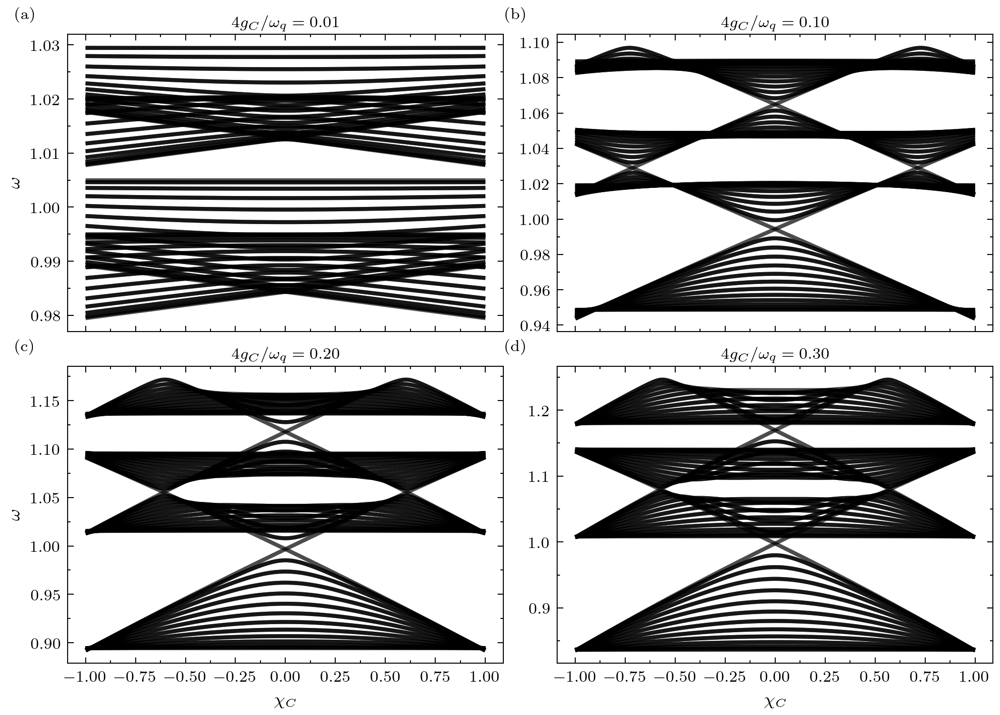

In [132]:
import matplotlib.ticker as ticker

# ------------------------------------------------------------------ #
# Parámetros del sistema
# ------------------------------------------------------------------ #
N = 26  

gamma = 0.01
fock_photon = 4
Omega_J = 1.0
Chi_J = 0.0

# Truncation parameters for the chain's Fock space
base_excitations = 1
fock_layers = 0
k_states = (4 * N  - 1)   # Number of low-lying states to compute and plot

Omega_C_values = [0.01, 0.1, 0.2, 0.3]   # four panels
Chi_C_values  = np.linspace(-0.99, 0.99, 200) # Reduced to 50 for faster initial testing

nrows, ncols  = 2, 2
fig_width     = 7.0
fig_height    = 5.0
panel_fontsize = 8

# ------------------------------------------------------------------ #
# Compute spectra
# ------------------------------------------------------------------ #
all_energies = []
for Omega_C in Omega_C_values:
    energies = []
    for Chi_C in Chi_C_values:
        # 1. Initialize the system
        aux = 0.5 * Omega_C
        omega_r = 1.02 * np.sqrt(1+aux) - np.sqrt(1-aux)
        chain = PHOTONICChain(N, Omega_C, Chi_C, omega_r, gamma, fock_photon, Omega_J, Chi_J, True)
        
        chain.matter_hamiltonians(n_excitations=base_excitations, layers=fock_layers)
        chain.build_full_hamiltonian()
        # 3. Compute the lowest 'k' eigenvalues
        vals, _ = chain.get_low_lying_spectrum(k=k_states)
        energies.append(np.sort(vals))
        
    all_energies.append(np.array(energies))

# ------------------------------------------------------------------ #
# Figure
# ------------------------------------------------------------------ #
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(fig_width, fig_height))

for idx, (Omega_C, energies) in enumerate(zip(Omega_C_values, all_energies)):
    ax  = axes.flatten()[idx]
    row = idx // ncols
    col = idx  % ncols

    # energies shape is (len(Chi_C_values), k_states)
    # Transposing allows us to iterate through the 'k' bands
    for band in energies.T:
        ax.plot(Chi_C_values, band, color='black', alpha=0.7)

    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator(2))

    ax.text(-0.12, 1.04, f'({chr(97 + idx)})',
            transform=ax.transAxes,
            fontsize=panel_fontsize, fontweight='bold',
            va='bottom', ha='left')

    ax.set_title(rf'$4g_C / \omega_q = {Omega_C:.2f}$', fontsize=8, pad=4)

    if row == nrows - 1:
        ax.set_xlabel(r'$\chi_C$')
    else:
        ax.tick_params(labelbottom=False)

    if col == 0:
        ax.set_ylabel(r'$\omega$')

fig.tight_layout(pad=0.4, h_pad=0.5, w_pad=0.5)
plt.show()

In [ ]:
# ---------------------------------------------------------------------------
# Primitive sparse local operators
# ---------------------------------------------------------------------------
def partial_trace(psi, n, m, keep='A'):
    M = psi.reshape(n, m)
    
    if keep == 'A':
        return M @ M.conj().T   # shape (n, n)
    else:
        return M.conj().T @ M   # shape (m, m)
    
def _eye(d):
    return sp.eye(d, format='csr')

def _destroy(d):
    data = np.sqrt(np.arange(1, d, dtype=float))
    return sp.diags(data, 1, shape=(d, d), format='csr')

def _num(d):
    return sp.diags(np.arange(d, dtype=float), 0, format='csr')


# ---------------------------------------------------------------------------
# Sparse tensor-product embedding
# ---------------------------------------------------------------------------

def sparse_embed(ops_at_indices: dict, n_total: int, fock_dim: int) -> sp.csr_matrix:
    """
    Same semantics as your QuTiP embed(), but returns a scipy sparse matrix.
    ops_at_indices: {site_index: sparse_matrix}
    """
    local_ops = [_eye(fock_dim)] * n_total
    for idx, op in ops_at_indices.items():
        local_ops[idx] = op

    result = local_ops[0]
    for op in local_ops[1:]:
        result = sp.kron(result, op, format='csr')
    return result


# ---------------------------------------------------------------------------
# compute_position_exponential  (same logic, returns sparse)
# ---------------------------------------------------------------------------

def compute_position_exponential_sparse(N, u):
    matrix = np.zeros((N, N), dtype=complex)
    for m in range(N):
        for n in range(N):
            if m >= n:
                matrix[m, n] = (
                    np.exp(-u**2 / 2)
                    * np.exp(0.5 * (gammaln(n + 1) - gammaln(m + 1)))
                    * (1.0j * u) ** (m - n)
                    * genlaguerre(n, m - n)(u**2)
                )
            else:
                matrix[m, n] = (
                    np.exp(-u**2 / 2)
                    * np.exp(0.5 * (gammaln(m + 1) - gammaln(n + 1)))
                    * (1.0j * u) ** (n - m)
                    * genlaguerre(m, n - m)(u**2)
                )
    return sp.csr_matrix(matrix)

def capacitive_ssh_sparse(N, fock_transmon, chi_C, Omega_C):    
    k_values = np.fft.fftshift(np.fft.fftfreq(N, d=1.0/(2*np.pi)))
    zeta_C = np.sqrt(chi_C**2 + (1-chi_C**2) * np.cos(k_values/2)**2)
    

    E_alpha = np.sqrt(1.0 + Omega_C * zeta_C)
    E_beta = np.sqrt(1.0 - Omega_C * zeta_C)
    
    # ground_state_energy = 0.5 * np.sum(E_alpha + E_beta) - N

    n_op = _num(fock_transmon)
    n_sites = 2 * N
    dim = fock_transmon ** n_sites

    H = sp.csr_matrix((dim, dim), dtype=complex)

    for j in range(N):
        # A-sublattice site: index 2j
        H += E_alpha[j] * sparse_embed({2 * j: n_op}, n_sites, fock_transmon)
        # B-sublattice site: index 2j+1
        H += E_beta[j] * sparse_embed({2 * j + 1: n_op}, n_sites, fock_transmon)

    # ground state energy: scalar * identity
    # H += ground_state_energy * sp.eye(dim, format='csr')
    return H

def k_sign(k, a=1.0):
    """Return +1 for k >= 0 or k == -π/a, else -1."""
    return np.where((k >= 0) | (np.isclose(k, -np.pi / a)), 1, -1)


def epsilon_Josephson(k_values, chi_C, Omega_C, chi_J, Omega_J, which = 'alpha'):
    zeta_C = np.sqrt(chi_C**2 + (1-chi_C**2) * np.cos(k_values/2)**2)
    if which == 'alpha':
        A = Omega_J/np.sqrt(1+Omega_C * zeta_C)
        B = 1+0.5 * Omega_C * zeta_C
        C = 2*chi_J - ((chi_J + chi_C) +(chi_J - chi_C) * np.cos(k_values))/zeta_C
        D = 0.5 * Omega_C * zeta_C
        E = 2*chi_J + ((chi_J + chi_C) +(chi_J - chi_C) * np.cos(k_values))/zeta_C
        epsilon = A * (B * C + D * E)
        return epsilon
    elif which == 'beta':
        A = Omega_J/np.sqrt(1-Omega_C * zeta_C)
        B = 1-0.5 * Omega_C * zeta_C
        C = 2*chi_J + ((chi_J + chi_C) +(chi_J - chi_C) * np.cos(k_values))/zeta_C
        D = 0.5 * Omega_C * zeta_C
        E = 2*chi_J - ((chi_J + chi_C) +(chi_J - chi_C) * np.cos(k_values))/zeta_C
        epsilon = A * (B * C + D * E)
        return epsilon
    else:
        return 0

def delta_sigma_Josephson(k_values, chi_C, Omega_C, chi_J, Omega_J, which = 'alpha'):
    zeta_C = np.sqrt(chi_C**2 + (1-chi_C**2) * np.cos(k_values/2)**2)
    if which == 'alpha':
        A = -k_sign(k_values) *  Omega_J/np.sqrt(1+Omega_C * zeta_C)
        B = 1+0.5 * Omega_C * zeta_C
        C = 2*chi_J + ((chi_J + chi_C) +(chi_J - chi_C) * np.cos(k_values))/zeta_C
        D = 0.5 * Omega_C * zeta_C
        E = 2*chi_J - ((chi_J + chi_C) +(chi_J - chi_C) * np.cos(k_values))/zeta_C
        delta = A * (B * C + D * E)
        return delta
    elif which == 'beta':
        A = -k_sign(k_values) * Omega_J/np.sqrt(1-Omega_C * zeta_C)
        B = 1-0.5 * Omega_C * zeta_C
        C = 2*chi_J - ((chi_J + chi_C) +(chi_J - chi_C) * np.cos(k_values))/zeta_C
        D = 0.5 * Omega_C * zeta_C
        E = 2*chi_J + ((chi_J + chi_C) +(chi_J - chi_C) * np.cos(k_values))/zeta_C
        delta = A * (B * C + D * E)
        return delta
    else:
        return 0

def t_Josephson(k_values, chi_C, Omega_C, chi_J, Omega_J):
    zeta_C = np.sqrt(chi_C**2 + (1-chi_C**2) * np.cos(k_values/2)**2) 
    return Omega_J * (1 - chi_J * chi_C) * np.abs(np.sin(k_values)) * (1-(Omega_C * zeta_C)**2)**(1/4) / zeta_C

def delta_Josephson(k_values, chi_C, Omega_C, chi_J, Omega_J):
    zeta_C = np.sqrt(chi_C**2 + (1-chi_C**2) * np.cos(k_values/2)**2) 
    return -Omega_J * (1 - chi_J * chi_C) * np.sin(k_values) * (1-(Omega_C * zeta_C)**2)**(1/4) / zeta_C

def energy_offset_Josephson(N, k_values, chi_C, Omega_C, chi_J, Omega_J, phi0):
    eps_alpha = epsilon_Josephson(k_values, chi_C, Omega_C, chi_J, Omega_J, which='alpha')
    eps_beta  = epsilon_Josephson(k_values, chi_C, Omega_C, chi_J, Omega_J, which='beta')
    return 0.5 * np.sum(eps_alpha + eps_beta) - N - 4 * Omega_J * chi_J * (1.0/phi0**2 - 0.25)
# phi0 es la amplitud de las fluctuaciones del flujo reducido

def exact_josephson_ssh_sparse(N, fock_transmon, chi_C, Omega_C, chi_J, Omega_J):
    k_values = np.fft.fftshift(np.fft.fftfreq(N, d=1.0/(2*np.pi)))
    
    epsilon_alpha = epsilon_Josephson(k_values, chi_C, Omega_C, chi_J, Omega_J, which = 'alpha')
    epsilon_beta = epsilon_Josephson(k_values, chi_C, Omega_C, chi_J, Omega_J, which = 'beta')
    
    delta_alpha = delta_sigma_Josephson(k_values, chi_C, Omega_C, chi_J, Omega_J, which = 'alpha')
    delta_beta = delta_sigma_Josephson(k_values, chi_C, Omega_C, chi_J, Omega_J, which = 'beta')
    
    t_k = t_Josephson(k_values, chi_C, Omega_C, chi_J, Omega_J)
    delta_k = delta_Josephson(k_values, chi_C, Omega_C, chi_J, Omega_J)
    
    # energy_offset = energy_offset_Josephson(N, k_values, chi_C, Omega_C, chi_J, Omega_J, phi0)
    
    b_op = _destroy(fock_transmon)
    bd_op = b_op.T.conj()          # for csr, .conj().T
    n_op = _num(fock_transmon)
    n_sites = 2 * N
    dim = fock_transmon ** n_sites

    H = sp.csr_matrix((dim, dim), dtype=complex)

    for j in range(N):

        # --- diagonal ---
        H += epsilon_alpha[j] * sparse_embed({2 * j:     n_op}, n_sites, fock_transmon)
        H += epsilon_beta[j] * sparse_embed({2 * j + 1: n_op}, n_sites, fock_transmon)

        op_A = sparse_embed({2 * j: bd_op @ bd_op}, n_sites, fock_transmon)

        H += -0.5 * delta_alpha[j] * op_A
        H += -np.conj(delta_alpha[j]) * op_A.conj().T

        # --- self-pairing B ---
        op_B = sparse_embed({2 * j + 1: bd_op @ bd_op}, n_sites, fock_transmon)
        
        H += -0.5 * delta_beta[j] * op_B
        H += -np.conj(delta_beta[j]) * op_B.conj().T

        # --- hopping  b†_{A,j} b_{B,j}  +  h.c. ---
        op_hop = sparse_embed({2 * j: bd_op, 2 * j + 1: b_op}, n_sites, fock_transmon)
        H += t_k[j] * op_hop
        H += np.conj(t_k[j]) * op_hop.conj().T

        # --- intersite pairing  b†_{A,j} b†_{B,mj}  +  h.c. ---
        op_isp = sparse_embed({2 * j: bd_op, 2 * j + 1: bd_op}, n_sites, fock_transmon)
        H += delta_k[j] * op_isp
        H += np.conj(delta_k[j]) * op_isp.conj().T

    H += 1e-10 * sp.eye(dim, format='csr')
    return H

def excitation_conserving_josephson_ssh_sparse(N, fock_transmon, chi_C, Omega_C, chi_J, Omega_J, phi0):
    k_values = np.fft.fftshift(np.fft.fftfreq(N, d=1.0/(2*np.pi)))
    
    epsilon_alpha = epsilon_Josephson(k_values, chi_C, Omega_C, chi_J, Omega_J, which = 'alpha')
    epsilon_beta = epsilon_Josephson(k_values, chi_C, Omega_C, chi_J, Omega_J, which = 'beta')
    
    t_k = t_Josephson(k_values, chi_C, Omega_C, chi_J, Omega_J)
    
    # energy_offset = energy_offset_Josephson(N, k_values, chi_C, Omega_C, chi_J, Omega_J, phi0)
    
    b_op = _destroy(fock_transmon)
    bd_op = b_op.T.conj()          # for csr, .conj().T
    n_op = _num(fock_transmon)
    n_sites = 2 * N
    dim = fock_transmon ** n_sites

    H = sp.csr_matrix((dim, dim), dtype=complex)

    for j in range(N):

        # --- diagonal ---
        H += epsilon_alpha[j] * sparse_embed({2 * j:     n_op}, n_sites, fock_transmon)
        H += epsilon_beta[j] * sparse_embed({2 * j + 1: n_op}, n_sites, fock_transmon)

        # --- hopping  b†_{A,j} b_{B,j}  +  h.c. ---
        op_hop = sparse_embed({2 * j: bd_op, 2 * j + 1: b_op}, n_sites, fock_transmon)
        H += t_k[j] * op_hop
        H += np.conj(t_k[j]) * op_hop.conj().T

    H += 1e-10 * sp.eye(dim, format='csr')
    return H


def single_particle_josephson(N, k_index, fock_transmon, chi_C, Omega_C, chi_J, Omega_J, phi0):
    k_values = np.fft.fftshift(np.fft.fftfreq(N, d=1.0/(2*np.pi)))
    k_value = k_values[k_index]
    
    epsilon_alpha = epsilon_Josephson(k_value, chi_C, Omega_C, chi_J, Omega_J, which = 'alpha')
    epsilon_beta = epsilon_Josephson(k_value, chi_C, Omega_C, chi_J, Omega_J, which = 'beta')
    
    t_k = t_Josephson(k_value, chi_C, Omega_C, chi_J, Omega_J)
    
    # energy_offset = energy_offset_Josephson(N, k_values, chi_C, Omega_C, chi_J, Omega_J, phi0)
    
    b_op = _destroy(fock_transmon)
    bd_op = b_op.T.conj()          # for csr, .conj().T
    n_op = _num(fock_transmon)
    dim = fock_transmon**2
    H = sp.csr_matrix((dim, dim), dtype=complex)

    # --- diagonal ---
    H += epsilon_alpha * sparse_embed({0: n_op}, 2, fock_transmon)
    H += epsilon_beta * sparse_embed({1: n_op}, 2, fock_transmon)

    # --- hopping  b†_{A,j} b_{B,j}  +  h.c. ---
    op_hop = sparse_embed({0: bd_op, 1: b_op}, 2, fock_transmon)
    H += t_k * op_hop
    H += np.conj(t_k) * op_hop.conj().T

    H += 1e-10 * sp.eye(dim, format='csr')
    return H

def single_particle_capacitive(N, k_index, fock_transmon, chi_C, Omega_C):
    all_k  = np.fft.fftshift(np.fft.fftfreq(N, d=1.0/(2*np.pi)))
    k_value = all_k[k_index]
    
    # zeta_C_all = np.sqrt(chi_C**2 + (1-chi_C**2) * np.cos(all_k/2)**2)
    # E_alpha_all = np.sqrt(1.0 + Omega_C * zeta_C_all)
    # E_beta_all  = np.sqrt(1.0 - Omega_C * zeta_C_all)
    # ground_state_energy = 0.5 * np.sum(E_alpha_all + E_beta_all) - N  # correct global sum

    zeta_C  = np.sqrt(chi_C**2 + (1-chi_C**2) * np.cos(k_value/2)**2)
    E_alpha = np.sqrt(1.0 + Omega_C * zeta_C)
    E_beta  = np.sqrt(1.0 - Omega_C * zeta_C)

    n_op = _num(fock_transmon)
    dim  = fock_transmon**2
    H    = sp.csr_matrix((dim, dim), dtype=complex)

    H += E_alpha * sparse_embed({0: n_op}, 2, fock_transmon)
    H += E_beta  * sparse_embed({1: n_op}, 2, fock_transmon)
    H += 1e-10 * sp.eye(dim, format='csr')
    return H

def ssh_squid_chain_sparse(N, k_index, fock_photon, fock_transmon, omega_r, gamma, chi_C, Omega_C, chi_J, Omega_J, phi0):
    """
    Sparse version of ssh_squid_chain.

    Hilbert space ordering:  photon ⊗ (transmon_0 ⊗ transmon_1 ⊗ ... ⊗ transmon_{2N-1})
    Total dimension: fock_photon * fock_transmon^(2N)
    """
    dim_transmon = fock_transmon
    # dim_photon   = fock_photon

    # --- photon sector ---
    H_ph   = omega_r * _num(fock_photon)                          # fock_photon × fock_photon
    sin_op = -0.5j * (
        compute_position_exponential_sparse(fock_photon,  gamma)
        - compute_position_exponential_sparse(fock_photon, -gamma)
    )                                                              # fock_photon × fock_photon

    eye_ph  = _eye(fock_photon)
    eye_tr  = sp.eye(dim_transmon**2, format='csr')

    # --- chain sectors ---
    H0 = single_particle_capacitive(N, k_index, fock_transmon, chi_C, Omega_C)
    H1 = single_particle_josephson(N, k_index, fock_transmon, chi_C, Omega_C, chi_J, Omega_J, phi0)

    # --- combine with kron (photon is the leftmost/slowest index) ---
    H = (
        sp.kron(H_ph,   eye_tr,  format='csr')   # H_ph  ⊗ I_transmon
        + sp.kron(eye_ph, H0,    format='csr')   # I_ph  ⊗ H0
        - sp.kron(sin_op, H1,    format='csr')   # sin   ⊗ H1
    )
    return H

def linear_ssh_squid_chain_sparse(N, k_index, fock_photon, fock_transmon, omega_r, gamma, chi_C, Omega_C, chi_J, Omega_J, phi0):
    """
    Sparse version of ssh_squid_chain.

    Hilbert space ordering:  photon ⊗ (transmon_0 ⊗ transmon_1 ⊗ ... ⊗ transmon_{2N-1})
    Total dimension: fock_photon * fock_transmon^(2N)
    """
    dim_transmon = fock_transmon
    # dim_photon   = fock_photon

    # --- photon sector ---
    H_ph   = omega_r * _num(fock_photon)                          # fock_photon × fock_photon
    sin_op = gamma * (_destroy(fock_photon) + _destroy(fock_photon).conj().T)

    eye_ph  = _eye(fock_photon)
    eye_tr  = sp.eye(dim_transmon**2, format='csr')

    # --- chain sectors ---
    H0 = single_particle_capacitive(N, k_index, fock_transmon, chi_C, Omega_C)
    H1 = single_particle_josephson(N, k_index, fock_transmon, chi_C, Omega_C, chi_J, Omega_J, phi0)

    # --- combine with kron (photon is the leftmost/slowest index) ---
    H = (
        sp.kron(H_ph,   eye_tr,  format='csr')   # H_ph  ⊗ I_transmon
        + sp.kron(eye_ph, H0,    format='csr')   # I_ph  ⊗ H0
        - sp.kron(sin_op, H1,    format='csr')   # sin   ⊗ H1
    )
    return H

In [3]:
from ssh_chain import PHOTONICChain

In [4]:
def make_sublattice_operator(chain):
    """S = Σ_i (-1)^i n_i  in the full H_ph ⊗ H_matter space."""
    n      = 2 * chain.N
    d_ph   = chain.fock_photon
    d_mat  = chain.fock_dim
    signs  = np.array([(-1)**i for i in range(n)], dtype=float)

    S_diag = np.zeros(d_mat)
    for exc, arr in chain.fock_states.items():
        offset = chain.fock_offsets[exc]
        for s_idx, state in enumerate(arr):
            S_diag[offset + s_idx] = signs @ state

    S_matter = sp.diags(S_diag, format='csr')
    return sp.kron(sp.eye(d_ph, format='csr'), S_matter, format='csr')


def make_position_operator(chain):
    """X = Σ_i i * n_i  in the full H_ph ⊗ H_matter space."""
    n      = 2 * chain.N
    d_ph   = chain.fock_photon
    d_mat  = chain.fock_dim
    pos    = np.arange(n, dtype=float)

    X_diag = np.zeros(d_mat)
    for exc, arr in chain.fock_states.items():
        offset = chain.fock_offsets[exc]
        for s_idx, state in enumerate(arr):
            X_diag[offset + s_idx] = pos @ state

    X_matter = sp.diags(X_diag, format='csr')
    return sp.kron(sp.eye(d_ph, format='csr'), X_matter, format='csr')


def inverse_iterate(H, v, sigma, n_steps=5):
    """Purifies v toward the eigenstate nearest sigma via inverse iteration."""
    from scipy.sparse.linalg import spsolve
    A = (H - sigma * sp.eye(H.shape[0], format='csr')).tocsr()
    for _ in range(n_steps):
        v = spsolve(A, v)
        v /= np.linalg.norm(v)
    return v


def lift_degeneracy(V_near, operator, label='operator'):
    """
    Projects `operator` onto the degenerate subspace spanned by columns of V_near,
    diagonalizes the resulting 2x2 matrix, and returns the rotated eigenvectors
    sorted by eigenvalue (ascending).
    Returns (V_rotated, eigenvalues, success_flag).
    """
    O_sub   = V_near.conj().T @ operator @ V_near          # 2x2
    o_vals, o_vecs = np.linalg.eigh(O_sub)
    V_rot   = V_near @ o_vecs
    # check that eigenvalues are actually split
    split   = abs(o_vals[1] - o_vals[0])
    success = split > 1e-6
    if not success:
        print(f"    [{label}] eigenvalue split too small: {split:.2e}")
    return V_rot, o_vals, success


def get_edge_states(chain, H, gap_threshold=2e-3, n_steps_inv=6):
    """
    Finds the two degenerate edge states near E=1 using a cascade of strategies:
      1. eigsh with multiple sigma values
      2. inverse iteration to purify candidates
      3. sublattice operator to lift degeneracy
      4. position operator as fallback
    Returns (evec_left, evec_right, status_string).
    """
    d     = H.shape[0]
    sigma = 1.0

    # ── step 1: collect candidates from multiple sigma targets ─────────────────
    results = {}
    for sigma_try in [1.0, 1.0 + 5e-4, 1.0 - 5e-4, 1.0 + 2e-3, 1.0 - 2e-3]:
        try:
            evals, evecs = sla.eigsh(H, k=6, sigma=sigma_try, which='LM',
                                     tol=1e-12, maxiter=20000, ncv=50)
            for i, e in enumerate(evals):
                if not any(abs(e - e2) < 1e-10 for e2 in results):
                    results[e] = evecs[:, i]
        except Exception:
            continue

    if len(results) < 2:
        return None, None, 'eigsh_failed'

    all_evals = np.array(sorted(results.keys()))
    all_evecs = np.column_stack([results[e] for e in all_evals])

    # select candidates near E=1
    near_mask = np.abs(all_evals - 1.0) < gap_threshold
    if near_mask.sum() < 2:
        # fallback: take 2 closest
        near_mask = np.zeros(len(all_evals), dtype=bool)
        near_mask[np.argsort(np.abs(all_evals - 1.0))[:2]] = True
        status_prefix = 'fallback_gap'
    else:
        status_prefix = 'ok'

    V_near = all_evecs[:, near_mask]
    if V_near.shape[1] > 2:
        best2  = np.argsort(np.abs(all_evals[near_mask] - 1.0))[:2]
        V_near = V_near[:, best2]

    # ── step 2: inverse iteration to purify each candidate ────────────────────
    V_purified = np.column_stack([
        inverse_iterate(H, V_near[:, i], sigma=1.0, n_steps=n_steps_inv)
        for i in range(V_near.shape[1])
    ])
    # re-orthogonalize
    V_purified, _ = np.linalg.qr(V_purified)

    # ── step 3: sublattice operator ────────────────────────────────────────────
    S_op = make_sublattice_operator(chain)
    V_rot, s_vals, s_ok = lift_degeneracy(V_purified, S_op, label='sublattice')
    if s_ok:
        # s_vals[0] < 0 → right edge (B-sublattice), s_vals[1] > 0 → left edge (A-sublattice)
        evec_left  = V_rot[:, 1]   # positive sublattice eigenvalue → A sites → left
        evec_right = V_rot[:, 0]   # negative → B sites → right
        return evec_left, evec_right, status_prefix + '_sublattice'

    # ── step 4: position operator fallback ────────────────────────────────────
    X_op = make_position_operator(chain)
    V_rot, x_vals, x_ok = lift_degeneracy(V_purified, X_op, label='position')
    if x_ok:
        # x_vals[0] small → left edge, x_vals[1] large → right edge
        evec_left  = V_rot[:, 0]
        evec_right = V_rot[:, 1]
        return evec_left, evec_right, status_prefix + '_position'

    # ── step 5: just return purified columns as-is (best effort) ──────────────
    return V_purified[:, 0], V_purified[:, 1], status_prefix + '_unprojected'


def evec_to_quanta_dist(chain, evec):
    """
    Takes a full eigenvector, partial-traces over photon, extracts leading
    matter eigenvector, converts to old Fock basis, returns quanta distribution.
    """
    d_ph  = chain.fock_photon
    d_mat = chain.fock_dim

    rho_matter     = chain.partial_trace(evec, which_to_keep='matter')
    _, evecs_rho   = np.linalg.eigh(rho_matter)
    matter_vec_new = evecs_rho[:, -1]

    # embed into full space (photon sector 0)
    synth_vec         = np.zeros(d_ph * d_mat, dtype=complex)
    synth_vec[:d_mat] = matter_vec_new

    old_decomp = chain.decompose_to_old_fock(synth_vec)
    old_sector = old_decomp.get(0, {})

    old_vec = np.zeros(d_mat, dtype=complex)
    for state_tuple, coeff in old_sector.items():
        exc = sum(state_tuple)
        if exc in chain.fock_state_index and state_tuple in chain.fock_state_index[exc]:
            s_idx = chain.fock_state_index[exc][state_tuple]
            old_vec[chain.fock_offsets[exc] + s_idx] += coeff

    return chain.quanta_distribution(old_vec)

def inverse_iterate(H, v, sigma, n_steps=5, sigma_shift=1e-8):
    """Purifies v toward the eigenstate nearest sigma via inverse iteration.
    Uses a small shift to avoid exact singularity."""
    from scipy.sparse.linalg import spsolve
    A = (H - (sigma + sigma_shift) * sp.eye(H.shape[0], format='csr')).tocsr()
    for _ in range(n_steps):
        try:
            v = spsolve(A, v)
            norm = np.linalg.norm(v)
            if norm < 1e-14:
                break
            v /= norm
        except Exception:
            break
    return v


def get_edge_states(chain, H, gap_threshold=2e-3, n_steps_inv=8):
    d = H.shape[0]

    # ── step 1: collect candidates ─────────────────────────────────────────────
    results = {}
    for sigma_try in [1.0, 1.0 + 5e-4, 1.0 - 5e-4, 1.0 + 2e-3, 1.0 - 2e-3]:
        try:
            evals, evecs = sla.eigsh(H, k=6, sigma=sigma_try, which='LM',
                                     tol=1e-12, maxiter=20000, ncv=50)
            for i, e in enumerate(evals):
                if not any(abs(e - e2) < 1e-10 for e2 in results):
                    results[e] = evecs[:, i]
        except Exception:
            continue

    if len(results) < 2:
        return None, None, 'eigsh_failed'

    all_evals = np.array(sorted(results.keys()))
    all_evecs = np.column_stack([results[e] for e in all_evals])

    near_mask = np.abs(all_evals - 1.0) < gap_threshold
    if near_mask.sum() < 2:
        near_mask = np.zeros(len(all_evals), dtype=bool)
        near_mask[np.argsort(np.abs(all_evals - 1.0))[:2]] = True
        status_prefix = 'fallback_gap'
    else:
        status_prefix = 'ok'

    V_near = all_evecs[:, near_mask]
    if V_near.shape[1] > 2:
        best2  = np.argsort(np.abs(all_evals[near_mask] - 1.0))[:2]
        V_near = V_near[:, best2]

    # ── step 2: inverse iteration with shift to avoid singularity ─────────────
    # try both signs of shift and pick the one that gives better purification
    V_purified_list = []
    for shift in [+1e-7, -1e-7, +1e-6, -1e-6]:
        try:
            cols = np.column_stack([
                inverse_iterate(H, V_near[:, i], sigma=1.0,
                                n_steps=n_steps_inv, sigma_shift=shift)
                for i in range(V_near.shape[1])
            ])
            V_purified_list.append(cols)
        except Exception:
            continue

    if not V_purified_list:
        V_purified = V_near
    else:
        # pick the purification with smallest residual ||H v - v||
        best_res  = np.inf
        V_purified = V_near
        for V_cand in V_purified_list:
            V_q, _ = np.linalg.qr(V_cand)
            res = sum(np.linalg.norm(H @ V_q[:, i] - V_q[:, i])
                      for i in range(V_q.shape[1]))
            if res < best_res:
                best_res   = res
                V_purified = V_q

    V_purified, _ = np.linalg.qr(V_purified)

    # ── step 3: position operator to split left/right ─────────────────────────
    # X = Σ_i i * n_i  distinguishes left (small <X>) from right (large <X>)
    X_op = make_position_operator(chain)
    X_sub = V_purified.conj().T @ X_op @ V_purified   # 2x2
    x_vals, x_vecs = np.linalg.eigh(X_sub)
    split = abs(x_vals[1] - x_vals[0])

    if split > 1e-3:
        V_rot      = V_purified @ x_vecs
        evec_left  = V_rot[:, 0]   # smaller <X> → left edge
        evec_right = V_rot[:, 1]   # larger  <X> → right edge
        return evec_left, evec_right, status_prefix + '_position'

    # ── step 4: sublattice as secondary fallback ───────────────────────────────
    # (less reliable for left/right but better than nothing)
    S_op  = make_sublattice_operator(chain)
    S_sub = V_purified.conj().T @ S_op @ V_purified
    s_vals, s_vecs = np.linalg.eigh(S_sub)
    split_s = abs(s_vals[1] - s_vals[0])

    if split_s > 1e-3:
        V_rot      = V_purified @ s_vecs
        evec_left  = V_rot[:, 1]
        evec_right = V_rot[:, 0]
        return evec_left, evec_right, status_prefix + '_sublattice_fallback'

    # ── step 5: unprojected best effort ───────────────────────────────────────
    return V_purified[:, 0], V_purified[:, 1], status_prefix + '_unprojected'

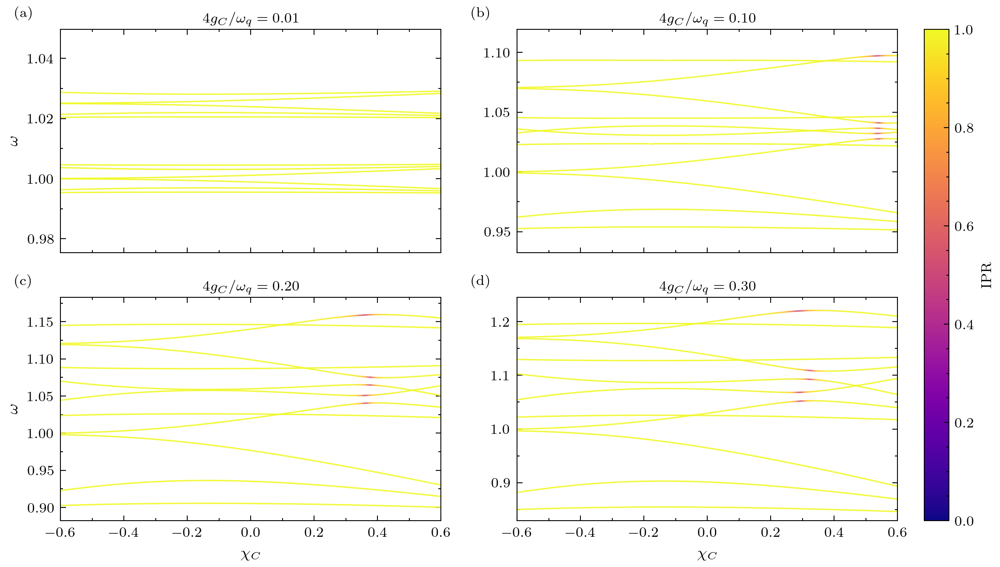

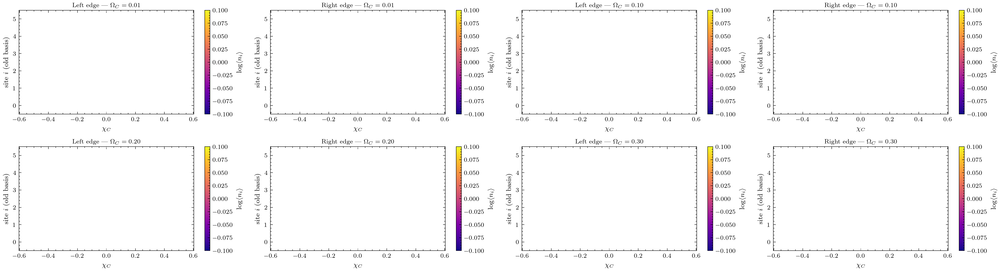

In [5]:
import matplotlib.ticker as ticker
import matplotlib.colors as mcolors
from matplotlib.collections import LineCollection

# ------------------------------------------------------------------ #
# Parámetros del sistema
# ------------------------------------------------------------------ #
N              = 3
gamma_zero     = 0.01
fock_photon    = 4
Omega_J        = 1.0
Chi_J          = 0.0
base_excitations = 1
fock_layers    = 0
k_states       = (4 * N - 1)
Omega_C_values = [0.01, 0.1, 0.2, 0.3]
Chi_C_values   = np.linspace(-0.6, 0.6, 200)
gap_threshold  = 2e-3
nrows, ncols   = 2, 2
fig_width      = 9.0
fig_height     = 5.0
panel_fontsize = 8

# ------------------------------------------------------------------ #
# Compute spectra + IPR  +  edge state quanta distributions
# ------------------------------------------------------------------ #
all_energies       = []
all_iprs           = []
all_quanta_left    = []   # (n_Omega, n_Chi, 2N)
all_quanta_right   = []

for Omega_C in Omega_C_values:
    energies_list    = []
    iprs_list        = []
    quanta_left_list = []
    quanta_right_list= []

    for Chi_C in Chi_C_values:
        aux     = 0.5 * Omega_C
        gamma   = gamma_zero * Omega_C / np.max(Omega_C_values)
        omega_r = 1.02 * np.sqrt(1 + aux) - np.sqrt(1 - aux)

        chain = PHOTONICChain(N, Omega_C, Chi_C, omega_r, gamma, fock_photon,
                              Omega_J, Chi_J, False)
        chain.matter_hamiltonians(n_excitations=base_excitations, layers=fock_layers)
        chain.build_full_hamiltonian()
        chain.build_squeezed_vacuum(truncation=1, threshold=0.99)

        # --- full spectrum for the energy diagram ---
        vals, vecs = chain.get_low_lying_spectrum(k=k_states)
        idx_sort   = np.argsort(vals)
        vals       = vals[idx_sort]
        vecs       = vecs[:, idx_sort]

        # --- IPR for each state ---
        iprs_this = []
        for col in range(vecs.shape[1]):
            evec       = vecs[:, col]
            rho_matter = chain.partial_trace(evec, which_to_keep='matter')
            evals_rho, evecs_rho = np.linalg.eigh(rho_matter)
            matter_vec = evecs_rho[:, -1]
            ipr, xi, _ = chain.quanta_ipr(matter_vec)
            iprs_this.append(ipr)

        energies_list.append(vals)
        iprs_list.append(np.array(iprs_this))

        # --- edge states via position operator on degenerate subspace ---
        evec_left, evec_right, status = get_edge_states(
            chain, chain.H, gap_threshold=gap_threshold
        )

        if evec_left is not None:
            dist_left  = evec_to_quanta_dist(chain, evec_left)
            dist_right = evec_to_quanta_dist(chain, evec_right)
        else:
            dist_left  = np.full(2 * N, np.nan)
            dist_right = np.full(2 * N, np.nan)

        quanta_left_list.append(dist_left)
        quanta_right_list.append(dist_right)

    all_energies.append(np.array(energies_list))
    all_iprs.append(np.array(iprs_list))
    all_quanta_left.append(np.array(quanta_left_list))
    all_quanta_right.append(np.array(quanta_right_list))

# ------------------------------------------------------------------ #
# Figure 1: energy diagram coloured by IPR
# ------------------------------------------------------------------ #
cmap     = plt.cm.plasma
norm_ipr = mcolors.Normalize(vmin=0.0, vmax=1.0)

fig, axes = plt.subplots(nrows=nrows, ncols=ncols,
                         figsize=(fig_width, fig_height))

for idx, (Omega_C, energies, iprs) in enumerate(
        zip(Omega_C_values, all_energies, all_iprs)):
    ax  = axes.flatten()[idx]
    row = idx // ncols
    col = idx  % ncols

    for band_e, band_ipr in zip(energies.T, iprs.T):
        points   = np.array([Chi_C_values, band_e]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)
        lc = LineCollection(segments, cmap=cmap, norm=norm_ipr,
                            linewidth=0.8, alpha=0.9)
        lc.set_array(0.5 * (band_ipr[:-1] + band_ipr[1:]))
        ax.add_collection(lc)

    ax.set_xlim(Chi_C_values[0], Chi_C_values[-1])
    e_all = energies.flatten()
    ax.set_ylim(e_all.min() - 0.02 * abs(e_all.min()),
                e_all.max() + 0.02 * abs(e_all.max()))
    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator(2))
    ax.text(-0.12, 1.04, f'({chr(97 + idx)})',
            transform=ax.transAxes,
            fontsize=panel_fontsize, fontweight='bold',
            va='bottom', ha='left')
    ax.set_title(rf'$4g_C / \omega_q = {Omega_C:.2f}$', fontsize=8, pad=4)
    if row == nrows - 1:
        ax.set_xlabel(r'$\chi_C$')
    else:
        ax.tick_params(labelbottom=False)
    if col == 0:
        ax.set_ylabel(r'$\omega$')

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm_ipr)
sm.set_array([])
cbar = fig.colorbar(sm, ax=axes, orientation='vertical',
                    fraction=0.03, pad=0.03)
cbar.set_label(r'IPR', fontsize=8)
plt.show()

# ------------------------------------------------------------------ #
# Figure 2: edge state quanta distributions
# ------------------------------------------------------------------ #
fig2, axes2 = plt.subplots(nrows=nrows, ncols=ncols * 2,
                            figsize=(fig_width * 2, fig_height))

for idx, (Omega_C, q_left, q_right) in enumerate(
        zip(Omega_C_values, all_quanta_left, all_quanta_right)):
    row   = idx // ncols
    col   = idx  % ncols
    ax_L  = axes2[row, 2 * col]
    ax_R  = axes2[row, 2 * col + 1]

    for ax, dist_list, edge_label in [
        (ax_L, q_left,  'Left'),
        (ax_R, q_right, 'Right'),
    ]:
        arr = np.clip(np.array(dist_list).T, 1e-10, None)
        im  = ax.pcolormesh(Chi_C_values, np.arange(2 * N),
                            np.log(arr), cmap='plasma', shading='auto')
        plt.colorbar(im, ax=ax, label=r'$\log\langle n_i \rangle$')
        ax.set_xlabel(r'$\chi_C$')
        ax.set_ylabel('site $i$ (old basis)')
        ax.set_title(
            rf'{edge_label} edge — $\Omega_C={Omega_C:.2f}$',
            fontsize=8, pad=4
        )
        ax.axvline(0, color='white', lw=0.8, ls='--', alpha=0.5)

fig2.tight_layout()
plt.show()